# Initialize

In [ ]:
# Standard library imports
import ast
import glob
import os
import re
import sys
import warnings

# Third-party imports

# Collections and utilities
from collections import Counter

# Data science and visualization
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm

# Natural Language Processing
import nltk
from nltk.corpus import words
from nltk.sentiment import SentimentIntensityAnalyzer
import spacy
from langdetect import detect

# Machine Learning / Deep Learning
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

import scipy.sparse
from scipy.sparse import load_npz
from scipy.special import softmax
from scipy.stats import randint

from sklearn.base import clone
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix,
                             ConfusionMatrixDisplay, roc_curve, auc, precision_recall_curve)
from sklearn.model_selection import (cross_val_score, learning_curve, RandomizedSearchCV,
                                     train_test_split, validation_curve)
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.svm import LinearSVC

from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical

# Transformers (Hugging Face)
from transformers import (AutoTokenizer, AutoModelForSequenceClassification, AutoModel,
                          pipeline)

# Warning filter for clean notebook output
if not sys.warnoptions:
    warnings.simplefilter("ignore")
    try:
        import logging
        logging.getLogger('py.warnings').setLevel(logging.ERROR)
    except:
        pass


In [ ]:
import gensim.downloader as api
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

### Plese ignore the warnings. The warnings supression is not working properly.

# Task 1 - Describe

## Structural Cleaning (DataFrame level)

In [3]:
negative_review_file_paths = sorted(glob.glob(r'hotel-reviews/raw-data/negative-reviews/*.csv'))
neutral_review_file_paths = sorted(glob.glob(r'hotel-reviews/raw-data/neutral-reviews/*.csv'))
positive_review_file_paths = sorted(glob.glob(r'hotel-reviews/raw-data/positive-reviews/*.csv'))

In [ ]:
display(negative_review_file_paths, neutral_review_file_paths, positive_review_file_paths)

In [5]:
negative_reviews_df_list = [pd.read_csv(file) for file in negative_review_file_paths]
neutral_reviews_df_list = [pd.read_csv(file) for file in neutral_review_file_paths]
positive_reviews_df_list = [pd.read_csv(file) for file in positive_review_file_paths]

In [ ]:
def print_df_info(category_name, file_paths, df_list):
    print(f"\n🔹 {category_name} Reviews:")
    for file, df in zip(file_paths, df_list):
        print(f"{os.path.basename(file)} -> shape: {df.shape}")
        print(f"   columns: {list(df.columns)}")

# Print info
print_df_info("📉 Negative", negative_review_file_paths, negative_reviews_df_list)
print_df_info("😐 Neutral", neutral_review_file_paths, neutral_reviews_df_list)
print_df_info("📈 Positive", positive_review_file_paths, positive_reviews_df_list)

In [ ]:
def find_common_columns(df_list):
    # Start with columns from the first dataframe, then intersect with others
    common_cols = set(df_list[0].columns)
    for df in df_list[1:]:
        common_cols &= set(df.columns)
    return sorted(common_cols)

# Find common columns per category
common_negative_cols = find_common_columns(negative_reviews_df_list)
common_neutral_cols = find_common_columns(neutral_reviews_df_list)
common_positive_cols = find_common_columns(positive_reviews_df_list)

print(f"\nCommon columns in Negative Reviews:\n{common_negative_cols}")
print(f"\nCommon columns in Neutral Reviews:\n{common_neutral_cols}")
print(f"\nCommon columns in Positive Reviews:\n{common_positive_cols}")


In [8]:
selected_columns = {
    'placeInfo/name': 'hotel_name',
    'placeInfo/addressObj/city': 'hotel_city',
    'text': 'review_text',
    'title': 'review_title',
    'rating': 'review_rating',
    'publishedDate': 'review_date',
    'lang': 'language',
    'tripType': 'trip_type',
    # Optional: include subratings if they exist
    'subratings/0/name': 'aspect_1_name',
    'subratings/0/value': 'aspect_1_value',
    'subratings/1/name': 'aspect_2_name',
    'subratings/1/value': 'aspect_2_value',
    'subratings/2/name': 'aspect_3_name',
    'subratings/2/value': 'aspect_3_value',
    'subratings/3/name': 'aspect_4_name',
    'subratings/3/value': 'aspect_4_value',
    'subratings/4/name': 'aspect_5_name',
    'subratings/4/value': 'aspect_5_value',
    'subratings/5/name': 'aspect_6_name',
    'subratings/5/value': 'aspect_6_value',
}

In [9]:
def remove_and_rename_cols_dfs(df_list, selected_cols):
    cleaned_dfs = []
    for df in df_list:
        # Keep only columns that exist in the current df (some may be missing)
        existing_cols = [col for col in selected_cols if col in df.columns]
        
        # Subset and rename columns
        df_clean = df[existing_cols].rename(columns={col: selected_cols[col] for col in existing_cols})
        
        # Optional: You can do basic cleaning here, e.g., drop rows with no review_text or no rating
        df_clean = df_clean.dropna(subset=['review_text', 'review_rating'])
        
        cleaned_dfs.append(df_clean)
    return cleaned_dfs

# Use your dictionary of selected columns
negative_reviews_df_list_removed_and_renamed_cols = remove_and_rename_cols_dfs(negative_reviews_df_list, selected_columns)
neutral_reviews_df_list_removed_and_renamed_cols = remove_and_rename_cols_dfs(neutral_reviews_df_list, selected_columns)
positive_reviews_df_list_removed_and_renamed_cols = remove_and_rename_cols_dfs(positive_reviews_df_list, selected_columns)

In [ ]:
def print_shapes(df_list, category_name):
    print(f"\nShapes of cleaned {category_name} review DataFrames:")
    for i, df in enumerate(df_list, 1):
        print(f"  CSV File {i}: {df.shape}")

print_shapes(negative_reviews_df_list_removed_and_renamed_cols, "Negative")
print_shapes(neutral_reviews_df_list_removed_and_renamed_cols, "Neutral")
print_shapes(positive_reviews_df_list_removed_and_renamed_cols, "Positive")


In [11]:
# Concatenate all cleaned DataFrames in each category
negative_reviews_df_concat = pd.concat(negative_reviews_df_list_removed_and_renamed_cols, ignore_index=True)
neutral_reviews_df_concat = pd.concat(neutral_reviews_df_list_removed_and_renamed_cols, ignore_index=True)
positive_reviews_df_concat = pd.concat(positive_reviews_df_list_removed_and_renamed_cols, ignore_index=True)

# Print shapes to confirm
print(f"Negative reviews combined shape: {negative_reviews_df_concat.shape}")
print(f"Neutral reviews combined shape: {neutral_reviews_df_concat.shape}")
print(f"Positive reviews combined shape: {positive_reviews_df_concat.shape}")


Negative reviews combined shape: (2267, 20)
Neutral reviews combined shape: (2290, 20)
Positive reviews combined shape: (12000, 20)


In [ ]:
display(negative_reviews_df_concat, neutral_reviews_df_concat, positive_reviews_df_concat)

In [13]:
def extract_aspect_features(df):
    # Initialize new aspect columns with NaN
    sub_review_rating_features = ['value', 'rooms', 'location', 'cleanliness', 'service', 'sleep_quality']
    aspect_features = ['value', 'rooms', 'location', 'cleanliness', 'service', 'sleep quality']
    for feature in sub_review_rating_features:
        df[feature] = np.nan
    
    # For each aspect slot (1 to 6), check if aspect name matches, then fill value
    for i in range(1, 7):
        name_col = f'aspect_{i}_name'
        value_col = f'aspect_{i}_value'
        if name_col in df.columns and value_col in df.columns:
            for j in range(6):
                mask = df[name_col].str.lower() == aspect_features[j]
                # Update the feature column only where aspect name matches
                # print(mask, df.loc[mask, aspect_features[j]])
                df.loc[mask, sub_review_rating_features[j]] = pd.to_numeric(df.loc[mask, value_col], errors='coerce')

    # Drop original aspect columns
    aspect_cols_to_drop = [f'aspect_{i}_name' for i in range(1,7)] + [f'aspect_{i}_value' for i in range(1,7)]
    df = df.drop(columns=[col for col in aspect_cols_to_drop if col in df.columns])
    
    return df

# Apply on each category DataFrame
negative_reviews_df_aspect_extracted = extract_aspect_features(negative_reviews_df_concat.copy())
neutral_reviews_df_aspect_extracted = extract_aspect_features(neutral_reviews_df_concat.copy())
positive_reviews_df_aspect_extracted = extract_aspect_features(positive_reviews_df_concat.copy())

In [ ]:
display(negative_reviews_df_aspect_extracted, neutral_reviews_df_aspect_extracted, positive_reviews_df_aspect_extracted)

In [ ]:
# Show duplicate rows in Negative Reviews
print("🔴 Negative Review Duplicates:")
display(negative_reviews_df_aspect_extracted[negative_reviews_df_aspect_extracted.duplicated(subset=['review_text'], keep=False)])

# Show duplicate rows in Neutral Reviews
print("🟡 Neutral Review Duplicates:")
display(neutral_reviews_df_aspect_extracted[neutral_reviews_df_aspect_extracted.duplicated(subset=['review_text'], keep=False)])

# Show duplicate rows in Positive Reviews
print("🟢 Positive Review Duplicates:")
display(positive_reviews_df_aspect_extracted[positive_reviews_df_aspect_extracted.duplicated(subset=['review_text'], keep=False)])

In [16]:
negative_reviews_df_duplicates_removed = negative_reviews_df_aspect_extracted.drop_duplicates(subset=['review_text'])
neutral_reviews_df_duplicates_removed = neutral_reviews_df_aspect_extracted.drop_duplicates(subset=['review_text'])
positive_reviews_df_duplicates_removed = positive_reviews_df_aspect_extracted.drop_duplicates(subset=['review_text'])

In [ ]:
display(negative_reviews_df_duplicates_removed, neutral_reviews_df_duplicates_removed, positive_reviews_df_duplicates_removed)

In [18]:
negative_reviews_df_structure_cleaned = negative_reviews_df_duplicates_removed[['hotel_name', 'review_text']]
neutral_reviews_df_structure_cleaned = neutral_reviews_df_duplicates_removed[['hotel_name', 'review_text']]
positive_reviews_df_structure_cleaned = positive_reviews_df_duplicates_removed[['hotel_name', 'review_text']]

In [ ]:
display(negative_reviews_df_structure_cleaned, neutral_reviews_df_structure_cleaned, positive_reviews_df_structure_cleaned)

In [20]:
negative_reviews_df_added_rating_based_sentiment = negative_reviews_df_structure_cleaned.copy()
neutral_reviews_df_added_rating_based_sentiment = neutral_reviews_df_structure_cleaned.copy()
positive_reviews_df_added_rating_based_sentiment = positive_reviews_df_structure_cleaned.copy()

In [21]:
negative_reviews_df_added_rating_based_sentiment.loc[:, 'rating_based_sentiment'] = 'negative'
neutral_reviews_df_added_rating_based_sentiment.loc[:, 'rating_based_sentiment'] = 'neutral'
positive_reviews_df_added_rating_based_sentiment.loc[:, 'rating_based_sentiment'] = 'positive'

In [ ]:
display(negative_reviews_df_added_rating_based_sentiment, neutral_reviews_df_added_rating_based_sentiment, positive_reviews_df_added_rating_based_sentiment)

In [23]:
# Combine into one DataFrame
reviews_df_concat = pd.concat([negative_reviews_df_added_rating_based_sentiment, neutral_reviews_df_added_rating_based_sentiment, positive_reviews_df_added_rating_based_sentiment], ignore_index=True)

In [ ]:
display(reviews_df_concat)

In [302]:
reviews_df_structure_cleaned = reviews_df_concat.copy()

## Textual Cleaning (Review content level)

In [ ]:
reviews_df_structure_cleaned

In [304]:
print("🔹 Raw Dataset Info")
print("Total reviews:", len(reviews_df_structure_cleaned))
print("Number of hotels:", reviews_df_structure_cleaned['hotel_name'].nunique())
print("Reviews per hotel:")
display(reviews_df_structure_cleaned.groupby('hotel_name').size().sort_values(ascending=False))

🔹 Raw Dataset Info
Total reviews: 16556
Number of hotels: 200
Reviews per hotel:


hotel_name
98 Acres Resort & Spa                     100
Hunas Falls Hotel                         100
Jetwing Vil Uyana, A Luxury Reserve       100
Jetwing St. Andrew's                      100
Jetwing Saman Villas, A Luxury Reserve    100
                                         ... 
Max Wadiya                                 60
The Bellwood Manor                         60
Heaven By O                                60
The Palms                                  60
The Heritage Galle Fort                    60
Length: 200, dtype: int64

In [305]:
reviews_df_lowercased = reviews_df_structure_cleaned.copy()

In [306]:
reviews_df_lowercased['review_text'] = reviews_df_structure_cleaned['review_text'].astype(str).str.lower()

In [ ]:
reviews_df_lowercased

In [310]:
reviews_df_added_raw_tokens = reviews_df_lowercased.copy()

In [311]:
nlp = spacy.load("en_core_web_md")  # Load the medium model for better accuracy

In [312]:
def spacy_process(text):
    doc = nlp(text)
    tokens = [
        token.lemma_.lower()  # Lemmatize and lowercase
        for token in doc
        if token.is_alpha  # Keep alphabetic tokens only (no punctuation, numbers)
        and not token.is_stop  # Remove stopwords like "was", "and", "the"
    ]
    return tokens

In [313]:
# Apply to your DataFrame column
reviews_df_added_raw_tokens['raw_tokens'] = reviews_df_lowercased['review_text'].apply(spacy_process)

In [ ]:
reviews_df_added_raw_tokens

In [317]:
reviews_df_raw_datsset = reviews_df_added_raw_tokens.copy()
reviews_df_raw_datsset.to_csv(r'raw-dataset/raw-dataset.csv', index=False)

In [69]:
reviews_df_added_non_english_alphabetical_tokens = reviews_df_added_raw_tokens.copy()

In [70]:
english_only_pattern = re.compile(r"^[a-z]+$")  # a–z only

In [71]:
def is_non_english_alphabetical_token(word):
    return not bool(english_only_pattern.match(word))   # Only English letters

In [72]:
def filter_non_english_alphabetical_tokens(tokens):
    return [word for word in tokens if is_non_english_alphabetical_token(word)]

In [73]:
reviews_df_added_non_english_alphabetical_tokens['non_english_alphabetical_tokens'] = reviews_df_added_raw_tokens['raw_tokens'].apply(filter_non_english_alphabetical_tokens)

In [ ]:
reviews_df_added_non_english_alphabetical_tokens

In [75]:
reviews_df_filter_by_non_english_alphabetical_tokens = reviews_df_added_non_english_alphabetical_tokens.copy()

In [88]:
reviews_df_filter_by_non_english_alphabetical_tokens = reviews_df_added_non_english_alphabetical_tokens[reviews_df_added_non_english_alphabetical_tokens['non_english_alphabetical_tokens'].apply(len) == 0]
reviews_df_filter_by_non_english_alphabetical_tokens = reviews_df_filter_by_non_english_alphabetical_tokens.drop(columns=['non_english_alphabetical_tokens'])

In [ ]:
reviews_df_filter_by_non_english_alphabetical_tokens

In [115]:
reviews_df_added_english_language_tokens = reviews_df_filter_by_non_english_alphabetical_tokens.copy()

In [116]:
# Filter tokens based on NLTK English vocabulary words corpus
english_vocab = set(w.lower() for w in words.words())

In [117]:
def filter_english_language_tokens(tokens):
    return [token for token in tokens if token.isalpha() and token.lower() in english_vocab]

In [118]:
reviews_df_added_english_language_tokens['english_language_tokens'] = reviews_df_filter_by_non_english_alphabetical_tokens['raw_tokens'].apply(filter_english_language_tokens)

In [ ]:
reviews_df_added_english_language_tokens

In [188]:
reviews_df_added_english_language_tokens_count = reviews_df_added_english_language_tokens.copy()

In [189]:
reviews_df_added_english_language_tokens_count['english_language_tokens_count'] = reviews_df_added_english_language_tokens['english_language_tokens'].apply(len)

In [ ]:
reviews_df_added_english_language_tokens_count

In [199]:
reviews_df_filter_by_english_language_tokens_count = reviews_df_added_english_language_tokens_count.copy()

In [200]:
reviews_df_filter_by_english_language_tokens_count = reviews_df_added_english_language_tokens_count[reviews_df_added_english_language_tokens_count['english_language_tokens_count'] > 20]

In [ ]:
reviews_df_filter_by_english_language_tokens_count

In [224]:
reviews_df_added_non_english_language_tokens = reviews_df_filter_by_english_language_tokens_count.copy()

In [225]:
def filter_non_english_language_tokens(tokens):
    return [token for token in tokens if token.lower() not in english_vocab]

In [226]:
reviews_df_added_non_english_language_tokens['non_english_language_tokens'] = reviews_df_filter_by_english_language_tokens_count['raw_tokens'].apply(filter_non_english_language_tokens)

In [ ]:
reviews_df_added_non_english_language_tokens

In [231]:
reviews_df_added_non_english_language_tokens_count = reviews_df_added_non_english_language_tokens.copy()

In [232]:
reviews_df_added_non_english_language_tokens_count['no_english_language_tokens_count'] = reviews_df_added_non_english_language_tokens['non_english_language_tokens'].apply(len)

In [ ]:
reviews_df_added_non_english_language_tokens_count

In [239]:
reviews_added_token_counts_difference = reviews_df_added_non_english_language_tokens_count.copy()

In [240]:
reviews_added_token_counts_difference['token_counts_difference'] = reviews_df_added_non_english_language_tokens_count['english_language_tokens_count'] - reviews_df_added_non_english_language_tokens_count['no_english_language_tokens_count']

In [ ]:
reviews_added_token_counts_difference

In [ ]:
reviews_added_token_counts_difference[reviews_added_token_counts_difference['token_counts_difference'] < 10]

In [254]:
reviews_df_filter_by_tokens_count_difference = reviews_added_token_counts_difference.copy()

In [255]:
reviews_df_filter_by_tokens_count_difference = reviews_added_token_counts_difference[reviews_added_token_counts_difference['token_counts_difference'] > 10]

In [ ]:
reviews_df_filter_by_tokens_count_difference

In [259]:
reviews_df_added_langdetect_language = reviews_df_filter_by_tokens_count_difference[['hotel_name', 'review_text', 'rating_based_sentiment', 'raw_tokens']].copy()

In [260]:
# Helper function to detect language from tokens
def detect_language(tokens):
    try:
        text = ' '.join(tokens)
        return detect(text)
    except:
        return 'unknown'

In [261]:
reviews_df_added_langdetect_language['langdetect_language'] = reviews_df_filter_by_tokens_count_difference['english_language_tokens'].apply(detect_language)

In [ ]:
reviews_df_added_langdetect_language

In [ ]:
reviews_df_added_langdetect_language[reviews_df_added_langdetect_language['langdetect_language'] != 'en']

In [290]:
reviews_df_filter_by_langdetect_language = reviews_df_added_langdetect_language[['hotel_name', 'review_text', 'rating_based_sentiment', 'raw_tokens']].drop(index=6902)

In [ ]:
reviews_df_filter_by_langdetect_language

In [318]:
reviews_df_clean_datsset = reviews_df_filter_by_langdetect_language.copy()
reviews_df_clean_datsset.to_csv(r'clean-dataset/clean-dataset.csv', index=False)

In [319]:
print("🔹 Final Dataset Info")

# Total reviews
print("Total reviews:", len(reviews_df_clean_datsset))

# Total number of unique hotels
print("Total hotels:", reviews_df_clean_datsset['hotel_name'].nunique())

# Reviews per hotel (all sentiments)
print("\n📋 Reviews per hotel (total):")
display(reviews_df_clean_datsset['hotel_name'].value_counts())

# Reviews per hotel per sentiment
print("\n📋 Reviews per hotel per sentiment:")
reviews_per_hotel_sentiment = reviews_df_clean_datsset.groupby(['hotel_name', 'rating_based_sentiment']).size().unstack(fill_value=0)
display(reviews_per_hotel_sentiment.sort_values(by=reviews_per_hotel_sentiment.columns.tolist(), ascending=False))

# Sentiment distribution
print("\n📈 Sentiment distribution (overall):")
display(reviews_df_clean_datsset['rating_based_sentiment'].value_counts())

🔹 Final Dataset Info
Total reviews: 11317
Total hotels: 200

📋 Reviews per hotel (total):


hotel_name
Hilton Colombo Residences              91
The Villa Bentota by KK Collection     88
Adigar's Manor                         86
Galle Fort Hotel                       86
Jetwing Vil Uyana, A Luxury Reserve    85
                                       ..
The Palms                              23
Sigiriya Village Hotel                 18
Karunakarala Ayurveda Resort           14
The Garden Beach Ayurveda Resort       12
Mayavee Resort & Spa                    8
Name: count, Length: 200, dtype: int64


📋 Reviews per hotel per sentiment:


rating_based_sentiment,negative,neutral,positive
hotel_name,,,
Chaarya Resort & Spa,20,17,37
The Villa Bentota by KK Collection,19,18,51
Hunas Falls Hotel,19,18,40
Jaffna Heritage Hotel,19,17,44
Tamarind Tree Garden Resort,19,17,43
...,...,...,...
Sigiriya Forest Edge By Marino Leisure,0,0,33
Heaven By O,0,0,29
Nh Bentota Ceysands Resort,0,0,25



📈 Sentiment distribution (overall):


rating_based_sentiment
positive    7655
neutral     1833
negative    1829
Name: count, dtype: int64

## Descriptive Analysis & Exploratory Data Analysis (EDA)

In [320]:
reviews_df_raw_datsset = pd.read_csv(r'raw-dataset/raw-dataset.csv')

reviews_df_raw_datsset['raw_tokens'] = reviews_df_raw_datsset['raw_tokens'].apply(ast.literal_eval)

In [ ]:
reviews_df_raw_datsset

In [ ]:
reviews_df_clean_datsset = pd.read_csv(r'clean-dataset/clean-dataset.csv')

reviews_df_clean_datsset['raw_tokens'] = reviews_df_clean_datsset['raw_tokens'].apply(ast.literal_eval)

In [ ]:
reviews_df_clean_datsset

### Descriptive Analysis

In [324]:
# Number of unique hotels
num_hotels_raw = reviews_df_raw_datsset['hotel_name'].nunique()

# Number of reviews per hotel
reviews_per_hotel_raw = reviews_df_raw_datsset['hotel_name'].value_counts()

# Flatten list of raw tokens
all_words_raw = reviews_df_raw_datsset['raw_tokens'].sum()

# Total number of words in raw corpus
total_corpus_words_raw = len(all_words_raw)

# Unique words in raw corpus
total_unique_corpus_words_raw = len(set(all_words_raw))

# Print summary
print("🔹 RAW Dataset Summary")
print(f"Number of hotels: {num_hotels_raw}")
print(f"Total number of reviews: {len(reviews_df_raw_datsset)}")
print(f"Total number of words in raw corpus: {total_corpus_words_raw}")
print(f"Number of unique words in raw corpus: {total_unique_corpus_words_raw}")
print("\nNumber of reviews per hotel:")
display(reviews_per_hotel_raw)

🔹 RAW Dataset Summary
Number of hotels: 200
Total number of reviews: 16556
Total number of words in raw corpus: 930404
Number of unique words in raw corpus: 49962

Number of reviews per hotel:


hotel_name
Coral Rock By Bansei            100
Cinnamon Wild Yala              100
The Golden Crown Hotel          100
Habarana Village By Cinnamon    100
Marino Beach Colombo            100
                               ... 
Heaven By O                      60
Whisky Point Resort              60
Max Wadiya                       60
The Bellwood Manor               60
Pegasus Reef Hotel               60
Name: count, Length: 200, dtype: int64

In [326]:
# Number of unique hotels
num_hotels_clean = reviews_df_clean_datsset['hotel_name'].nunique()

# Number of reviews per hotel
reviews_per_hotel_clean = reviews_df_clean_datsset['hotel_name'].value_counts()

# Flatten list of clean tokens
all_words_clean = reviews_df_clean_datsset['raw_tokens'].sum()

# Total number of words in clean corpus
total_corpus_words_clean = len(all_words_clean)

# Unique words in clean corpus
total_unique_corpus_words_clean = len(set(all_words_clean))

# Print summary
print("🔹 CLEAN Dataset Summary")
print(f"Number of hotels: {num_hotels_clean}")
print(f"Total number of reviews: {len(reviews_df_clean_datsset)}")
print(f"Total number of words in clean corpus: {total_corpus_words_clean}")
print(f"Number of unique words in clean corpus: {total_unique_corpus_words_clean}")
print("\nNumber of reviews per hotel:")
display(reviews_per_hotel_clean)

🔹 CLEAN Dataset Summary
Number of hotels: 200
Total number of reviews: 11317
Total number of words in clean corpus: 682619
Number of unique words in clean corpus: 20027

Number of reviews per hotel:


hotel_name
Hilton Colombo Residences              91
The Villa Bentota by KK Collection     88
Adigar's Manor                         86
Galle Fort Hotel                       86
Jetwing Vil Uyana, A Luxury Reserve    85
                                       ..
The Palms                              23
Sigiriya Village Hotel                 18
Karunakarala Ayurveda Resort           14
The Garden Beach Ayurveda Resort       12
Mayavee Resort & Spa                    8
Name: count, Length: 200, dtype: int64

In [328]:
reviews_df_raw_datsset_added_raw_token_count = reviews_df_raw_datsset.copy()
reviews_df_clean_datsset_added_raw_token_count = reviews_df_clean_datsset.copy()

In [329]:
reviews_df_raw_datsset_added_raw_token_count['raw_token_count'] = reviews_df_raw_datsset['raw_tokens'].apply(len)
reviews_df_clean_datsset_added_raw_token_count['raw_token_count'] = reviews_df_clean_datsset['raw_tokens'].apply(len)

In [ ]:
display(reviews_df_raw_datsset_added_raw_token_count)
display(reviews_df_clean_datsset_added_raw_token_count)

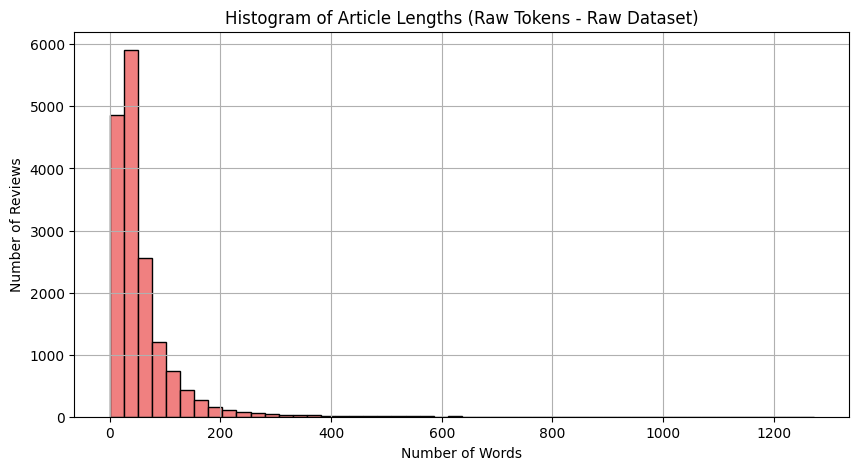

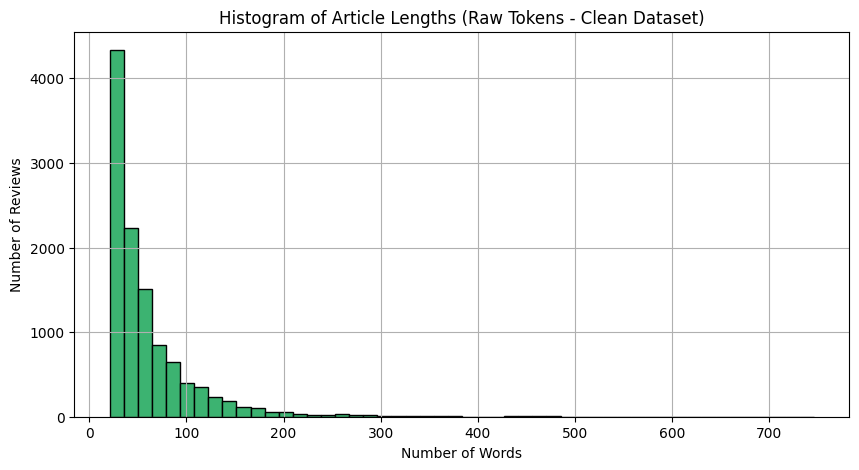

In [332]:
# Plot: Raw
plt.figure(figsize=(10, 5))
plt.hist(reviews_df_raw_datsset_added_raw_token_count['raw_token_count'], bins=50, color='lightcoral', edgecolor='black')
plt.title("Histogram of Article Lengths (Raw Tokens - Raw Dataset)")
plt.xlabel("Number of Words")
plt.ylabel("Number of Reviews")
plt.grid(True)
plt.show()

# Plot: Cleaned
plt.figure(figsize=(10, 5))
plt.hist(reviews_df_clean_datsset_added_raw_token_count['raw_token_count'], bins=50, color='mediumseagreen', edgecolor='black')
plt.title("Histogram of Article Lengths (Raw Tokens - Clean Dataset)")
plt.xlabel("Number of Words")
plt.ylabel("Number of Reviews")
plt.grid(True)
plt.show()

### Exploratory Data Analysis (EDA)

In [ ]:
display(reviews_df_raw_datsset_added_raw_token_count)
display(reviews_df_clean_datsset_added_raw_token_count)

#### Review Sentiment Distribution

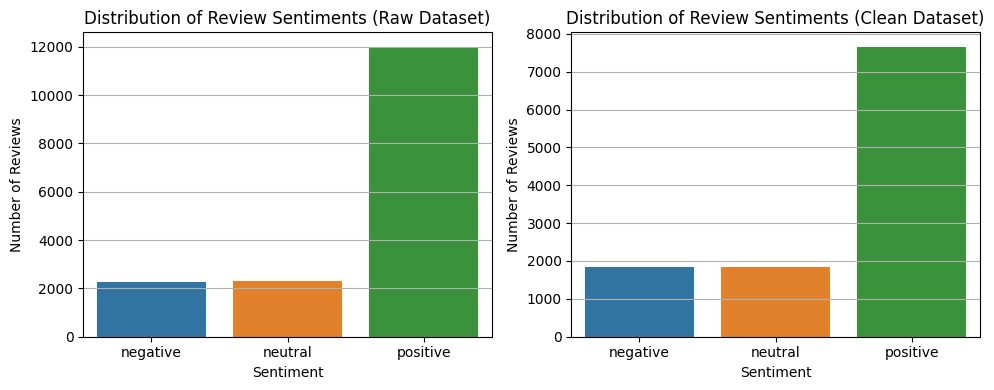

In [334]:
plt.figure(figsize=(10, 4))

# Left plot: Raw dataset
plt.subplot(1, 2, 1)
sns.countplot(data=reviews_df_raw_datsset_added_raw_token_count, x='rating_based_sentiment', hue='rating_based_sentiment')
plt.title("Distribution of Review Sentiments (Raw Dataset)")
plt.xlabel("Sentiment")
plt.ylabel("Number of Reviews")
plt.grid(axis='y')

# Right plot: Cleaned dataset
plt.subplot(1, 2, 2)
sns.countplot(data=reviews_df_clean_datsset_added_raw_token_count, x='rating_based_sentiment', hue='rating_based_sentiment')
plt.title("Distribution of Review Sentiments (Clean Dataset)")
plt.xlabel("Sentiment")
plt.ylabel("Number of Reviews")
plt.grid(axis='y')

# Show both together
plt.tight_layout()
plt.show()

#### Reviews per Hotel

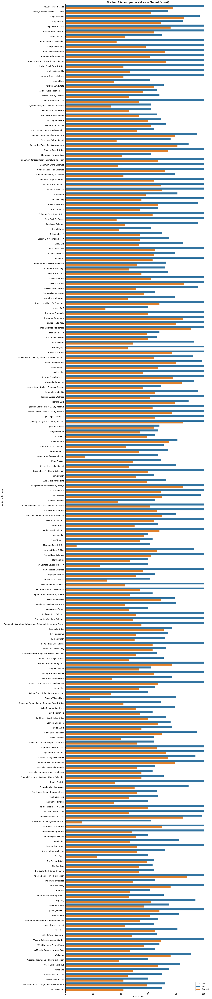

In [335]:
# Count reviews per hotel in both datasets
hotel_counts_raw = reviews_df_raw_datsset_added_raw_token_count['hotel_name'].value_counts().sort_index()
hotel_counts_clean = reviews_df_clean_datsset_added_raw_token_count['hotel_name'].value_counts().sort_index()

# Combine into one DataFrame for plotting
hotel_counts_combined = pd.DataFrame({
    'Raw': hotel_counts_raw,
    'Cleaned': hotel_counts_clean
}).fillna(0)  # In case a hotel is missing in one dataset

# Reset index for plotting
hotel_counts_combined = hotel_counts_combined.reset_index().rename(columns={'hotel_name': 'Hotel Name'})

# Melt for seaborn (long format)
hotel_counts_long = hotel_counts_combined.melt(id_vars='Hotel Name', 
                                               value_vars=['Raw', 'Cleaned'],
                                               var_name='Dataset',
                                               value_name='Review Count')

# Plot
plt.figure(figsize=(16, 75))
sns.barplot(data=hotel_counts_long, 
            x='Review Count', 
            y='Hotel Name', 
            hue='Dataset')

plt.title("Number of Reviews per Hotel (Raw vs Cleaned Dataset)")
plt.xlabel("Hotel Name")
plt.ylabel("Number of Reviews")
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()


#### Review Length by Sentiment

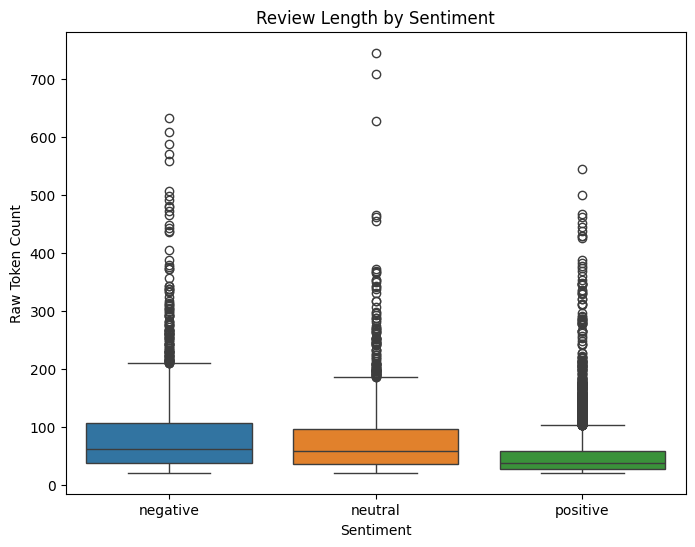

In [337]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=reviews_df_clean_datsset_added_raw_token_count, 
            x='rating_based_sentiment', 
            y='raw_token_count', 
            hue='rating_based_sentiment')
plt.title("Review Length by Sentiment")
plt.xlabel("Sentiment")
plt.ylabel("Raw Token Count")
plt.show()


#### Top 100 Most Frequent Words (Cleaned)

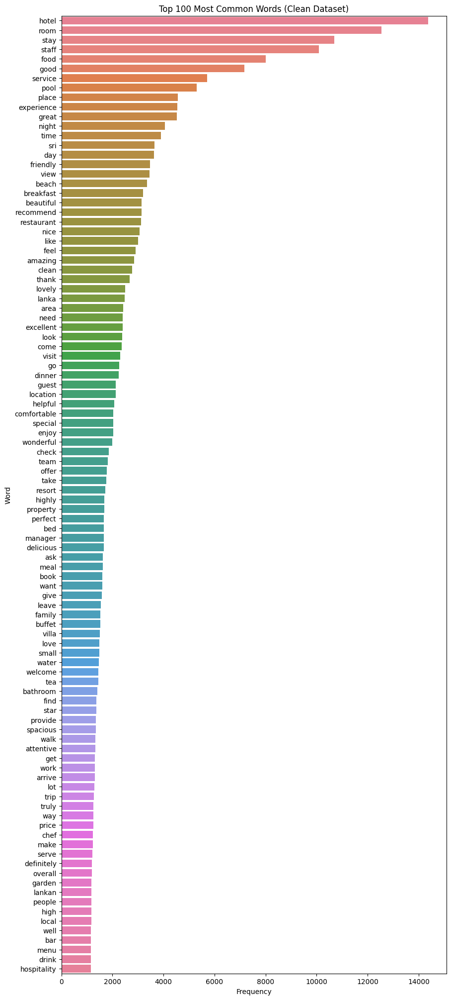

In [339]:
# Flatten and count
tokens_sum = reviews_df_clean_datsset_added_raw_token_count['raw_tokens'].sum()
top_words = Counter(tokens_sum).most_common(100)

# Unzip for plotting
words, counts = zip(*top_words)

plt.figure(figsize=(10, 25))
sns.barplot(x=list(counts), y=list(words), hue=list(words))
plt.title("Top 100 Most Common Words (Clean Dataset)")
plt.xlabel("Frequency")
plt.ylabel("Word")
plt.show()

#### Average Review Length per Hotel

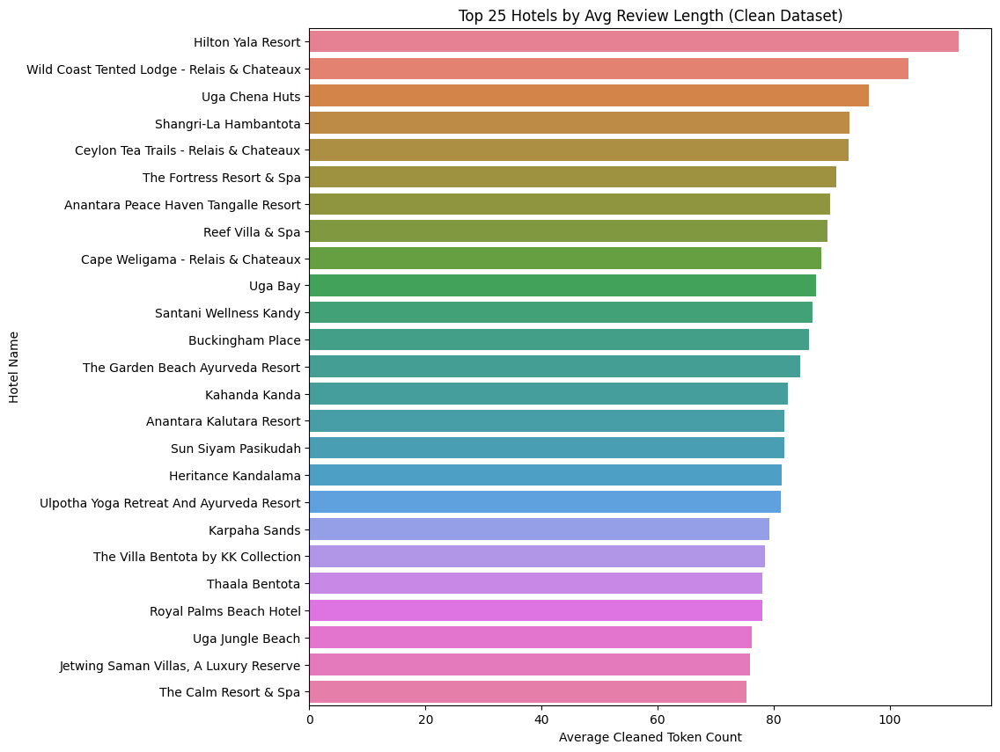

In [341]:
avg_lengths = reviews_df_clean_datsset_added_raw_token_count.groupby('hotel_name')['raw_token_count'].mean().sort_values(ascending=False).head(25)

plt.figure(figsize=(10, 10))
sns.barplot(x=avg_lengths.values, y=avg_lengths.index, hue=avg_lengths.index)
plt.title("Top 25 Hotels by Avg Review Length (Clean Dataset)")
plt.xlabel("Average Cleaned Token Count")
plt.ylabel("Hotel Name")
plt.show()


# Task 2 - Establishing Ground Truth

## Sentiment Classifiers

In [ ]:
reviews_df_clean_datsset = pd.read_csv(r'clean-dataset/clean-dataset.csv')

reviews_df_clean_datsset['raw_tokens'] = reviews_df_clean_datsset['raw_tokens'].apply(ast.literal_eval)

### VADER (Lexicon-Based)

In [ ]:
reviews_df_added_vader_sentiment = reviews_df_clean_datsset.copy()

In [ ]:
vader = SentimentIntensityAnalyzer()

def get_vader_sentiment(text, positive_threshold = 0.8, negative_threshold = 0.5):
    score = vader.polarity_scores(text)['compound']
    if score >= positive_threshold:
        return 'positive'
    elif score <= negative_threshold:
        return 'negative'
    else:
        return 'neutral'

In [ ]:
# Generate threshold ranges
vader_threshold_range = np.round(np.arange(-1.0, 1.01, 0.1), 2)
vader_threshold_range

array([-1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1, -0. ,
        0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ])

In [ ]:
# Store results
vader_match_results = []

# Sweep both positive and negative thresholds
for positive_threshold in vader_threshold_range:
    for negative_threshold in vader_threshold_range:
        # Skip invalid cases (positive threshold must be > negative threshold)
        # print(f"Testing thresholds: Positive={positive_threshold}, Negative={negative_threshold}")
        if positive_threshold > negative_threshold:
            # Apply sentiment function
            sentiments = reviews_df_clean_datsset['review_text'].apply(
                lambda x: get_vader_sentiment(x, positive_threshold=positive_threshold, negative_threshold=negative_threshold)
            )

            # Compare with rating-based sentiment
            matches = (sentiments == reviews_df_clean_datsset['rating_based_sentiment']).sum()
        else:
            matches = 0

        vader_match_results.append({
            'positive_threshold': positive_threshold,
            'negative_threshold': negative_threshold,
            'match_count': matches
        })

In [ ]:
# Convert results to DataFrame
vader_match_results_df = pd.DataFrame(vader_match_results)

In [ ]:
vader_match_results_df

In [ ]:
# Find best thresholds
best_row = vader_match_results_df.loc[vader_match_results_df['match_count'].idxmax()]
best_pos = best_row['positive_threshold']
best_neg = best_row['negative_threshold']
best_match = best_row['match_count']

print(f"✅ Best Thresholds — Positive: {best_pos}, Negative: {best_neg} with Matches: {best_match}")

✅ Best Thresholds — Positive: 0.8, Negative: 0.5 with Matches: 8885.0


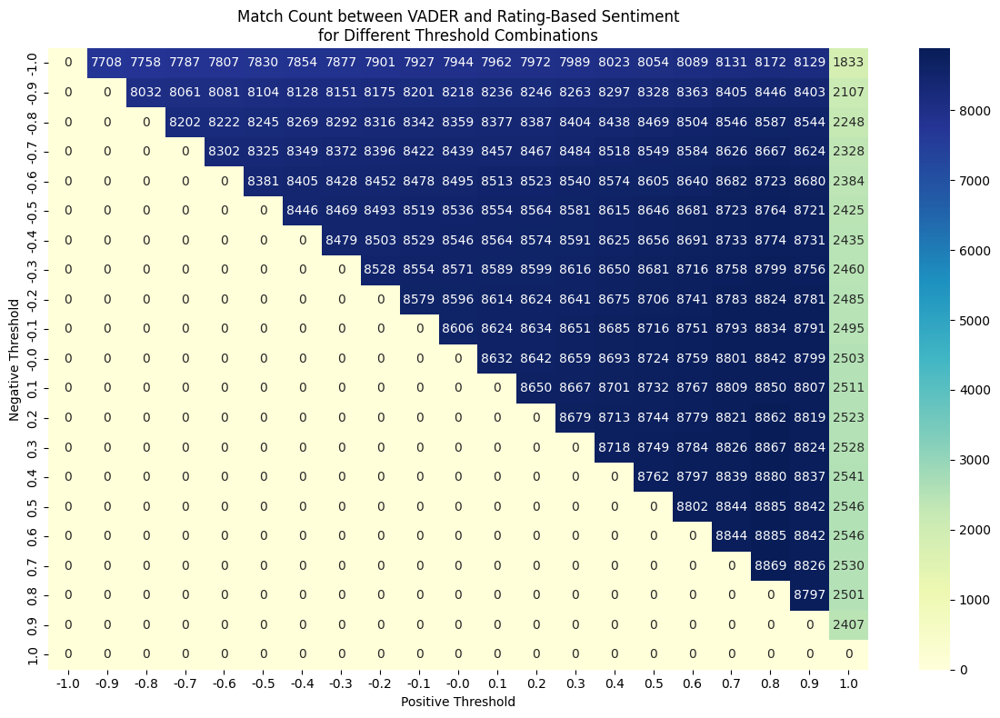

In [ ]:
# Pivot for heatmap
heatmap_df = vader_match_results_df.pivot(
    index='negative_threshold',
    columns='positive_threshold',
    values='match_count'
)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_df, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Match Count between VADER and Rating-Based Sentiment\nfor Different Threshold Combinations')
plt.xlabel('Positive Threshold')
plt.ylabel('Negative Threshold')
plt.tight_layout()
plt.show()


In [ ]:
reviews_df_added_vader_sentiment['vader_sentiment'] = reviews_df_clean_datsset['review_text'].apply(
    lambda x: get_vader_sentiment(x, positive_threshold=best_pos, negative_threshold=best_neg)
)

In [ ]:
reviews_df_added_vader_sentiment

In [ ]:
reviews_df_added_vader_sentiment[reviews_df_added_vader_sentiment['vader_sentiment'] != reviews_df_added_vader_sentiment['rating_based_sentiment']]

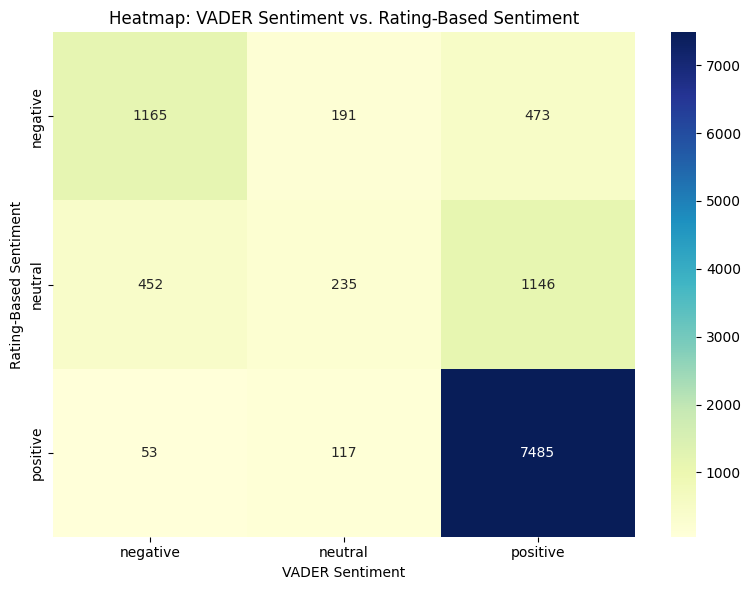

In [ ]:
# Step 1: Create a confusion matrix (cross-tabulation)
confusion_mat = pd.crosstab(
    reviews_df_added_vader_sentiment['rating_based_sentiment'],
    reviews_df_added_vader_sentiment['vader_sentiment'],
    rownames=['Rating-Based Sentiment'],
    colnames=['VADER Sentiment']
)

# Step 2: Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap: VADER Sentiment vs. Rating-Based Sentiment')
plt.tight_layout()
plt.show()

### Bert Based (Transformer-Model)

HuggingFace Model: nlptown/bert-base-multilingual-uncased-sentiment

In [ ]:
dataset_raw = pd.read_csv('dataset-raw.csv')

In [ ]:
reviews_df_added_vader_sentiment = dataset_raw.copy()
reviews_df_clean_datsset = dataset_raw.copy()

In [ ]:
reviews_df_added_vader_sentiment

In [ ]:
reviews_df_added_bert_sentiment = reviews_df_added_vader_sentiment.copy()

In [ ]:
# Load the model explicitly
nlptown_pipe = pipeline(
    "sentiment-analysis",
    model="nlptown/bert-base-multilingual-uncased-sentiment"
)

Device set to use mps:0


In [ ]:
def get_bert_sentiment(text, negative_threshold=1+4*(1/3), positive_threshold=1+4*(2/3), chunk_size=512):
    try:
        chunks = [text[i:i+chunk_size] for i in range(0, len(text), chunk_size)]
        # print(chunks)  # Debugging output
        stars = [nlptown_pipe(chunk)[0]['label'] for chunk in chunks]
        # print(stars)  # Debugging output
        stars_mean = np.mean([int(star.split()[0]) for star in stars])
        # print(stars_mean)  # Debugging output

        if stars_mean < negative_threshold:
            return "negative"
        elif stars_mean > positive_threshold:
            return "positive"
        else:
            return "neutral"
    except:
        print(f"Exception occurred!")
        print(f"Text: {text}")
        return 'neutral'

In [ ]:
# Generate threshold ranges
bert_threshold_range = np.round(np.arange(1.5, 4.51, 0.5), 2)
bert_threshold_range

array([1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5])

In [ ]:
# Store results
bert_match_results = []

# Sweep both positive and negative thresholds
for positive_threshold in bert_threshold_range:
    for negative_threshold in bert_threshold_range:
        # Skip invalid cases (positive threshold must be > negative threshold)
        print(f"Testing thresholds: Positive={positive_threshold}, Negative={negative_threshold}")
        if positive_threshold > negative_threshold:
            # Apply sentiment function
            sentiments = reviews_df_clean_datsset['review_text'].apply(
                lambda x: get_bert_sentiment(x, positive_threshold=positive_threshold, negative_threshold=negative_threshold)
            )

            # Compare with rating-based sentiment
            matches = (sentiments == reviews_df_clean_datsset['rating_based_sentiment']).sum()
        else:
            matches = 0

        bert_match_results.append({
            'positive_threshold': positive_threshold,
            'negative_threshold': negative_threshold,
            'match_count': matches
        })

In [ ]:
# Convert results to DataFrame
bert_match_results_df = pd.DataFrame(bert_match_results)

In [ ]:
bert_match_results_df

In [ ]:
# Find best thresholds
best_row = bert_match_results_df.loc[bert_match_results_df['match_count'].idxmax()]
best_pos = best_row['positive_threshold']
best_neg = best_row['negative_threshold']
best_match = best_row['match_count']

print(f"✅ Best Thresholds — Positive: {best_pos}, Negative: {best_neg} with Matches: {best_match}")

✅ Best Thresholds — Positive: 3.5, Negative: 2.5 with Matches: 9614.0


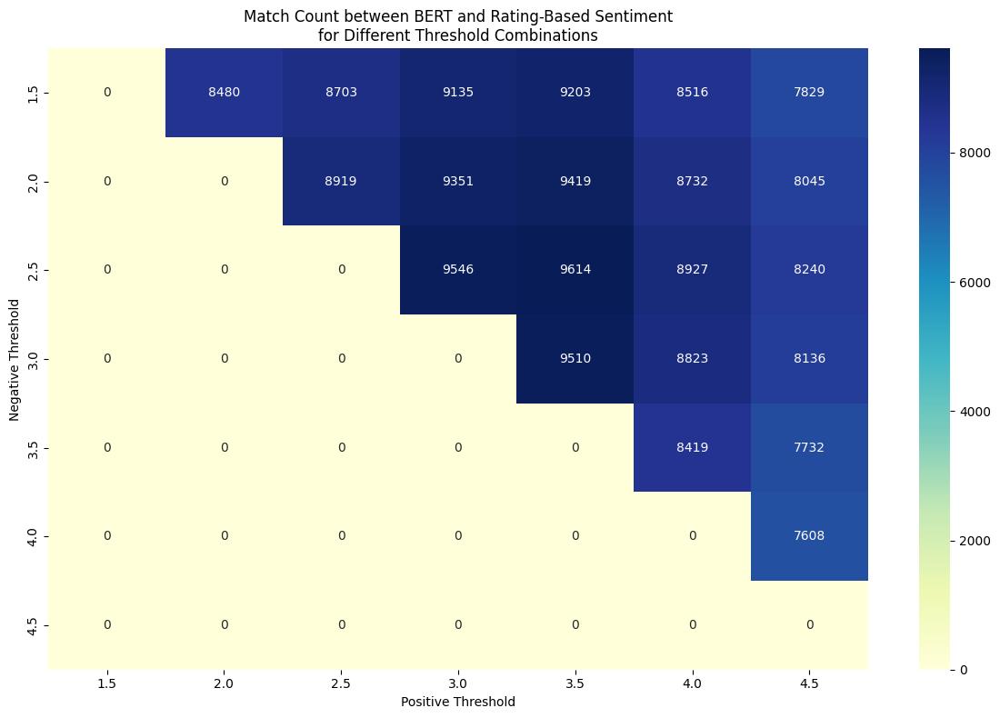

In [ ]:
# Pivot for heatmap
heatmap_df = bert_match_results_df.pivot(
    index='negative_threshold',
    columns='positive_threshold',
    values='match_count'
)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_df, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Match Count between BERT and Rating-Based Sentiment\nfor Different Threshold Combinations')
plt.xlabel('Positive Threshold')
plt.ylabel('Negative Threshold')
plt.tight_layout()
plt.show()


In [ ]:
reviews_df_added_bert_sentiment['bert_sentiment'] = reviews_df_added_vader_sentiment['review_text'].apply(
    lambda x: get_bert_sentiment(x, positive_threshold=best_pos, negative_threshold=best_neg)
)

In [ ]:
reviews_df_added_bert_sentiment['bert_sentiment'] = reviews_df_added_vader_sentiment['review_text'].apply(get_bert_sentiment)

In [ ]:
reviews_df_added_bert_sentiment

In [ ]:
reviews_df_added_bert_sentiment[reviews_df_added_bert_sentiment['bert_sentiment'] != reviews_df_added_bert_sentiment['rating_based_sentiment']]

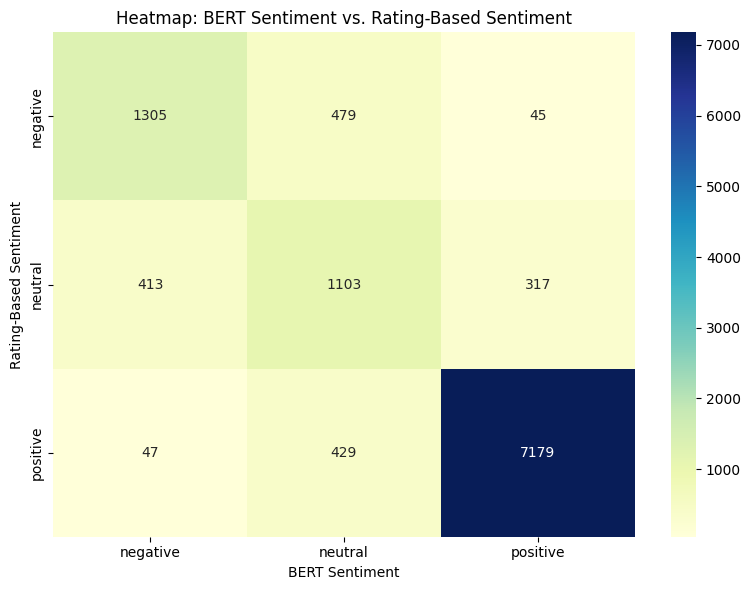

In [ ]:
# Step 1: Create a confusion matrix (cross-tabulation)
confusion_mat = pd.crosstab(
    reviews_df_added_bert_sentiment['rating_based_sentiment'],
    reviews_df_added_bert_sentiment['bert_sentiment'],
    rownames=['Rating-Based Sentiment'],
    colnames=['BERT Sentiment']
)

# Step 2: Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap: BERT Sentiment vs. Rating-Based Sentiment')
plt.tight_layout()
plt.show()

### RoBERTa Based (Transformer-Model)

HuggingFace Model: cardiffnlp/twitter-roberta-base-sentiment-latest

In [ ]:
reviews_df_added_roberta_sentiment = reviews_df_added_bert_sentiment.copy()

In [ ]:
# Load RoBERTa sentiment model
roberta_model_name = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(roberta_model_name)
model = AutoModelForSequenceClassification.from_pretrained(roberta_model_name)

labels = ['negative', 'neutral', 'positive']

In [ ]:
def get_roberta_sentiment(text, chunk_size=512):
    try:
        chunks = [text[i:i+chunk_size] for i in range(0, len(text), chunk_size)]
        # print(chunks)  # Debugging output
        encoded_inputs = [tokenizer(chunk, return_tensors='pt') for chunk in chunks]
        # print(encoded_inputs)  # Debugging output
        outputs = [model(**encoded_input) for encoded_input in encoded_inputs]
        # print(outputs)  # Debugging output
        scores = [softmax(output[0][0].detach().numpy()) for output in outputs]
        # print(scores)  # Debugging output
        mean_score = np.mean(scores, axis=0)
        # print(mean_score)  # Debugging output
        predicted = np.argmax(mean_score)
        # print(predicted)  # Debugging output
        return labels[predicted]
    except:
        print(f"Exception occurred!")
        print(f"Text: {text}")
        return 'neutral'

In [ ]:
reviews_df_added_roberta_sentiment['roberta_sentiment'] = reviews_df_added_bert_sentiment['review_text'].apply(get_roberta_sentiment)

In [ ]:
reviews_df_added_roberta_sentiment

In [ ]:
reviews_df_added_roberta_sentiment[reviews_df_added_roberta_sentiment['roberta_sentiment'] != reviews_df_added_roberta_sentiment['rating_based_sentiment']]

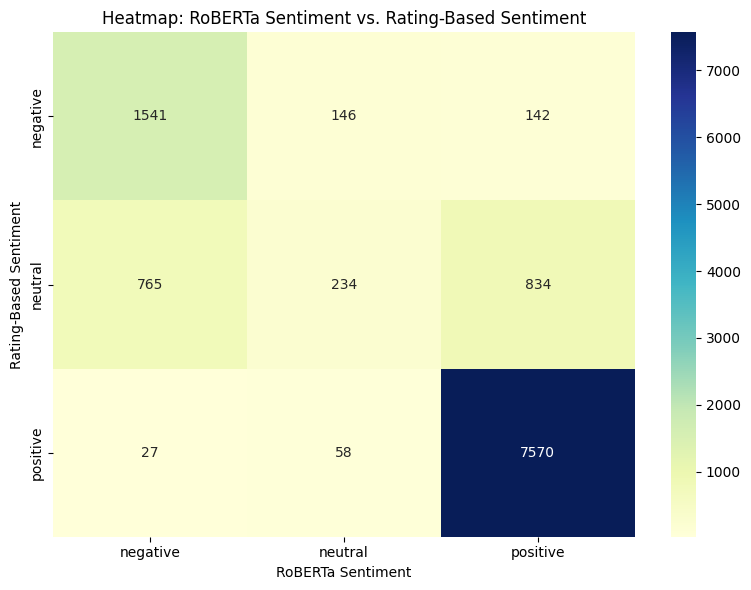

In [ ]:
# Step 1: Create a confusion matrix (cross-tabulation)
confusion_mat = pd.crosstab(
    reviews_df_added_roberta_sentiment['rating_based_sentiment'],
    reviews_df_added_roberta_sentiment['roberta_sentiment'],
    rownames=['Rating-Based Sentiment'],
    colnames=['RoBERTa Sentiment']
)

# Step 2: Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap: RoBERTa Sentiment vs. Rating-Based Sentiment')
plt.tight_layout()
plt.show()

## Majority Voting Scheme

In [ ]:
reviews_df_added_majority_sentiment = reviews_df_added_roberta_sentiment.copy()

In [ ]:
# Define function for majority vote
def majority_vote(row):
    sentiments = [row['vader_sentiment'], row['bert_sentiment'], row['roberta_sentiment']]
    counts = Counter(sentiments)
    
    # If all three are different, return 'neutral' (or handle differently if you prefer)
    if len(counts) == 3:
        return 'neutral'
    else:
        return counts.most_common(1)[0][0]

In [ ]:
reviews_df_added_majority_sentiment['majority_sentiment'] = reviews_df_added_roberta_sentiment.apply(majority_vote, axis=1)

In [ ]:
reviews_df_added_majority_sentiment

In [ ]:
reviews_df_added_raw_token_count = reviews_df_added_majority_sentiment.copy()

In [ ]:
reviews_df_added_raw_token_count['raw_token_count'] = reviews_df_added_majority_sentiment['raw_tokens'].apply(len)

In [ ]:
reviews_df_added_raw_token_count

In [ ]:
reviews_df_added_raw_token_count.to_csv(r'dataset-raw.csv', index=False)

In [ ]:
n_negative = len(reviews_df_added_raw_token_count[reviews_df_added_raw_token_count['majority_sentiment'] == 'negative'])
n_neutral = len(reviews_df_added_raw_token_count[reviews_df_added_raw_token_count['majority_sentiment'] == 'neutral'])

In [ ]:
remaining = 5000 - (n_negative + n_neutral)
print(f"✅ Keeping {n_negative} negative, {n_neutral} neutral, and {remaining} positive reviews.")

✅ Keeping 1907 negative, 1022 neutral, and 2071 positive reviews.


In [ ]:
reviews_df_majority_sentiment_negative = reviews_df_added_raw_token_count[reviews_df_added_raw_token_count['majority_sentiment'] == 'negative']
reviews_df_majority_sentiment_neutral = reviews_df_added_raw_token_count[reviews_df_added_raw_token_count['majority_sentiment'] == 'neutral']

In [ ]:
reviews_df_majority_sentiment_positive = reviews_df_added_raw_token_count[
    reviews_df_added_raw_token_count['majority_sentiment'] == 'positive'
].sort_values(by='raw_token_count', ascending=False).head(remaining)

In [ ]:
reviews_df_downsampled = pd.concat([reviews_df_majority_sentiment_negative, reviews_df_majority_sentiment_neutral, reviews_df_majority_sentiment_positive]).reset_index(drop=True)

In [ ]:
print("✅ Final class distribution:")
print(f"Total reviews: {len(reviews_df_downsampled)}")
display(reviews_df_downsampled['majority_sentiment'].value_counts())

✅ Final class distribution:
Total reviews: 5000


majority_sentiment
positive    2071
negative    1907
neutral     1022
Name: count, dtype: int64

In [ ]:
reviews_df_labeled_data_raw_dataset = reviews_df_added_majority_sentiment[['review_text', 'majority_sentiment']].copy()
reviews_df_labeled_data_downsampled_dataset = reviews_df_downsampled[['review_text', 'majority_sentiment']].copy()

reviews_df_labeled_data_raw_dataset.rename(columns={'majority_sentiment': 'labeled_sentiment'}, inplace=True)
reviews_df_labeled_data_downsampled_dataset.rename(columns={'majority_sentiment': 'labeled_sentiment'}, inplace=True)

In [ ]:
reviews_df_labeled_data_raw_dataset.to_csv(r'labeled-dataset/labeled-dataset-raw.csv', index=False)
reviews_df_labeled_data_downsampled_dataset.to_csv(r'labeled-dataset/labeled-dataset-downsampled.csv', index=False)

## EDA After Voting

### Distribution of Majority Sentiments

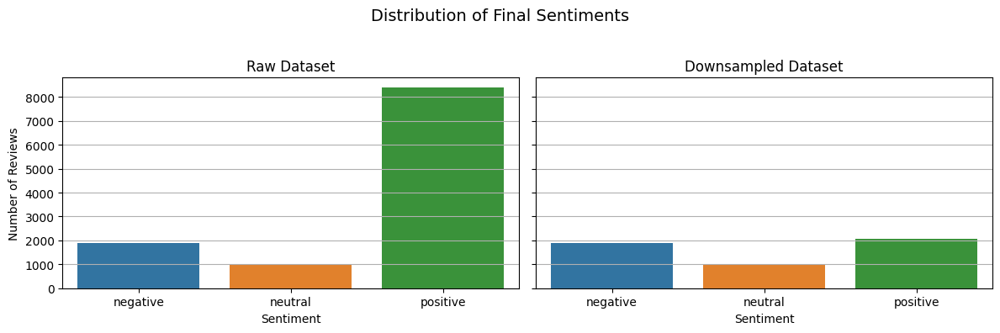

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

# Plot 1: Raw Dataset
sns.countplot(data=reviews_df_added_majority_sentiment, x='majority_sentiment', hue='majority_sentiment', ax=axes[0])
axes[0].set_title("Raw Dataset")
axes[0].set_xlabel("Sentiment")
axes[0].set_ylabel("Number of Reviews")
axes[0].grid(axis='y')

# Plot 2: Downsampled Dataset
sns.countplot(data=reviews_df_downsampled, x='majority_sentiment', hue='majority_sentiment', ax=axes[1])
axes[1].set_title("Downsampled Dataset")
axes[1].set_xlabel("Sentiment")
axes[1].set_ylabel("")  # Hide redundant label
axes[1].grid(axis='y')

# Overall title
fig.suptitle("Distribution of Final Sentiments", fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for suptitle
plt.show()

### Sentiment vs. Rating-based Sentiment

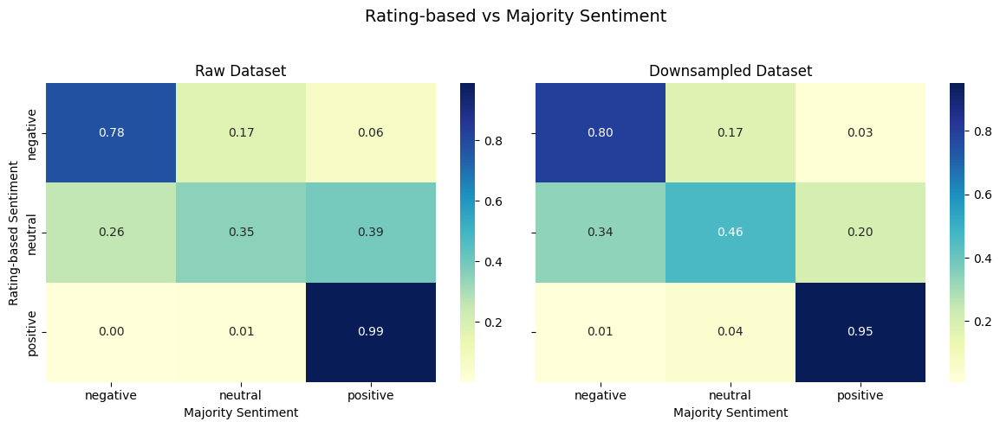

In [ ]:
# Crosstab for raw dataset
crosstab_raw = pd.crosstab(
    reviews_df_added_majority_sentiment['rating_based_sentiment'],
    reviews_df_added_majority_sentiment['majority_sentiment'],
    normalize='index'
)

# Crosstab for downsampled dataset
crosstab_downsampled = pd.crosstab(
    reviews_df_downsampled['rating_based_sentiment'],
    reviews_df_downsampled['majority_sentiment'],
    normalize='index'
)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Heatmap 1: Raw Dataset
sns.heatmap(crosstab_raw, annot=True, cmap='YlGnBu', fmt=".2f", ax=axes[0])
axes[0].set_title("Raw Dataset")
axes[0].set_xlabel("Majority Sentiment")
axes[0].set_ylabel("Rating-based Sentiment")

# Heatmap 2: Downsampled Dataset
sns.heatmap(crosstab_downsampled, annot=True, cmap='YlGnBu', fmt=".2f", ax=axes[1])
axes[1].set_title("Downsampled Dataset")
axes[1].set_xlabel("Majority Sentiment")
axes[1].set_ylabel("")

# Overall title
fig.suptitle("Rating-based vs Majority Sentiment", fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Classifier Agreement Categories

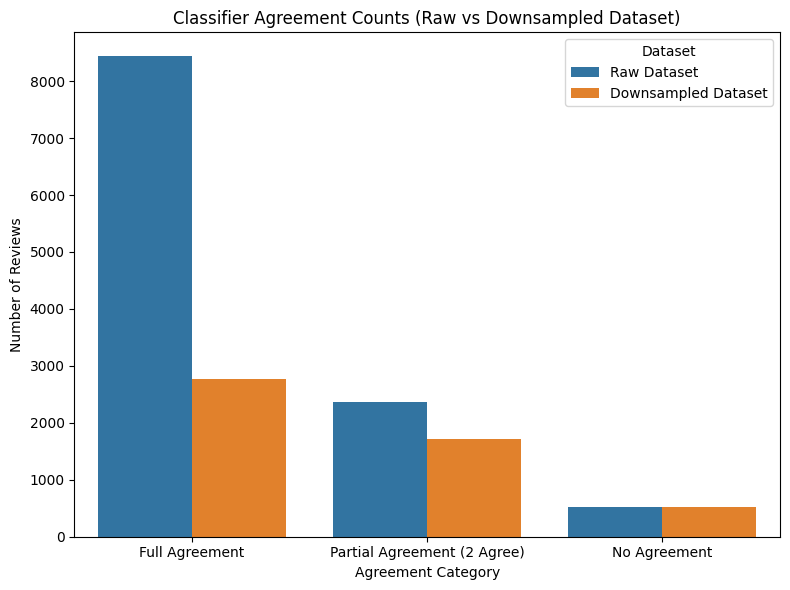

In [ ]:
# Agreement category order
agreement_order = ['Full Agreement', 'Partial Agreement (2 Agree)', 'No Agreement']

# Function to compute counts and keep order
def compute_agreement_counts(df):
    agreement_df = df[['vader_sentiment', 'bert_sentiment', 'roberta_sentiment']].copy()
    agreement_df['agreement_category'] = agreement_df.apply(
        lambda row: (
            'Full Agreement' if len(set(row)) == 1 else
            'Partial Agreement (2 Agree)' if len(set(row)) == 2 else
            'No Agreement'
        ),
        axis=1
    )
    return agreement_df['agreement_category'].value_counts().reindex(agreement_order, fill_value=0)

# Combine into one DataFrame for plotting
agreement_combined = pd.DataFrame({
    'Raw Dataset': agreement_raw_counts,
    'Downsampled Dataset': agreement_downsampled_counts
}).fillna(0)

# Set the index name to 'Agreement Category'
agreement_combined.index.name = 'Agreement Category'

# Reset index so Agreement Category becomes a column
agreement_combined = agreement_combined.reset_index()

# Melt to long format for seaborn
agreement_long = agreement_combined.melt(id_vars='Agreement Category', 
                                        value_vars=['Raw Dataset', 'Downsampled Dataset'],
                                        var_name='Dataset',
                                        value_name='Review Count')

# Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=agreement_long, 
            x='Agreement Category', 
            y='Review Count', 
            hue='Dataset',
            order=agreement_order)

plt.title("Classifier Agreement Counts (Raw vs Downsampled Dataset)")
plt.xlabel("Agreement Category")
plt.ylabel("Number of Reviews")
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()

### Heatmaps: Classifier vs. Majority Sentiment

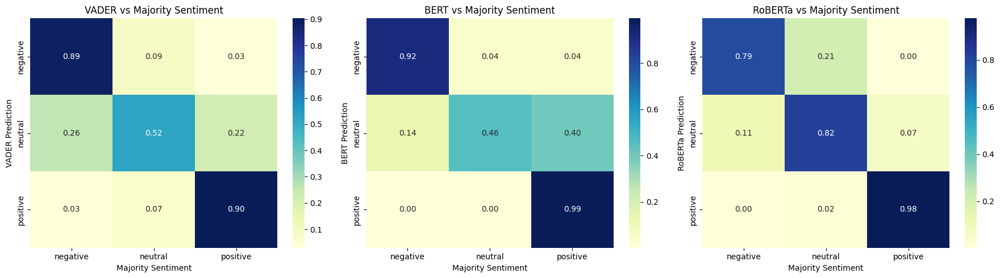

In [ ]:
# Set up for side-by-side heatmaps
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Classifier names and corresponding column names
classifiers = {
    'VADER': 'vader_sentiment',
    'BERT': 'bert_sentiment',
    'RoBERTa': 'roberta_sentiment'
}

# Loop through classifiers and plot heatmaps
for ax, (clf_name, col_name) in zip(axes, classifiers.items()):
    # Create confusion matrix
    cm = pd.crosstab(reviews_df_added_majority_sentiment[col_name],
                     reviews_df_added_majority_sentiment['majority_sentiment'],
                     normalize='index')  # Normalize by classifier prediction

    # Heatmap
    sns.heatmap(cm, annot=True, fmt=".2f", cmap='YlGnBu', ax=ax)
    ax.set_title(f'{clf_name} vs Majority Sentiment')
    ax.set_xlabel('Majority Sentiment')
    ax.set_ylabel(f'{clf_name} Prediction')

plt.tight_layout()
plt.show()

# Task 3: Feature Extraction

## Labeled Dataset

In [ ]:
reviews_df_labeled_data = pd.read_csv(r'labeled-data/labeled-dataset-downsampled.csv')

In [ ]:
reviews_df_labeled_data

## Sparse Vectors

### Bag-of-Words (CountVectorizer)

In [ ]:
count_vectorizer = CountVectorizer()
reviews_df_bow = count_vectorizer.fit_transform(reviews_df_labeled_data['review_text'])
print("Bag-of-Words Shape:", reviews_df_bow.shape)

Bag-of-Words Shape: (5000, 22504)


### TF-IDF Vectorizer

In [ ]:
tfidf_vectorizer = TfidfVectorizer()
reviews_df_tfidf = tfidf_vectorizer.fit_transform(reviews_df_labeled_data['review_text'])
print("TF-IDF Shape:", reviews_df_tfidf.shape)

TF-IDF Shape: (5000, 22504)


## Dense Vectors

### GloVe Word Embeddings (Averaged for each review)

In [ ]:
# Load pre-trained GloVe (100d for balance between size and accuracy)
glove_vectors = api.load("glove-wiki-gigaword-100")

In [ ]:
def avg_glove_vector(text):
    words = text.lower().split()
    vectors = [glove_vectors[word] for word in words if word in glove_vectors]
    return np.mean(vectors, axis=0) if vectors else np.zeros(100)

In [ ]:
reviews_df_glove = np.vstack([avg_glove_vector(text) for text in tqdm(reviews_df_labeled_data['review_text'])])
print("GloVe Shape:", reviews_df_glove.shape)

100%|██████████| 5000/5000 [00:00<00:00, 8321.00it/s]

GloVe Shape: (5000, 100)


### Doc2Vec Embeddings

In [ ]:
reviews_df_tagged_docs = [TaggedDocument(words=row.split(), tags=[i]) 
               for i, row in enumerate(reviews_df_labeled_data['review_text'])]

In [ ]:
reviews_df_doc2vec_model = Doc2Vec(reviews_df_tagged_docs, vector_size=100, window=5, min_count=2, workers=4, epochs=40)
reviews_df_doc2vec = np.vstack([reviews_df_doc2vec_model.infer_vector(doc.words) for doc in reviews_df_tagged_docs])
print("Doc2Vec Shape:", reviews_df_doc2vec.shape)

Doc2Vec Shape: (5000, 100)


## Save the Vectors

In [ ]:
# 1. Save Sparse Matrices (BoW, TF-IDF)
scipy.sparse.save_npz("data-vectors/bow_vector.npz", reviews_df_bow)
scipy.sparse.save_npz("data-vectors/tfidf_vector.npz", reviews_df_tfidf)

# 2. Save Dense Matrices (GloVe, Doc2Vec)
np.save("data-vectors/glove_vector.npy", reviews_df_glove)
np.save("data-vectors/doc2vec_vector.npy", reviews_df_doc2vec)

## Task 3: Feature Extraction

To convert the review texts into numerical features suitable for machine learning models, we applied four different vectorization techniques: two **sparse** and two **dense**. Below are the resulting data matrix shapes and justifications for each method.

---

### 1. **Bag-of-Words (BoW)**

**Shape:** `(5000, 22504)`

* **Rows**: 5000 reviews
* **Columns**: 22504 unique words in the vocabulary

**Justification:**
BoW provides a simple, interpretable representation of text by counting word frequencies. Despite ignoring grammar and word order, it often serves as a strong baseline for classification tasks such as sentiment analysis.

---

### 2. **TF-IDF (Term Frequency–Inverse Document Frequency)**

**Shape:** `(5000, 22504)`

* Same number of features as BoW.

**Justification:**
TF-IDF adjusts raw word counts by penalizing common terms and highlighting rarer, more informative ones. It retains the sparse structure of BoW but improves the discriminative power of features, making it well-suited for text classification.

---

### 3. **GloVe Embeddings (Averaged per Review)**

**Shape:** `(5000, 100)`

* Each review is represented by a **100-dimensional dense vector**, computed by averaging GloVe word embeddings.

**Justification:**
GloVe (Global Vectors) are pre-trained word embeddings that capture semantic relationships between words. Averaging these embeddings for each review results in a compact, dense representation that preserves overall meaning while reducing dimensionality and noise.

---

### 4. **Doc2Vec (Trained on Reviews)**

**Shape:** `(5000, 100)`

* Each review is mapped to a **100-dimensional dense vector** learned by the Doc2Vec model.

**Justification:**
Doc2Vec extends Word2Vec to learn fixed-size vectors directly for documents (in this case, reviews). It captures contextual and syntactic relationships within the text, producing document-level embeddings that are richer than simple word averages.

---

## Summary

| Vectorization Method | Type   | Shape         | Strengths                                      |
| -------------------- | ------ | ------------- | ---------------------------------------------- |
| Bag-of-Words         | Sparse | (5000, 22504) | Simple, interpretable, strong baseline         |
| TF-IDF               | Sparse | (5000, 22504) | Highlights informative words, better weighting |
| GloVe (avg)          | Dense  | (5000, 100)   | Semantic meaning, compact, pre-trained         |
| Doc2Vec              | Dense  | (5000, 100)   | Document-level context, captures word order    |

# Task 4 - Text classification

## Rationale for Algorithm Selection

In this study, we selected three fundamentally different non-deep learning algorithms to perform sentiment classification on user reviews. Each algorithm was chosen for its unique strengths, learning principles, and compatibility with various types of text feature representations (sparse and dense). The algorithms selected were: **Random Forest**, **Logistic Regression**, and **Linear Support Vector Classifier (SVC)**.

---

### 1. Random Forest Classifier

**Overview**:
Random Forest is an ensemble learning method based on decision trees. It operates by constructing a multitude of decision trees during training and outputs the class that is the mode of the classes of the individual trees.

**Rationale for Selection**:

* **Non-linear modeling**: Unlike linear models, Random Forest is capable of modeling complex non-linear decision boundaries, which can be beneficial when working with dense, semantically rich features like GloVe or Doc2Vec.
* **Robustness to noise**: It can handle noisy or redundant features well, which is common in natural language data.
* **Feature importance**: The model provides insights into which features are most influential, adding interpretability to the classification task.
* **Versatility**: Suitable for both high- and low-dimensional datasets, though it tends to perform better with dense vector representations.

**Justification**:
Random Forest was included to serve as a strong **non-linear baseline**, particularly for evaluating performance on dense feature representations that encode complex relationships beyond simple term frequencies.

---

### 2. Logistic Regression

**Overview**:
Despite its name, Logistic Regression is a linear classification algorithm that models the probability of a categorical dependent variable. It is widely used in text classification problems due to its simplicity and effectiveness.

**Rationale for Selection**:

* **Effective in high-dimensional space**: Logistic Regression performs well when the number of features is large, making it ideal for sparse representations such as Bag-of-Words and TF-IDF.
* **Fast and scalable**: It is computationally efficient and scalable to large datasets, which is often necessary in NLP applications.
* **Baseline model**: It serves as an interpretable and reliable baseline in many classification tasks.
* **Regularization support**: With L1 and L2 regularization, the model can prevent overfitting even with sparse, high-dimensional data.

**Justification**:
Logistic Regression was selected as a **linear benchmark model**, expected to perform well on sparse vectors due to its probabilistic nature and established success in NLP pipelines.

---

### 3. Linear Support Vector Classifier (Linear SVC)

**Overview**:
Linear SVC is an implementation of Support Vector Machines for classification problems where the relationship between features and labels is assumed to be linearly separable. It optimizes the hinge loss function to maximize the margin between classes.

**Rationale for Selection**:

* **High generalization performance**: SVMs are known for their ability to generalize well, especially in high-dimensional spaces, by maximizing the margin between decision boundaries.
* **Strong performance on text data**: With sparse, high-dimensional input from TF-IDF or BoW, SVMs are often among the top-performing models.
* **Insensitive to feature scaling**: Linear SVC can handle text data without strict normalization requirements, making it practical for quick experimentation.
* **Resilient to overfitting**: With proper regularization, SVC is robust to overfitting even in the presence of irrelevant features.

**Justification**:
Linear SVC was selected as a **robust, high-performance linear classifier** suited for handling sparse, high-dimensional features often found in NLP.

---

### Consideration of Other Algorithms

While **Naive Bayes** (specifically **Multinomial Naive Bayes**) is a popular baseline in text classification tasks, it was **intentionally excluded** from this study. The primary reason is its **incompatibility with dense, continuous-valued vector representations** such as **GloVe** and **Doc2Vec**.

Naive Bayes assumes that features are conditionally independent given the class and typically expects **discrete or count-based inputs** (e.g., word counts or TF-IDF scores). Applying it to dense embeddings that encode continuous semantic relationships violates its core assumptions, leading to unreliable or invalid predictions.

> **Therefore**, Naive Bayes was excluded in favor of more versatile models that support **both sparse and dense input features**, ensuring consistency and comparability across all feature extraction methods used in this project.

## Labeled Dataset

In [ ]:
reviews_df_labeled_data = pd.read_csv(r'labeled-data/labeled-dataset-downsampled.csv')

In [ ]:
reviews_df_labeled_data

## Import Vectors

In [ ]:
# Load Sparse
reviews_df_bow = load_npz("data-vectors/bow_vector.npz")
reviews_df_tfidf = load_npz("data-vectors/tfidf_vector.npz")

# Load Dense
reviews_df_glove = np.load("data-vectors/glove_vector.npy")
reviews_df_doc2vec = np.load("data-vectors/doc2vec_vector.npy")

## Prepare Labels

In [ ]:
# Load labels
labels = reviews_df_labeled_data['labeled_sentiment'].values

In [ ]:
display(labels, set(labels))

array(['negative', 'negative', 'negative', ..., 'positive', 'positive',
       'positive'], shape=(5000,), dtype=object)

{'negative', 'neutral', 'positive'}

In [ ]:
# Convert labels to binary or categorical if needed
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(labels)
class_names = label_encoder.classes_  # This holds the original string labels


In [ ]:
display(y, set(y), class_names)

array([0, 0, 0, ..., 2, 2, 2], shape=(5000,))

{np.int64(0), np.int64(1), np.int64(2)}

array(['negative', 'neutral', 'positive'], dtype=object)

## Train & Evaluate Each Classifier

In [ ]:
def plot_confusion_matrix(y_test, y_pred, class_names, ax):
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_title("Confusion Matrix")
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")


def plot_learning_curve(model, X, y, ax, scoring='balanced_accuracy'):
    model = clone(model)
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=5, scoring=scoring,
        train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1, shuffle=True, random_state=42
    )
    train_mean = np.mean(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    ax.plot(train_sizes, train_mean, label="Train")
    ax.plot(train_sizes, test_mean, label="Validation")
    ax.set_title("Learning Curve")
    ax.set_xlabel("Training Size")
    ax.set_ylabel(scoring)
    ax.legend()
    ax.grid(True)


def plot_roc_and_pr_curves(model, X_test, y_test, class_names, axs):
    y_test_bin = label_binarize(y_test, classes=np.arange(len(class_names)))
    n_classes = y_test_bin.shape[1]

    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X_test)
    elif hasattr(model, "decision_function"):
        y_score = model.decision_function(X_test)
    else:
        axs[0].text(0.5, 0.5, 'No prob/decision function available', ha='center', va='center')
        axs[1].axis('off')
        return

    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        axs[0].plot(fpr, tpr, label=f"{class_names[i]} (AUC={roc_auc:.2f})")
        axs[1].step(recall, precision, where='post', label=f"{class_names[i]}")

    axs[0].plot([0, 1], [0, 1], 'k--')
    axs[0].set_title("ROC Curve (OvR)")
    axs[0].set_xlabel("FPR")
    axs[0].set_ylabel("TPR")
    axs[0].legend()
    axs[0].grid(True)

    axs[1].set_title("Precision-Recall Curve (OvR)")
    axs[1].set_xlabel("Recall")
    axs[1].set_ylabel("Precision")
    axs[1].legend()
    axs[1].grid(True)


def evaluate_model(X, X_test, y, y_test, top_models, top_y_preds, class_names):
    fig, axs = plt.subplots(4, 3, figsize=(24, 32))

    for i in range(3):
        # 1. Confusion Matrix
        plot_confusion_matrix(y_test, top_y_preds[i], class_names, axs[0,i])

        # 2. Learning Curve
        plot_learning_curve(top_models[i], X, y, axs[1,i])

        # 3 & 4. ROC and PR Curve
        plot_roc_and_pr_curves(top_models[i], X_test, y_test, class_names, axs[2:4,i])

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_validation_curve(model, X, y, param_name, param_range, ax, scoring='balanced_accuracy'):
    model = clone(model)
    train_scores, test_scores = validation_curve(
        model, X, y, param_name=param_name, param_range=param_range,
        scoring=scoring, cv=5, n_jobs=-1
    )
    train_mean = np.mean(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    ax.plot(param_range, train_mean, label="Train")
    ax.plot(param_range, test_mean, label="Validation")
    ax.set_title(f"Validation Curve for {param_name}")
    ax.set_xlabel(param_name)
    ax.set_ylabel(scoring)
    ax.legend()
    ax.grid(True)

In [ ]:
def plot_top_models_metrics(metrics_list, axs, metric_names=None):
    if metric_names is None:
        metric_names = ['accuracy', 'f1_macro', 'precision_macro', 'recall_macro']

    model_indices = list(range(1, len(metrics_list) + 1))  # 1-based model ranks

    for i, metric in enumerate(metric_names):
        values = [m[metric] for m in metrics_list]

        ax = axs[i]
        ax.plot(model_indices, values, marker='o')
        ax.set_title(metric.replace('_', ' ').title())
        ax.set_xlabel("Model Rank")
        ax.set_ylabel(metric.replace('_', ' ').title())
        ax.set_xticks(model_indices)
        ax.grid(True)

    plt.tight_layout()
    plt.show()

## Apply to Each Feature Set

### Bag-of-Words (Sparse)

In [ ]:
# Train-test split
bow_X_train, bow_X_test, bow_y_train, bow_y_test = train_test_split(reviews_df_bow, y, test_size=0.2, random_state=42)

#### Random Forest Classifier

In [ ]:
bow_RandomForestClassifier = RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1)

bow_rf_search_space = {
    'n_estimators': Integer(100, 10000),
    'max_depth': [None] + list(np.arange(10, 501, 10)),
    'min_samples_split': Integer(2, 51),
    'min_samples_leaf': Integer(1, 51),
}

bow_rf_bayes_searchCV = BayesSearchCV(
    estimator=bow_RandomForestClassifier,
    search_spaces=bow_rf_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

bow_rf_bayes_search = bow_rf_bayes_searchCV.fit(reviews_df_bow, y)

In [ ]:
bow_rf_cv_results_df = pd.DataFrame(bow_rf_bayes_searchCV.cv_results_)
display(bow_rf_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
bow_rf_ranked25_df = bow_rf_cv_results_df.sort_values(by='rank_test_score')
bow_rf_top3_df = bow_rf_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
bow_rf_top3_models = []
bow_rf_top3_y_preds = []
bow_rf_top3_metrics = []

for i, row in bow_rf_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(bow_RandomForestClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(bow_X_train, bow_y_train)
    y_pred = model.predict(bow_X_test)

    report = classification_report(bow_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(bow_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    bow_rf_top3_models.append(model)
    bow_rf_top3_y_preds.append(y_pred)
    bow_rf_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(bow_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'max_depth': 90, 'min_samples_leaf': 12, 'min_samples_split': 3, 'n_estimators': 1952})
Classification Report:
               precision    recall  f1-score   support

    negative       0.80      0.83      0.81       390
     neutral       0.49      0.42      0.45       196
    positive       0.86      0.89      0.87       414

    accuracy                           0.77      1000
   macro avg       0.72      0.71      0.71      1000
weighted avg       0.76      0.77      0.77      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'max_depth': 200, 'min_samples_leaf': 12, 'min_samples_split': 4, 'n_estimators': 1501})
Classification Report:
               precision    recall  f1-score   support

    negative       0.80      0.83      0.81       390
     neutral       0.49      0.42      0.45       196
    positive       0.87      0.89      0.88       414

    accuracy                           0.77      1000
   macro avg    

/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

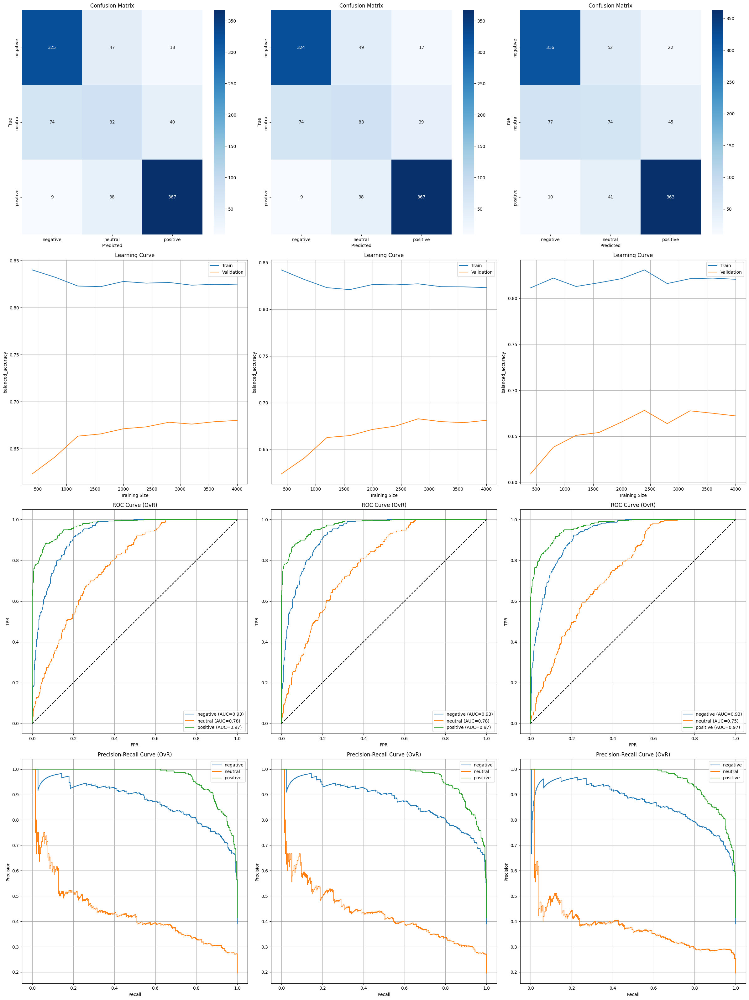

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_bow, bow_X_test, y, bow_y_test, bow_rf_top3_models, bow_rf_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=bow_rf_cv_results_df,
#     base_model=bow_RandomForestClassifier,
#     X=reviews_df_bow,
#     y=y,
#     scoring='balanced_accuracy'
# )

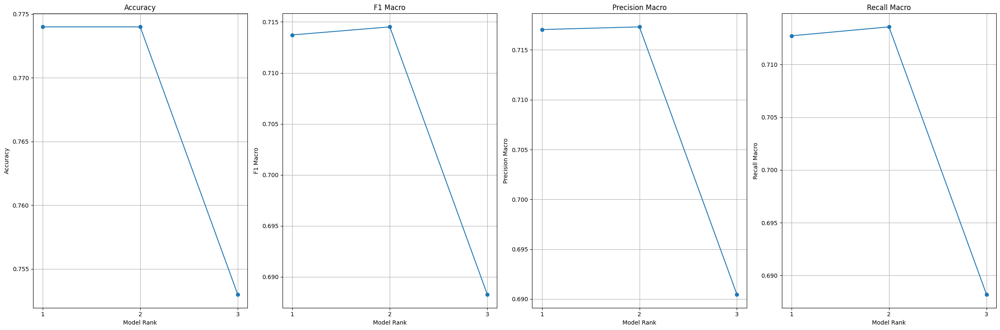

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(bow_rf_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_bow_RandomForestClassifier = bow_rf_bayes_searchCV.best_estimator_

#### Logistic Regression Classifier

##### Search Space - liblinear Solver

In [ ]:
bow_LogisticRegressionClassifier_liblinearSolver = LogisticRegression(solver='liblinear', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

bow_lr_search_space_liblinearSolver = {
    'penalty': Categorical(['l1', 'l2']),
    'C': Real(1e-4, 1000, prior='log-uniform'),
}

bow_lr_bayes_searchCV_liblinearSolverCV = BayesSearchCV(
    estimator=bow_LogisticRegressionClassifier_liblinearSolver,
    search_spaces=bow_lr_search_space_liblinearSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

bow_lr_liblinearSolver_bayes_search = bow_lr_bayes_searchCV_liblinearSolverCV.fit(reviews_df_bow, y)

In [ ]:
bow_lr_liblinearSolver_cv_results_df = pd.DataFrame(bow_lr_bayes_searchCV_liblinearSolverCV.cv_results_)
display(bow_lr_liblinearSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
bow_lr_ranked25_df = bow_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score')
bow_lr_top3_df = bow_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
bow_lr_top3_models = []
bow_lr_top3_y_preds = []
bow_lr_top3_metrics = []

for i, row in bow_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(bow_LogisticRegressionClassifier_liblinearSolver).set_params(**row['params'])

    # Train and predict
    model.fit(bow_X_train, bow_y_train)
    y_pred = model.predict(bow_X_test)

    report = classification_report(bow_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(bow_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    bow_lr_top3_models.append(model)
    bow_lr_top3_y_preds.append(y_pred)
    bow_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(bow_y_test, y_pred, target_names=class_names))

/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.226081366992202, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.81      0.85      0.83       390
     neutral       0.50      0.46      0.48       196
    positive       0.89      0.88      0.89       414

    accuracy                           0.79      1000
   macro avg       0.73      0.73      0.73      1000
weighted avg       0.78      0.79      0.79      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.2257945874519733, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.81      0.85      0.83       390
     neutral       0.50      0.46      0.48       196
    positive       0.89      0.88      0.89       414

    accuracy                           0.79      1000
   macro avg       0.73      0.73      0.73      1000
weighted avg       0.78      0.79      0.79      1000


/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(


/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' i

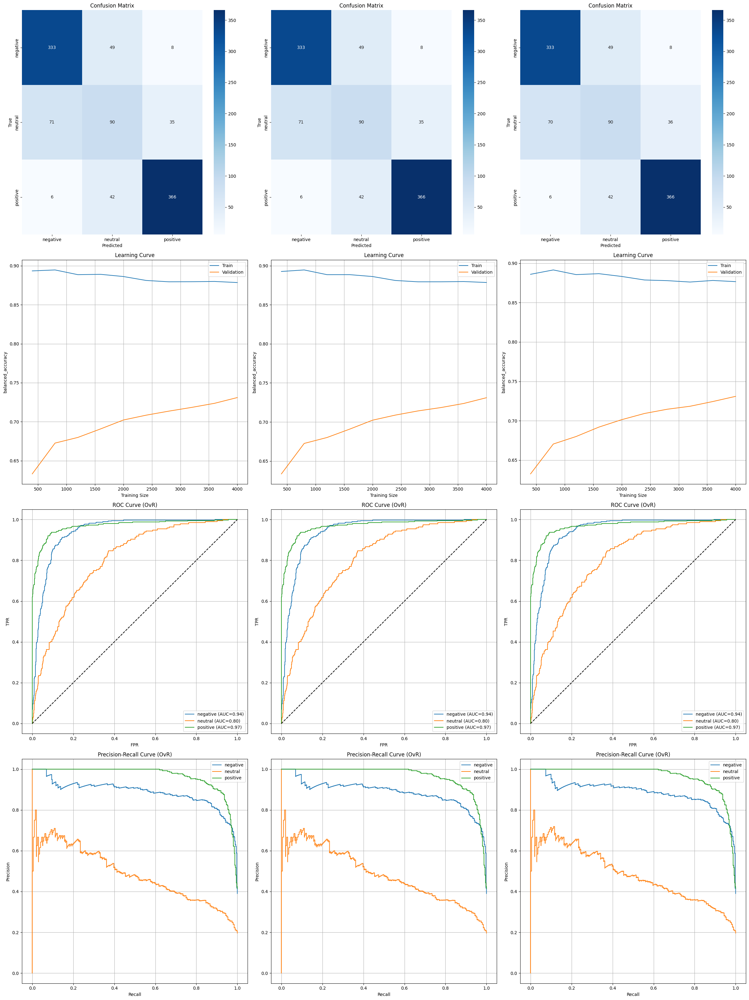

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_bow, bow_X_test, y, bow_y_test, bow_lr_top3_models, bow_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=bow_lr_cv_results_df,
#     base_model=bow_RandomForestClassifier,
#     X=reviews_df_bow,
#     y=y,
#     scoring='balanced_accuracy'
# )

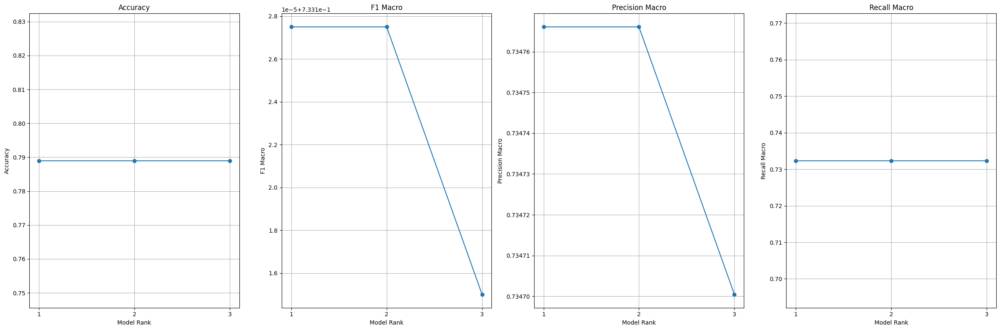

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(bow_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_bow_LinearRegressionClassifier_liblinearSolver = bow_lr_bayes_searchCV_liblinearSolverCV.best_estimator_

##### Search Space - lbfgs Solver

In [ ]:
bow_LogisticRegressionClassifier_lbfgsSolver = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

bow_lr_search_space_lbfgsSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

bow_lr_bayes_searchCV_lbfgsSolverCV = BayesSearchCV(
    estimator=bow_LogisticRegressionClassifier_lbfgsSolver,
    search_spaces=bow_lr_search_space_lbfgsSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

bow_lr_lbfgsSolver_bayes_search = bow_lr_bayes_searchCV_lbfgsSolverCV.fit(reviews_df_bow, y)

In [ ]:
bow_lr_lbfgsSolver_cv_results_df = pd.DataFrame(bow_lr_bayes_searchCV_lbfgsSolverCV.cv_results_)
display(bow_lr_lbfgsSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
bow_lr_ranked25_df = bow_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score')
bow_lr_top3_df = bow_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
bow_lr_top3_models = []
bow_lr_top3_y_preds = []
bow_lr_top3_metrics = []

for i, row in bow_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(bow_LogisticRegressionClassifier_lbfgsSolver).set_params(**row['params'])

    # Train and predict
    model.fit(bow_X_train, bow_y_train)
    y_pred = model.predict(bow_X_test)

    report = classification_report(bow_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(bow_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    bow_lr_top3_models.append(model)
    bow_lr_top3_y_preds.append(y_pred)
    bow_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(bow_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.006231441031207226})
Classification Report:
               precision    recall  f1-score   support

    negative       0.83      0.80      0.81       390
     neutral       0.46      0.58      0.51       196
    positive       0.92      0.84      0.88       414

    accuracy                           0.77      1000
   macro avg       0.74      0.74      0.73      1000
weighted avg       0.79      0.77      0.78      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.006191840638908428})
Classification Report:
               precision    recall  f1-score   support

    negative       0.83      0.80      0.81       390
     neutral       0.46      0.58      0.51       196
    positive       0.92      0.84      0.88       414

    accuracy                           0.77      1000
   macro avg       0.74      0.74      0.73      1000
weighted avg       0.79      0.77      0.78      1000


=== Model Rank: 3 ===
Hyper

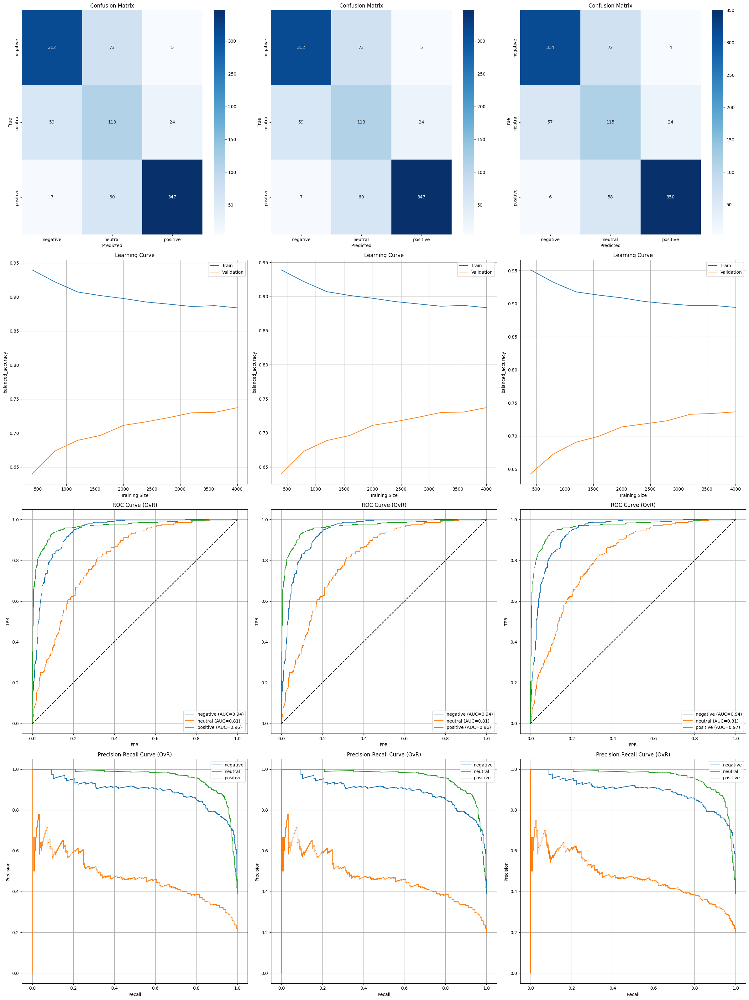

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_bow, bow_X_test, y, bow_y_test, bow_lr_top3_models, bow_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=bow_lr_cv_results_df,
#     base_model=bow_RandomForestClassifier,
#     X=reviews_df_bow,
#     y=y,
#     scoring='balanced_accuracy'
# )

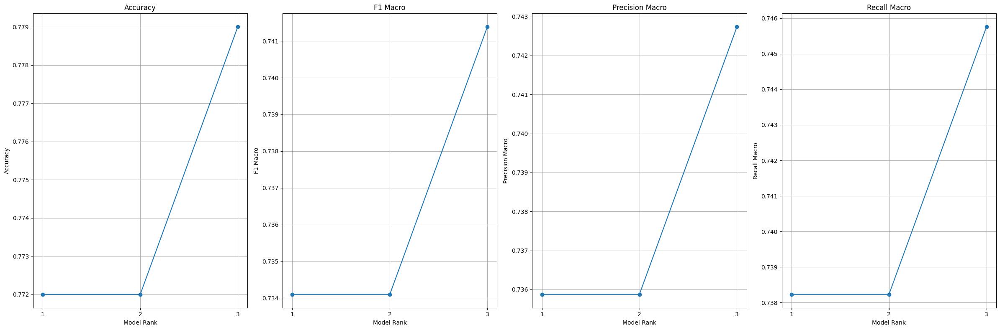

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(bow_lr_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_bow_LinearRegressionClassifier_lbfgsSolver = bow_lr_bayes_searchCV_lbfgsSolverCV.best_estimator_

##### Search Space - saga Solver

In [ ]:
bow_LogisticRegressionClassifier_sagaSolver = LogisticRegression(solver='saga', penalty='elasticnet', max_iter=10,  class_weight='balanced', random_state=42, n_jobs=-1)

bow_lr_search_space_sagaSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform'),
    'l1_ratio': Real(0, 1.0)
}

bow_lr_bayes_searchCV_sagaSolverCV = BayesSearchCV(
    estimator=bow_LogisticRegressionClassifier_sagaSolver,
    search_spaces=bow_lr_search_space_sagaSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True,
    verbose=2  # shows progress
)

bow_lr_sagaSolver_bayes_search = bow_lr_bayes_searchCV_sagaSolverCV.fit(reviews_df_bow, y)

In [ ]:
bow_lr_sagaSolver_cv_results_df = pd.DataFrame(bow_lr_bayes_searchCV_sagaSolverCV.cv_results_)
display(bow_lr_sagaSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
bow_lr_ranked25_df = bow_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score')
bow_lr_top3_df = bow_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
bow_lr_top3_models = []
bow_lr_top3_y_preds = []
bow_lr_top3_metrics = []

for i, row in bow_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(bow_LogisticRegressionClassifier_sagaSolver).set_params(**row['params'])

    # Train and predict
    model.fit(bow_X_train, bow_y_train)
    y_pred = model.predict(bow_X_test)

    report = classification_report(bow_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(bow_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    bow_lr_top3_models.append(model)
    bow_lr_top3_y_preds.append(y_pred)
    bow_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(bow_lr_y_test, y_pred, target_names=class_names))

/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 5.216260610937377, 'l1_ratio': 1.0})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.61      0.70       390
     neutral       0.39      0.61      0.48       196
    positive       0.83      0.82      0.83       414

    accuracy                           0.70      1000
   macro avg       0.68      0.68      0.67      1000
weighted avg       0.74      0.70      0.71      1000



/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 13.746626277890918, 'l1_ratio': 0.9393697376027718})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.61      0.70       390
     neutral       0.39      0.61      0.48       196
    positive       0.83      0.82      0.83       414

    accuracy                           0.70      1000
   macro avg       0.68      0.68      0.67      1000
weighted avg       0.74      0.70      0.71      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.3486325622801607, 'l1_ratio': 0.018178174789049487})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.61      0.70       390
     neutral       0.39      0.61      0.48       196
    positive       0.83      0.82      0.83       414

    accuracy                           0.70      1000
   macro avg       0.68      0.68      0.67      1000
weighted avg       0.

/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

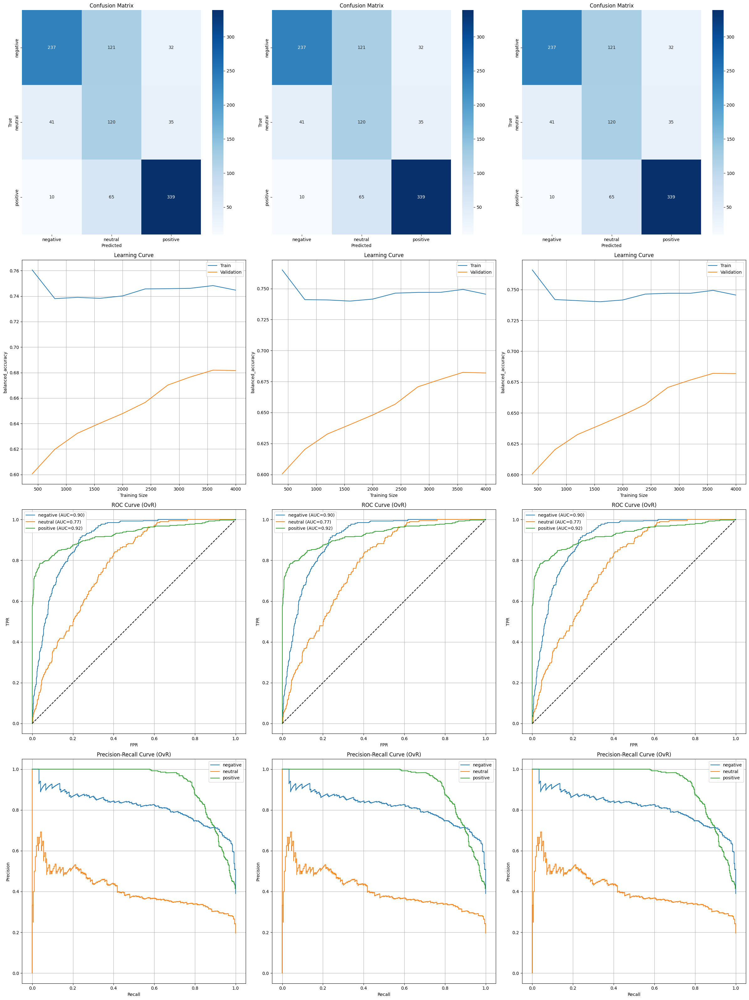

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_bow, bow_X_test, y, bow_y_test, bow_lr_top3_models, bow_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=bow_lr_cv_results_df,
#     base_model=bow_RandomForestClassifier,
#     X=reviews_df_bow,
#     y=y,
#     scoring='balanced_accuracy'
# )

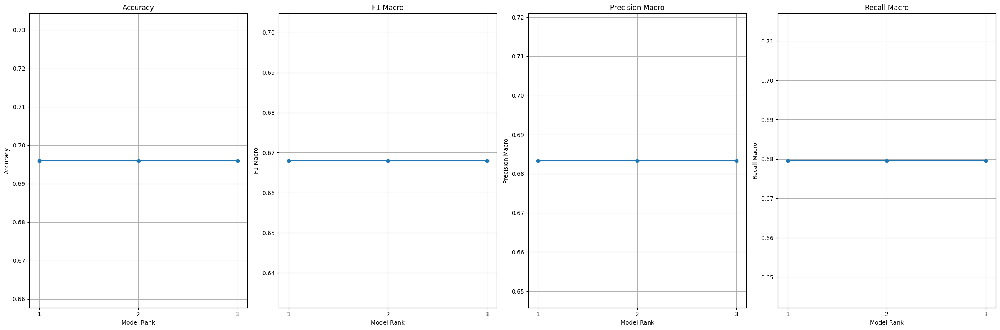

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(bow_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_bow_LinearRegressionClassifier_sagaSolver = bow_lr_bayes_searchCV_sagaSolverCV.best_estimator_

#### LinearSVC Classifier

In [ ]:
bow_LinearSVCClassifier = LinearSVC(class_weight='balanced', dual=False, max_iter=5000, random_state=42)

bow_lsvc_search_space = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

bow_lsvc_bayes_searchCV = BayesSearchCV(
    estimator=bow_LinearSVCClassifier,
    search_spaces=bow_lsvc_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

bow_lsvc_bayes_search = bow_lsvc_bayes_searchCV.fit(reviews_df_bow, y)

In [ ]:
bow_lsvc_cv_results_df = pd.DataFrame(bow_lsvc_bayes_searchCV.cv_results_)
display(bow_lsvc_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
bow_lsvc_ranked25_df = bow_lsvc_cv_results_df.sort_values(by='rank_test_score')
bow_lsvc_top3_df = bow_lsvc_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
bow_lsvc_top3_models = []
bow_lsvc_top3_y_preds = []
bow_lsvc_top3_metrics = []

for i, row in bow_lsvc_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(bow_LinearSVCClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(bow_X_train, bow_y_train)
    y_pred = model.predict(bow_X_test)

    report = classification_report(bow_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(bow_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    bow_lsvc_top3_models.append(model)
    bow_lsvc_top3_y_preds.append(y_pred)
    bow_lsvc_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(bow_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.0012157273992785943})
Classification Report:
               precision    recall  f1-score   support

    negative       0.80      0.88      0.84       390
     neutral       0.50      0.46      0.48       196
    positive       0.91      0.86      0.89       414

    accuracy                           0.79      1000
   macro avg       0.74      0.73      0.73      1000
weighted avg       0.79      0.79      0.79      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.0012172563201255189})
Classification Report:
               precision    recall  f1-score   support

    negative       0.80      0.88      0.84       390
     neutral       0.50      0.46      0.48       196
    positive       0.91      0.86      0.89       414

    accuracy                           0.79      1000
   macro avg       0.74      0.73      0.73      1000
weighted avg       0.79      0.79      0.79      1000


=== Model Rank: 1 ===
Hyp

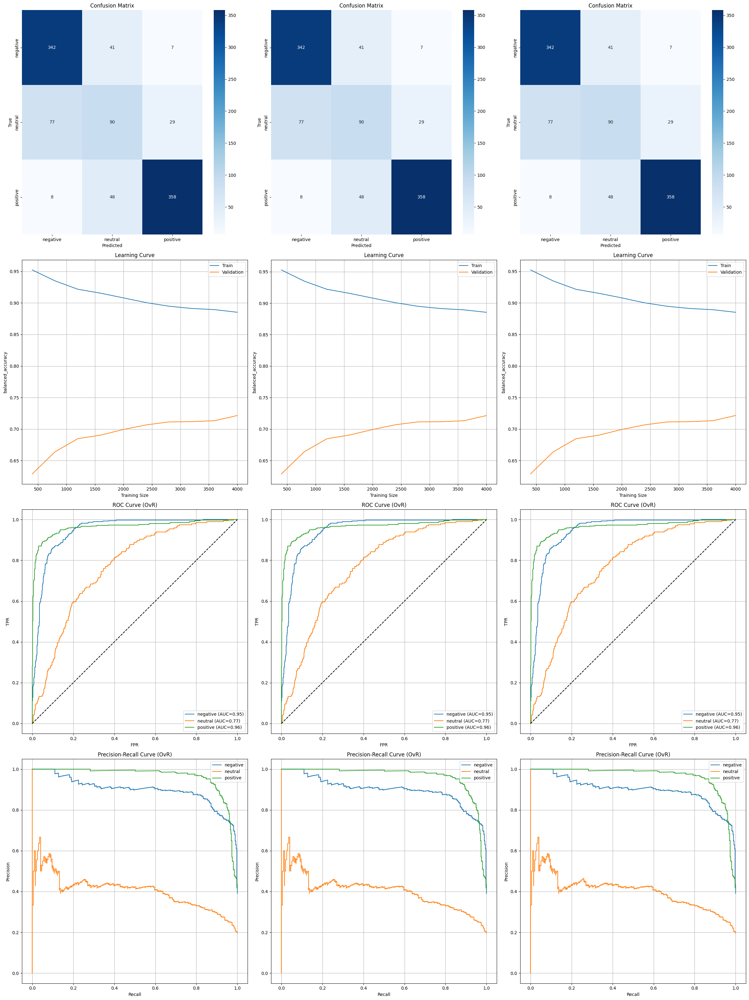

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_bow, bow_X_test, y, bow_y_test, bow_lsvc_top3_models, bow_lsvc_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=bow_rf_cv_results_df,
#     base_model=bow_RandomForestClassifier,
#     X=reviews_df_bow,
#     y=y,
#     scoring='balanced_accuracy'
# )

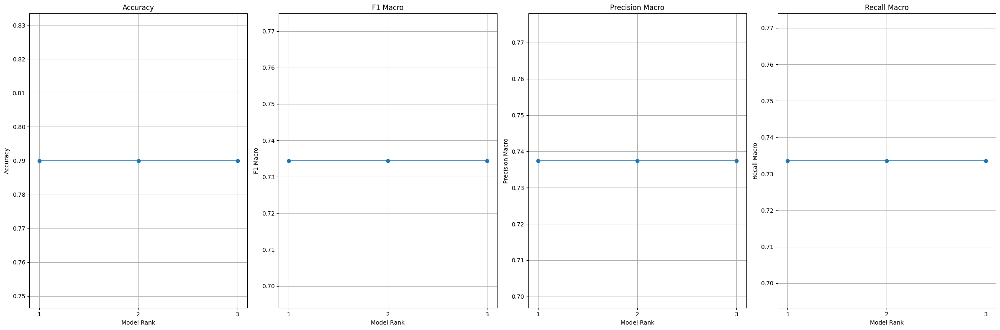

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(bow_lsvc_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_bow_RandomForestClassifier = bow_lsvc_bayes_searchCV.best_estimator_

### TF-IDF (Sparse)

In [ ]:
# Train-test split
tfidf_X_train, tfidf_X_test, tfidf_y_train, tfidf_y_test = train_test_split(reviews_df_tfidf, y, test_size=0.2, random_state=42)

#### Random Forest Classifier

In [ ]:
tfidf_RandomForestClassifier = RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1)

tfidf_rf_search_space = {
    'n_estimators': Integer(100, 10000),
    'max_depth': [None] + list(np.arange(10, 501, 10)),
    'min_samples_split': Integer(2, 51),
    'min_samples_leaf': Integer(1, 51),
}

tfidf_rf_bayes_searchCV = BayesSearchCV(
    estimator=tfidf_RandomForestClassifier,
    search_spaces=tfidf_rf_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

tfidf_rf_bayes_search = tfidf_rf_bayes_searchCV.fit(reviews_df_tfidf, y)

In [ ]:
tfidf_rf_cv_results_df = pd.DataFrame(tfidf_rf_bayes_searchCV.cv_results_)
display(tfidf_rf_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
tfidf_rf_ranked25_df = tfidf_rf_cv_results_df.sort_values(by='rank_test_score')
tfidf_rf_top3_df = tfidf_rf_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
tfidf_rf_top3_models = []
tfidf_rf_top3_y_preds = []
tfidf_rf_top3_metrics = []

for i, row in tfidf_rf_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(tfidf_RandomForestClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(tfidf_X_train, tfidf_y_train)
    y_pred = model.predict(tfidf_X_test)

    report = classification_report(tfidf_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(tfidf_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    tfidf_rf_top3_models.append(model)
    tfidf_rf_top3_y_preds.append(y_pred)
    tfidf_rf_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(tfidf_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'max_depth': 410, 'min_samples_leaf': 10, 'min_samples_split': 31, 'n_estimators': 8047})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.87      0.83       390
     neutral       0.53      0.40      0.46       196
    positive       0.88      0.90      0.89       414

    accuracy                           0.79      1000
   macro avg       0.73      0.72      0.72      1000
weighted avg       0.78      0.79      0.78      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'max_depth': 400, 'min_samples_leaf': 13, 'min_samples_split': 35, 'n_estimators': 10000})
Classification Report:
               precision    recall  f1-score   support

    negative       0.79      0.87      0.83       390
     neutral       0.53      0.43      0.48       196
    positive       0.89      0.88      0.89       414

    accuracy                           0.79      1000
   macro avg

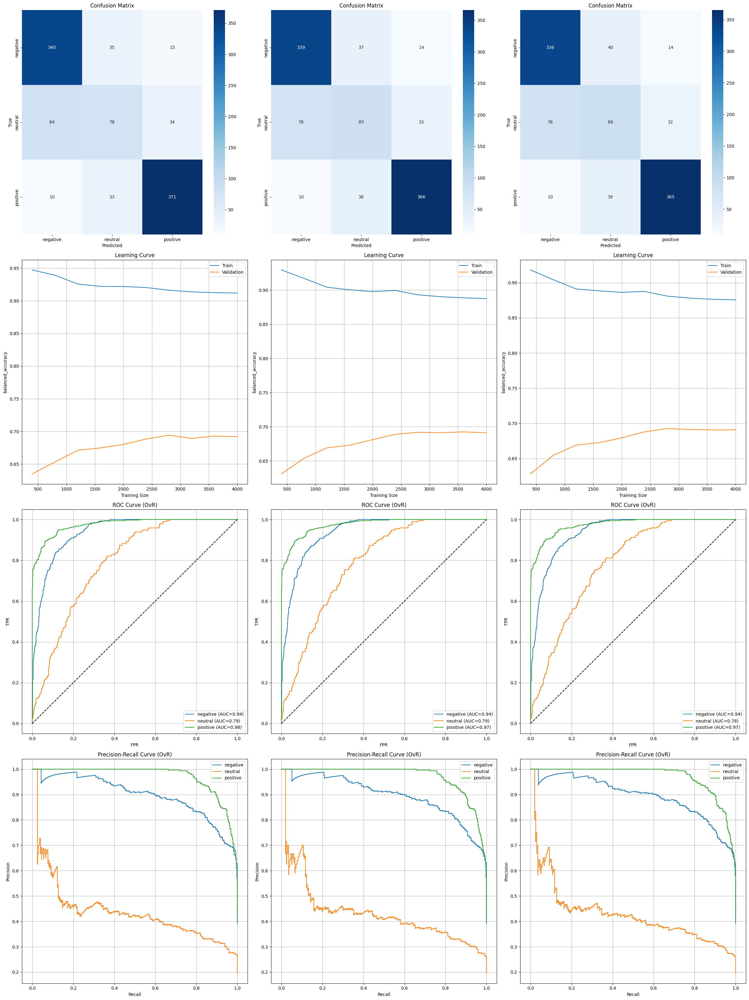

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_tfidf, tfidf_X_test, y, tfidf_y_test, tfidf_rf_top3_models, tfidf_rf_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=tfidf_rf_cv_results_df,
#     base_model=tfidf_RandomForestClassifier,
#     X=reviews_df_tfidf,
#     y=y,
#     scoring='balanced_accuracy'
# )

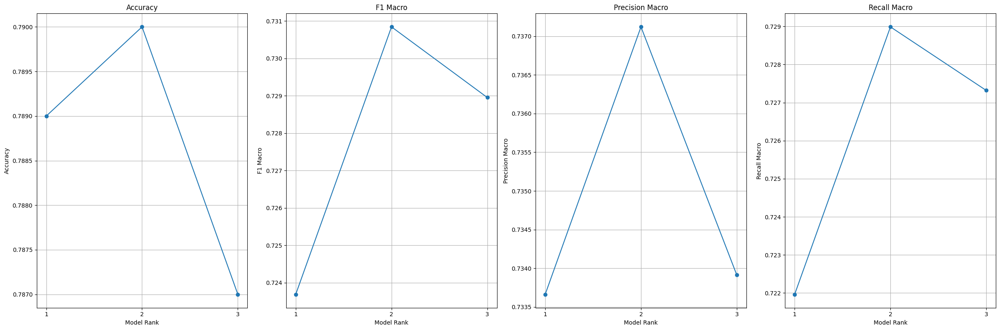

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(tfidf_rf_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_tfidf_RandomForestClassifier = tfidf_rf_bayes_searchCV.best_estimator_

#### Logistic Regression Classifier

##### Search Space - liblinear Solver

In [ ]:
tfidf_LogisticRegressionClassifier_liblinearSolver = LogisticRegression(solver='liblinear', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

tfidf_lr_search_space_liblinearSolver = {
    'penalty': Categorical(['l1', 'l2']),
    'C': Real(1e-4, 1000, prior='log-uniform'),
}

tfidf_lr_bayes_searchCV_liblinearSolverCV = BayesSearchCV(
    estimator=tfidf_LogisticRegressionClassifier_liblinearSolver,
    search_spaces=tfidf_lr_search_space_liblinearSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

tfidf_lr_liblinearSolver_bayes_search = tfidf_lr_bayes_searchCV_liblinearSolverCV.fit(reviews_df_tfidf, y)

In [ ]:
tfidf_lr_liblinearSolver_cv_results_df = pd.DataFrame(tfidf_lr_bayes_searchCV_liblinearSolverCV.cv_results_)
display(tfidf_lr_liblinearSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
tfidf_lr_ranked25_df = tfidf_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score')
tfidf_lr_top3_df = tfidf_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
tfidf_lr_top3_models = []
tfidf_lr_top3_y_preds = []
tfidf_lr_top3_metrics = []

for i, row in tfidf_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(tfidf_LogisticRegressionClassifier_liblinearSolver).set_params(**row['params'])

    # Train and predict
    model.fit(tfidf_X_train, tfidf_y_train)
    y_pred = model.predict(tfidf_X_test)

    report = classification_report(tfidf_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(tfidf_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    tfidf_lr_top3_models.append(model)
    tfidf_lr_top3_y_preds.append(y_pred)
    tfidf_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(tfidf_y_test, y_pred, target_names=class_names))

/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 2.5033783732350456, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.85      0.83       390
     neutral       0.51      0.48      0.50       196
    positive       0.89      0.88      0.89       414

    accuracy                           0.79      1000
   macro avg       0.74      0.74      0.74      1000
weighted avg       0.79      0.79      0.79      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 2.504245593509082, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.85      0.83       390
     neutral       0.51      0.48      0.50       196
    positive       0.89      0.88      0.89       414

    accuracy                           0.79      1000
   macro avg       0.74      0.74      0.74      1000
weighted avg       0.79      0.79      0.79      1000


/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(


/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' i

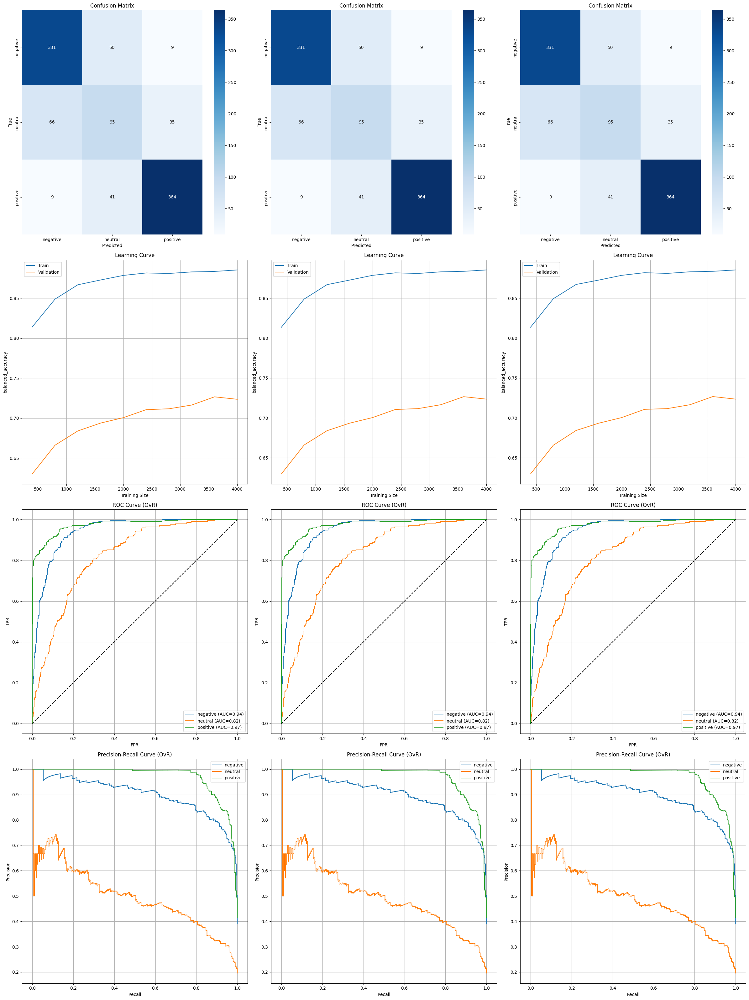

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_tfidf, tfidf_X_test, y, tfidf_y_test, tfidf_lr_top3_models, tfidf_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=tfidf_lr_cv_results_df,
#     base_model=tfidf_RandomForestClassifier,
#     X=reviews_df_tfidf,
#     y=y,
#     scoring='balanced_accuracy'
# )

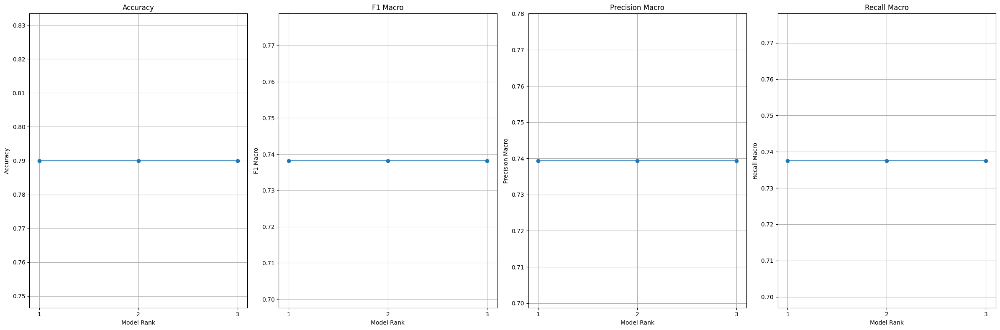

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(tfidf_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_tfidf_LinearRegressionClassifier_liblinearSolver = tfidf_lr_bayes_searchCV_liblinearSolverCV.best_estimator_

##### Search Space - lbfgs Solver

In [ ]:
tfidf_LogisticRegressionClassifier_lbfgsSolver = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

tfidf_lr_search_space_lbfgsSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

tfidf_lr_bayes_searchCV_lbfgsSolverCV = BayesSearchCV(
    estimator=tfidf_LogisticRegressionClassifier_lbfgsSolver,
    search_spaces=tfidf_lr_search_space_lbfgsSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

tfidf_lr_lbfgsSolver_bayes_search = tfidf_lr_bayes_searchCV_lbfgsSolverCV.fit(reviews_df_tfidf, y)

In [ ]:
tfidf_lr_lbfgsSolver_cv_results_df = pd.DataFrame(tfidf_lr_bayes_searchCV_lbfgsSolverCV.cv_results_)
display(tfidf_lr_lbfgsSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
tfidf_lr_ranked25_df = tfidf_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score')
tfidf_lr_top3_df = tfidf_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
tfidf_lr_top3_models = []
tfidf_lr_top3_y_preds = []
tfidf_lr_top3_metrics = []

for i, row in tfidf_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(tfidf_LogisticRegressionClassifier_lbfgsSolver).set_params(**row['params'])

    # Train and predict
    model.fit(tfidf_X_train, tfidf_y_train)
    y_pred = model.predict(tfidf_X_test)

    report = classification_report(tfidf_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(tfidf_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    tfidf_lr_top3_models.append(model)
    tfidf_lr_top3_y_preds.append(y_pred)
    tfidf_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(tfidf_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.5090377975041824})
Classification Report:
               precision    recall  f1-score   support

    negative       0.81      0.79      0.80       390
     neutral       0.46      0.61      0.53       196
    positive       0.95      0.83      0.89       414

    accuracy                           0.77      1000
   macro avg       0.74      0.74      0.74      1000
weighted avg       0.80      0.77      0.78      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.5703914535952458})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.79      0.80       390
     neutral       0.47      0.63      0.54       196
    positive       0.95      0.83      0.89       414

    accuracy                           0.78      1000
   macro avg       0.75      0.75      0.74      1000
weighted avg       0.80      0.78      0.79      1000


=== Model Rank: 3 ===
Hyperpara

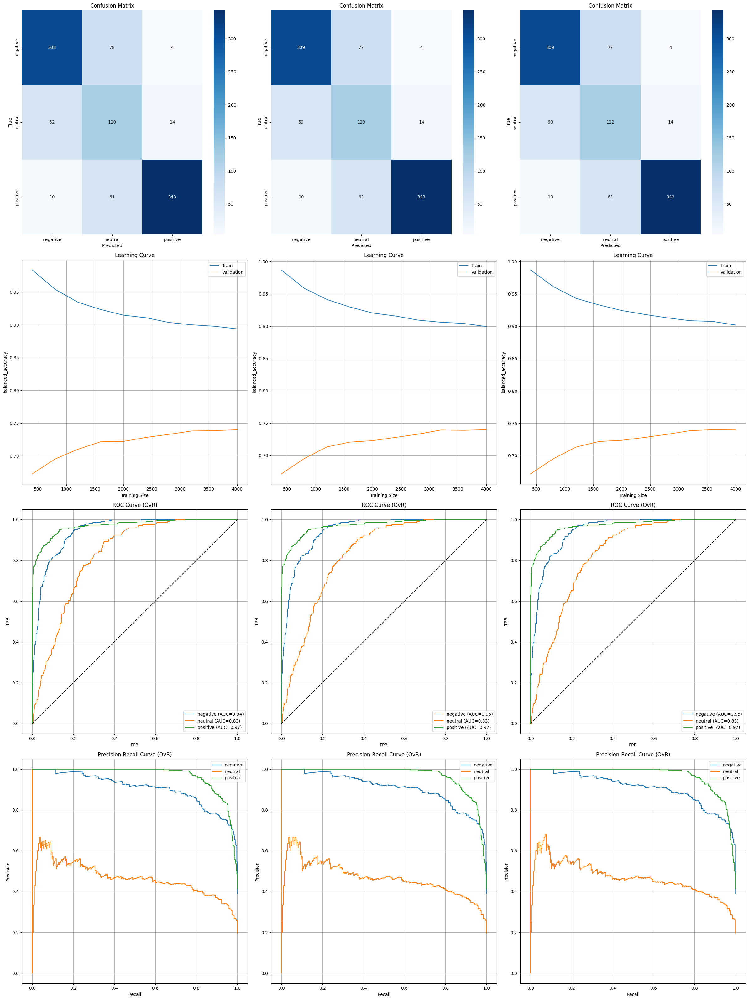

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_tfidf, tfidf_X_test, y, tfidf_y_test, tfidf_lr_top3_models, tfidf_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=tfidf_lr_cv_results_df,
#     base_model=tfidf_RandomForestClassifier,
#     X=reviews_df_tfidf,
#     y=y,
#     scoring='balanced_accuracy'
# )

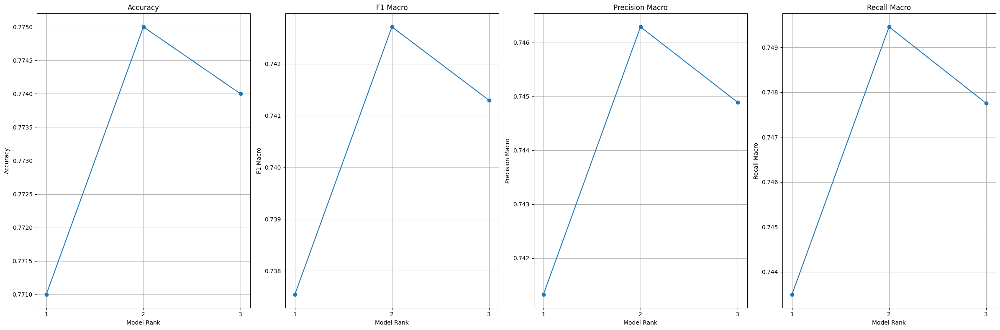

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(tfidf_lr_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_tfidf_LinearRegressionClassifier_lbfgsSolver = tfidf_lr_bayes_searchCV_lbfgsSolverCV.best_estimator_

##### Search Space - saga Solver

In [ ]:
tfidf_LogisticRegressionClassifier_sagaSolver = LogisticRegression(solver='saga', penalty='elasticnet', max_iter=100,  class_weight='balanced', random_state=42, n_jobs=-1)

tfidf_lr_search_space_sagaSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform'),
    'l1_ratio': Real(0, 1.0)
}

tfidf_lr_bayes_searchCV_sagaSolverCV = BayesSearchCV(
    estimator=tfidf_LogisticRegressionClassifier_sagaSolver,
    search_spaces=tfidf_lr_search_space_sagaSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True,
    verbose=2  # shows progress
)

tfidf_lr_sagaSolver_bayes_search = tfidf_lr_bayes_searchCV_sagaSolverCV.fit(reviews_df_tfidf, y)

In [ ]:
tfidf_lr_sagaSolver_cv_results_df = pd.DataFrame(tfidf_lr_bayes_searchCV_sagaSolverCV.cv_results_)
display(tfidf_lr_sagaSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
tfidf_lr_ranked25_df = tfidf_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score')
tfidf_lr_top3_df = tfidf_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
tfidf_lr_top3_models = []
tfidf_lr_top3_y_preds = []
tfidf_lr_top3_metrics = []

for i, row in tfidf_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(tfidf_LogisticRegressionClassifier_sagaSolver).set_params(**row['params'])

    # Train and predict
    model.fit(tfidf_X_train, tfidf_y_train)
    y_pred = model.predict(tfidf_X_test)

    report = classification_report(tfidf_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(tfidf_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    tfidf_lr_top3_models.append(model)
    tfidf_lr_top3_y_preds.append(y_pred)
    tfidf_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(tfidf_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 1.084588011615304, 'l1_ratio': 0.36136483453667756})
Classification Report:
               precision    recall  f1-score   support

    negative       0.84      0.78      0.81       390
     neutral       0.47      0.67      0.55       196
    positive       0.95      0.83      0.88       414

    accuracy                           0.78      1000
   macro avg       0.75      0.76      0.75      1000
weighted avg       0.81      0.78      0.79      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 1.131562710308094, 'l1_ratio': 0.6311105687040461})
Classification Report:
               precision    recall  f1-score   support

    negative       0.84      0.76      0.80       390
     neutral       0.47      0.68      0.55       196
    positive       0.94      0.83      0.88       414

    accuracy                           0.77      1000
   macro avg       0.75      0.76      0.74      1000
weighted avg       0.81 

/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

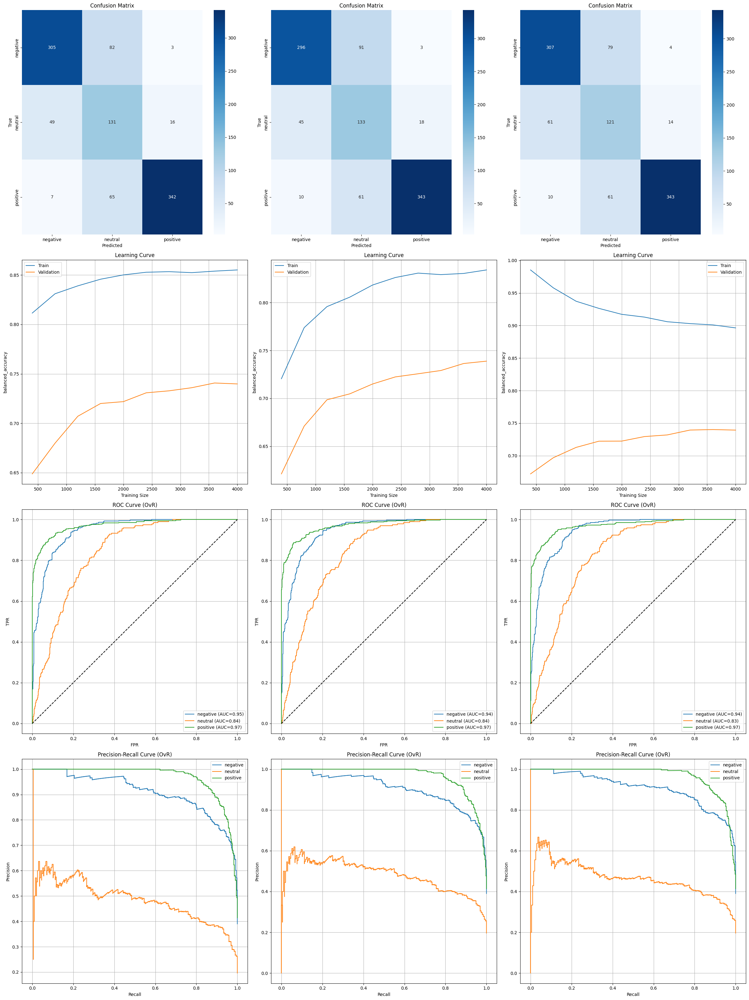

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_tfidf, tfidf_X_test, y, tfidf_y_test, tfidf_lr_top3_models, tfidf_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=tfidf_lr_cv_results_df,
#     base_model=tfidf_RandomForestClassifier,
#     X=reviews_df_tfidf,
#     y=y,
#     scoring='balanced_accuracy'
# )

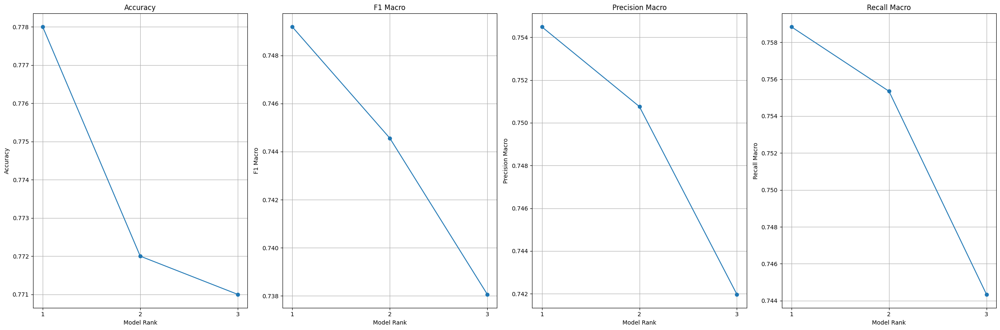

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(tfidf_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_tfidf_LinearRegressionClassifier_sagaSolver = tfidf_lr_bayes_searchCV_sagaSolverCV.best_estimator_

#### LinearSVC Classifier

In [ ]:
tfidf_LinearSVCClassifier = LinearSVC(class_weight='balanced', dual=False, max_iter=5000, random_state=42)

tfidf_lsvc_search_space = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

tfidf_lsvc_bayes_searchCV = BayesSearchCV(
    estimator=tfidf_LinearSVCClassifier,
    search_spaces=tfidf_lsvc_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

tfidf_lsvc_bayes_search = tfidf_lsvc_bayes_searchCV.fit(reviews_df_tfidf, y)

In [ ]:
tfidf_lsvc_cv_results_df = pd.DataFrame(tfidf_lsvc_bayes_searchCV.cv_results_)
display(tfidf_lsvc_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
tfidf_lsvc_ranked25_df = tfidf_lsvc_cv_results_df.sort_values(by='rank_test_score')
tfidf_lsvc_top3_df = tfidf_lsvc_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
tfidf_lsvc_top3_models = []
tfidf_lsvc_top3_y_preds = []
tfidf_lsvc_top3_metrics = []

for i, row in tfidf_lsvc_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(tfidf_LinearSVCClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(tfidf_X_train, tfidf_y_train)
    y_pred = model.predict(tfidf_X_test)

    report = classification_report(tfidf_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(tfidf_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    tfidf_lsvc_top3_models.append(model)
    tfidf_lsvc_top3_y_preds.append(y_pred)
    tfidf_lsvc_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(tfidf_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.2517310160219792})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.89      0.83       390
     neutral       0.50      0.43      0.47       196
    positive       0.92      0.86      0.89       414

    accuracy                           0.79      1000
   macro avg       0.74      0.73      0.73      1000
weighted avg       0.78      0.79      0.78      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.24856046843575758})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.89      0.83       390
     neutral       0.51      0.44      0.47       196
    positive       0.92      0.86      0.89       414

    accuracy                           0.79      1000
   macro avg       0.74      0.73      0.73      1000
weighted avg       0.79      0.79      0.79      1000


=== Model Rank: 2 ===
Hyperpar

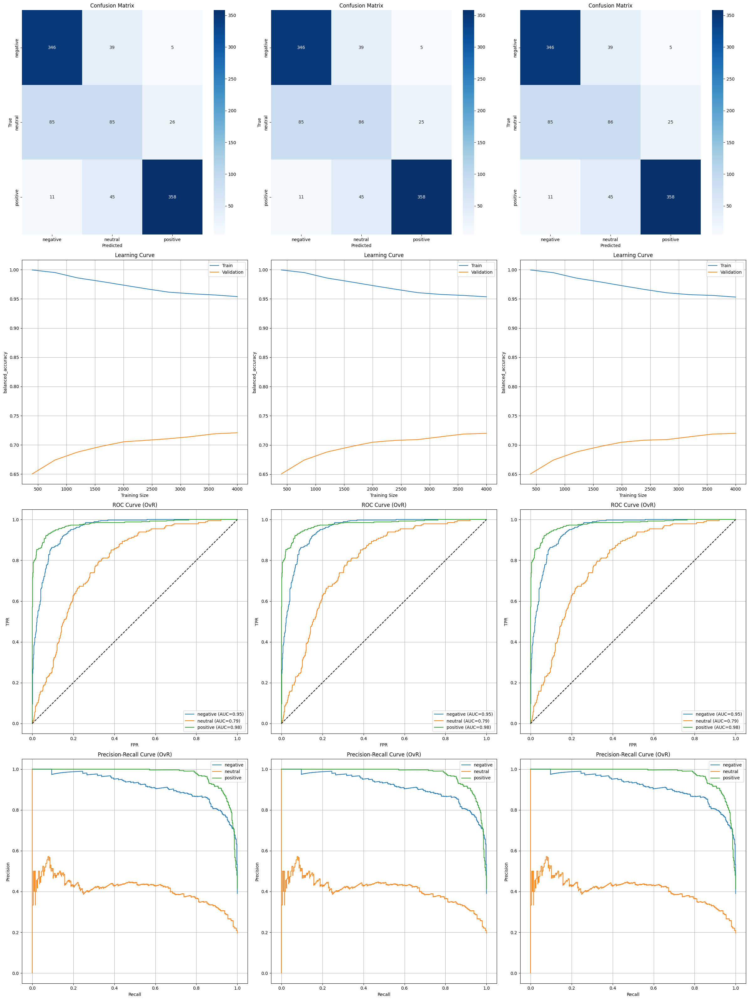

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_tfidf, tfidf_X_test, y, tfidf_y_test, tfidf_lsvc_top3_models, tfidf_lsvc_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=tfidf_rf_cv_results_df,
#     base_model=tfidf_RandomForestClassifier,
#     X=reviews_df_tfidf,
#     y=y,
#     scoring='balanced_accuracy'
# )

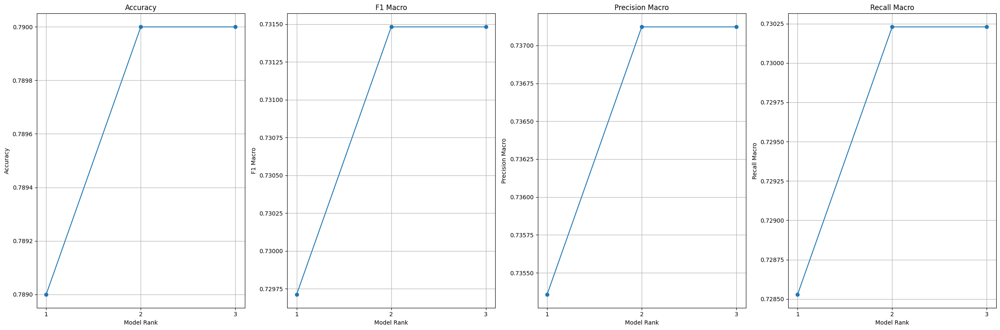

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(tfidf_lsvc_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_tfidf_RandomForestClassifier = tfidf_lsvc_bayes_searchCV.best_estimator_

### GloVe (Dense)

In [ ]:
# Train-test split
glove_X_train, glove_X_test, glove_y_train, glove_y_test = train_test_split(reviews_df_glove, y, test_size=0.2, random_state=42)

#### Random Forest Classifier

In [ ]:
glove_RandomForestClassifier = RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1)

glove_rf_search_space = {
    'n_estimators': Integer(100, 10000),
    'max_depth': [None] + list(np.arange(10, 501, 10)),
    'min_samples_split': Integer(2, 51),
    'min_samples_leaf': Integer(1, 51),
}

glove_rf_bayes_searchCV = BayesSearchCV(
    estimator=glove_RandomForestClassifier,
    search_spaces=glove_rf_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

glove_rf_bayes_search = glove_rf_bayes_searchCV.fit(reviews_df_glove, y)

In [ ]:
glove_rf_cv_results_df = pd.DataFrame(glove_rf_bayes_searchCV.cv_results_)
display(glove_rf_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
glove_rf_ranked25_df = glove_rf_cv_results_df.sort_values(by='rank_test_score')
glove_rf_top3_df = glove_rf_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
glove_rf_top3_models = []
glove_rf_top3_y_preds = []
glove_rf_top3_metrics = []

for i, row in glove_rf_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(glove_RandomForestClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(glove_X_train, glove_y_train)
    y_pred = model.predict(glove_X_test)

    report = classification_report(glove_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(glove_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    glove_rf_top3_models.append(model)
    glove_rf_top3_y_preds.append(y_pred)
    glove_rf_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(glove_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'max_depth': 170, 'min_samples_leaf': 1, 'min_samples_split': 50, 'n_estimators': 1124})
Classification Report:
               precision    recall  f1-score   support

    negative       0.76      0.81      0.78       390
     neutral       0.43      0.45      0.44       196
    positive       0.88      0.80      0.84       414

    accuracy                           0.73      1000
   macro avg       0.69      0.69      0.69      1000
weighted avg       0.74      0.73      0.74      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'max_depth': 130, 'min_samples_leaf': 1, 'min_samples_split': 51, 'n_estimators': 1575})
Classification Report:
               precision    recall  f1-score   support

    negative       0.76      0.81      0.78       390
     neutral       0.43      0.45      0.44       196
    positive       0.88      0.80      0.84       414

    accuracy                           0.73      1000
   macro avg   

/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)


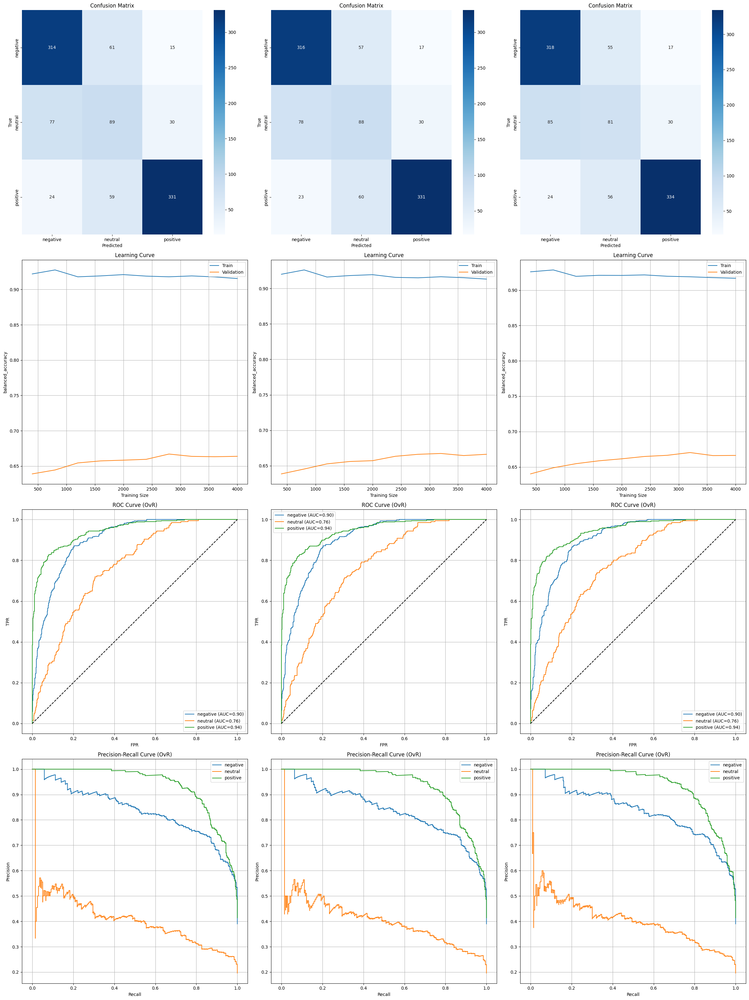

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_glove, glove_X_test, y, glove_y_test, glove_rf_top3_models, glove_rf_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=glove_rf_cv_results_df,
#     base_model=glove_RandomForestClassifier,
#     X=reviews_df_glove,
#     y=y,
#     scoring='balanced_accuracy'
# )

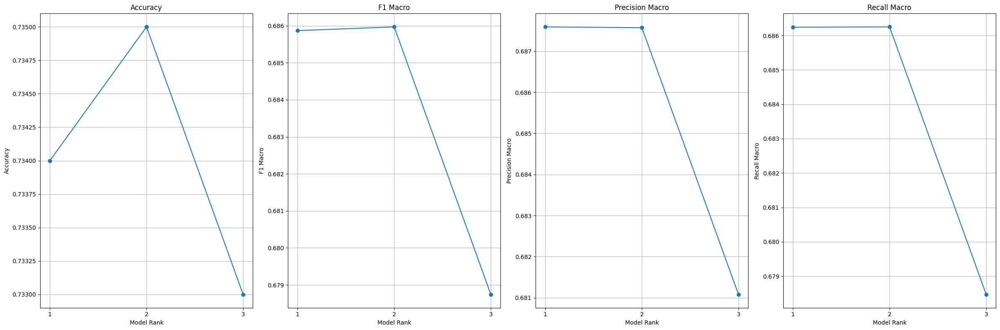

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(glove_rf_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_glove_RandomForestClassifier = glove_rf_bayes_searchCV.best_estimator_

#### Logistic Regression Classifier

##### Search Space - liblinear Solver

In [ ]:
glove_LogisticRegressionClassifier_liblinearSolver = LogisticRegression(solver='liblinear', max_iter=100,  class_weight='balanced', random_state=42, n_jobs=-1)

glove_lr_search_space_liblinearSolver = {
    'penalty': Categorical(['l1', 'l2']),
    'C': Real(1e-4, 1000, prior='log-uniform'),
}

glove_lr_bayes_searchCV_liblinearSolverCV = BayesSearchCV(
    estimator=glove_LogisticRegressionClassifier_liblinearSolver,
    search_spaces=glove_lr_search_space_liblinearSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True,
    verbose=2
)

glove_lr_liblinearSolver_bayes_search = glove_lr_bayes_searchCV_liblinearSolverCV.fit(reviews_df_glove, y)

In [ ]:
glove_lr_liblinearSolver_cv_results_df = pd.DataFrame(glove_lr_bayes_searchCV_liblinearSolverCV.cv_results_)
display(glove_lr_liblinearSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
glove_lr_ranked25_df = glove_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score')
glove_lr_top3_df = glove_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
glove_lr_top3_models = []
glove_lr_top3_y_preds = []
glove_lr_top3_metrics = []

for i, row in glove_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(glove_LogisticRegressionClassifier_liblinearSolver).set_params(**row['params'])

    # Train and predict
    model.fit(glove_X_train, glove_y_train)
    y_pred = model.predict(glove_X_test)

    report = classification_report(glove_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(glove_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    glove_lr_top3_models.append(model)
    glove_lr_top3_y_preds.append(y_pred)
    glove_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(glove_y_test, y_pred, target_names=class_names))

/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(



=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 29.405900571343654, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.83      0.80       390
     neutral       0.45      0.40      0.42       196
    positive       0.85      0.85      0.85       414

    accuracy                           0.75      1000
   macro avg       0.69      0.69      0.69      1000
weighted avg       0.75      0.75      0.75      1000



/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(



=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 48.61518228524981, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.83      0.80       390
     neutral       0.44      0.40      0.42       196
    positive       0.86      0.85      0.85       414

    accuracy                           0.75      1000
   macro avg       0.69      0.69      0.69      1000
weighted avg       0.75      0.75      0.75      1000



/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(
/Users/dinithheshan/.pyenv/versions/pyenv-3_12_4/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1305: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.
  warnings.warn(



=== Model Rank: 3 ===
Hyperparameters: OrderedDict({'C': 39.5252013727049, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.83      0.80       390
     neutral       0.45      0.40      0.42       196
    positive       0.85      0.85      0.85       414

    accuracy                           0.75      1000
   macro avg       0.69      0.69      0.69      1000
weighted avg       0.75      0.75      0.75      1000



/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

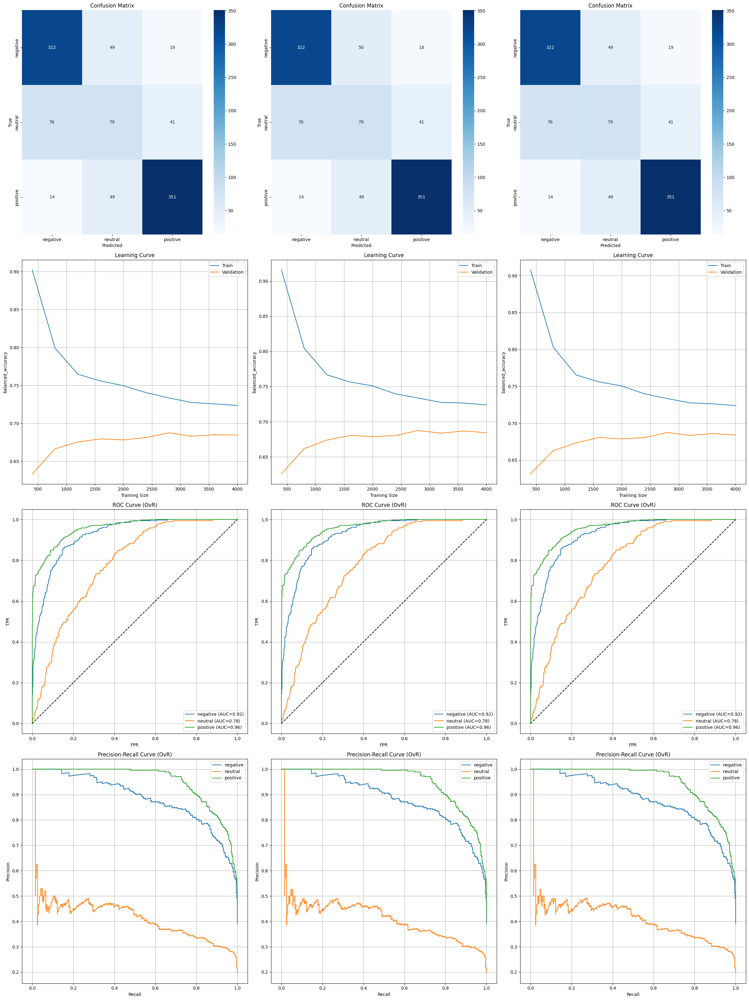

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_glove, glove_X_test, y, glove_y_test, glove_lr_top3_models, glove_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=glove_lr_cv_results_df,
#     base_model=glove_RandomForestClassifier,
#     X=reviews_df_glove,
#     y=y,
#     scoring='balanced_accuracy'
# )

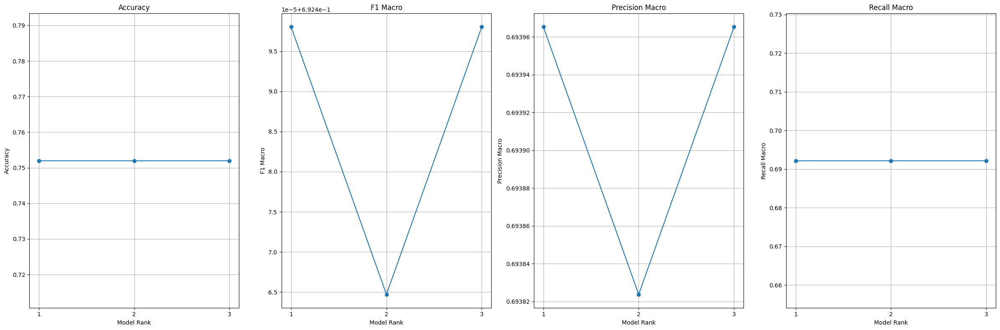

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(glove_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_glove_LinearRegressionClassifier_liblinearSolver = glove_lr_bayes_searchCV_liblinearSolverCV.best_estimator_

##### Search Space - lbfgs Solver

In [ ]:
glove_LogisticRegressionClassifier_lbfgsSolver = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=100,  class_weight='balanced', random_state=42, n_jobs=-1)

glove_lr_search_space_lbfgsSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

glove_lr_bayes_searchCV_lbfgsSolverCV = BayesSearchCV(
    estimator=glove_LogisticRegressionClassifier_lbfgsSolver,
    search_spaces=glove_lr_search_space_lbfgsSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

glove_lr_lbfgsSolver_bayes_search = glove_lr_bayes_searchCV_lbfgsSolverCV.fit(reviews_df_glove, y)

In [ ]:
glove_lr_lbfgsSolver_cv_results_df = pd.DataFrame(glove_lr_bayes_searchCV_lbfgsSolverCV.cv_results_)
display(glove_lr_lbfgsSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
glove_lr_ranked25_df = glove_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score')
glove_lr_top3_df = glove_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
glove_lr_top3_models = []
glove_lr_top3_y_preds = []
glove_lr_top3_metrics = []

for i, row in glove_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(glove_LogisticRegressionClassifier_lbfgsSolver).set_params(**row['params'])

    # Train and predict
    model.fit(glove_X_train, glove_y_train)
    y_pred = model.predict(glove_X_test)

    report = classification_report(glove_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(glove_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    glove_lr_top3_models.append(model)
    glove_lr_top3_y_preds.append(y_pred)
    glove_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(glove_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 48.61518228524981})
Classification Report:
               precision    recall  f1-score   support

    negative       0.83      0.75      0.79       390
     neutral       0.43      0.61      0.50       196
    positive       0.90      0.80      0.85       414

    accuracy                           0.74      1000
   macro avg       0.72      0.72      0.71      1000
weighted avg       0.78      0.74      0.76      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 13.746626277890918})
Classification Report:
               precision    recall  f1-score   support

    negative       0.83      0.74      0.78       390
     neutral       0.42      0.60      0.49       196
    positive       0.90      0.80      0.85       414

    accuracy                           0.74      1000
   macro avg       0.72      0.72      0.71      1000
weighted avg       0.78      0.74      0.75      1000


=== Model Rank: 3 ===
Hyperparam

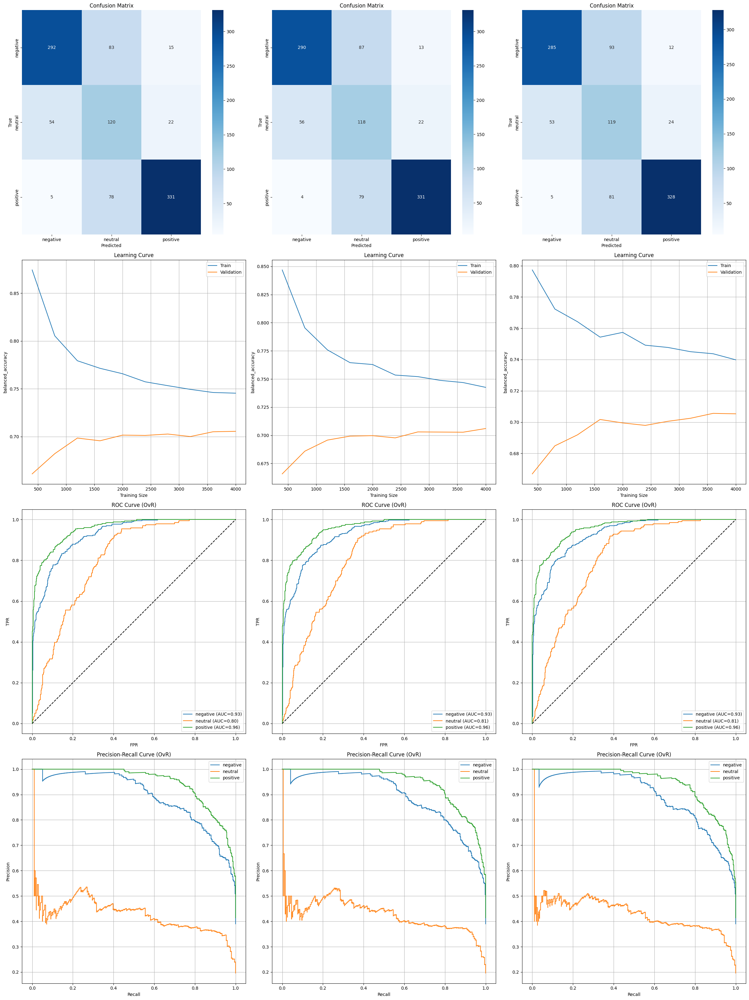

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_glove, glove_X_test, y, glove_y_test, glove_lr_top3_models, glove_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=glove_lr_cv_results_df,
#     base_model=glove_RandomForestClassifier,
#     X=reviews_df_glove,
#     y=y,
#     scoring='balanced_accuracy'
# )

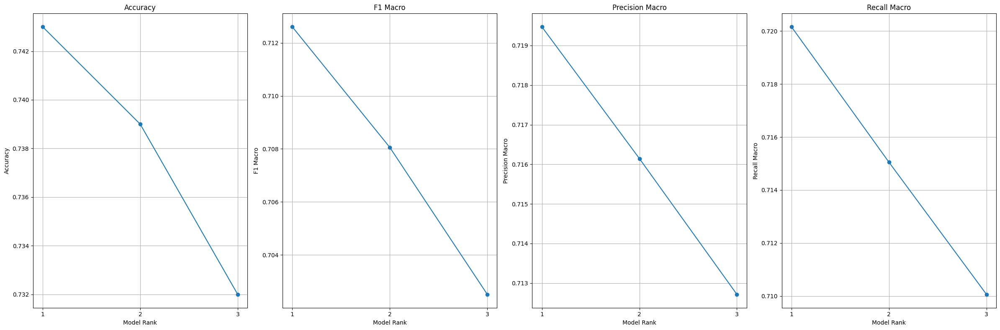

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(glove_lr_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_glove_LinearRegressionClassifier_lbfgsSolver = glove_lr_bayes_searchCV_lbfgsSolverCV.best_estimator_

##### Search Space - saga Solver

In [ ]:
glove_LogisticRegressionClassifier_sagaSolver = LogisticRegression(solver='saga', penalty='elasticnet', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

glove_lr_search_space_sagaSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform'),
    'l1_ratio': Real(0, 1.0)
}

glove_lr_bayes_searchCV_sagaSolverCV = BayesSearchCV(
    estimator=glove_LogisticRegressionClassifier_sagaSolver,
    search_spaces=glove_lr_search_space_sagaSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

glove_lr_sagaSolver_bayes_search = glove_lr_bayes_searchCV_sagaSolverCV.fit(reviews_df_glove, y)

In [ ]:
glove_lr_sagaSolver_cv_results_df = pd.DataFrame(glove_lr_bayes_searchCV_sagaSolverCV.cv_results_)
display(glove_lr_sagaSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
glove_lr_ranked25_df = glove_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score')
glove_lr_top3_df = glove_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
glove_lr_top3_models = []
glove_lr_top3_y_preds = []
glove_lr_top3_metrics = []

for i, row in glove_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(glove_LogisticRegressionClassifier_sagaSolver).set_params(**row['params'])

    # Train and predict
    model.fit(glove_X_train, glove_y_train)
    y_pred = model.predict(glove_X_test)

    report = classification_report(glove_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(glove_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    glove_lr_top3_models.append(model)
    glove_lr_top3_y_preds.append(y_pred)
    glove_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(glove_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 3.493167043648667, 'l1_ratio': 0.962836047503405})
Classification Report:
               precision    recall  f1-score   support

    negative       0.82      0.74      0.78       390
     neutral       0.40      0.58      0.48       196
    positive       0.91      0.81      0.86       414

    accuracy                           0.74      1000
   macro avg       0.71      0.71      0.70      1000
weighted avg       0.78      0.74      0.75      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 21.47525371076032, 'l1_ratio': 0.0})
Classification Report:
               precision    recall  f1-score   support

    negative       0.83      0.73      0.78       390
     neutral       0.40      0.58      0.47       196
    positive       0.89      0.80      0.85       414

    accuracy                           0.73      1000
   macro avg       0.71      0.71      0.70      1000
weighted avg       0.77      0.73      0.

/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

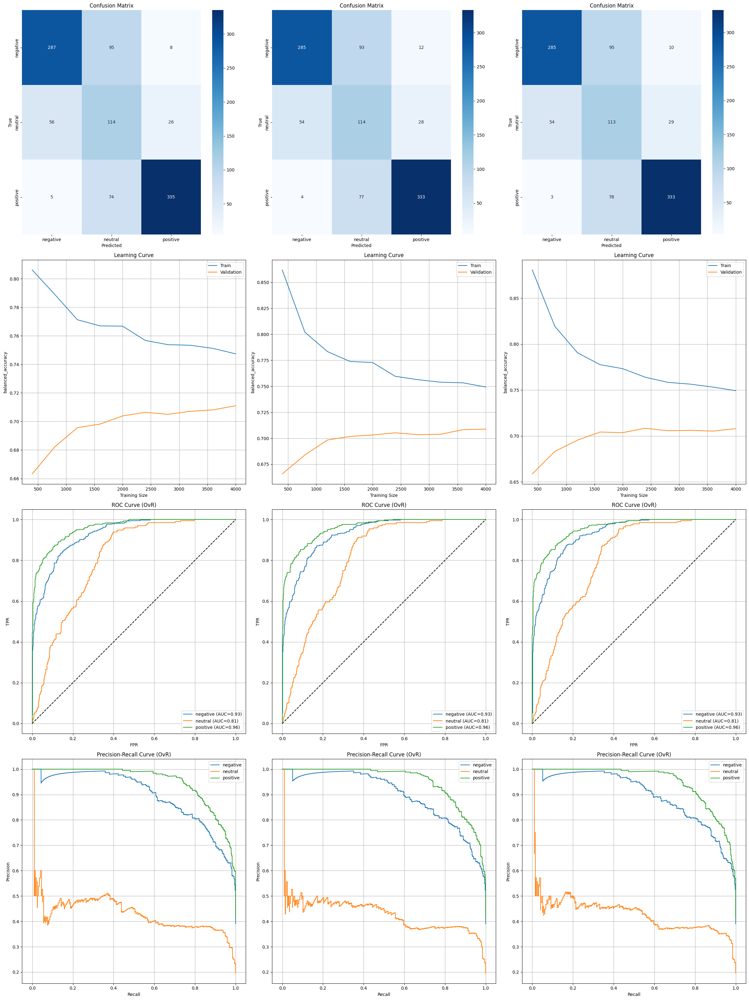

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_glove, glove_X_test, y, glove_y_test, glove_lr_top3_models, glove_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=glove_lr_cv_results_df,
#     base_model=glove_RandomForestClassifier,
#     X=reviews_df_glove,
#     y=y,
#     scoring='balanced_accuracy'
# )

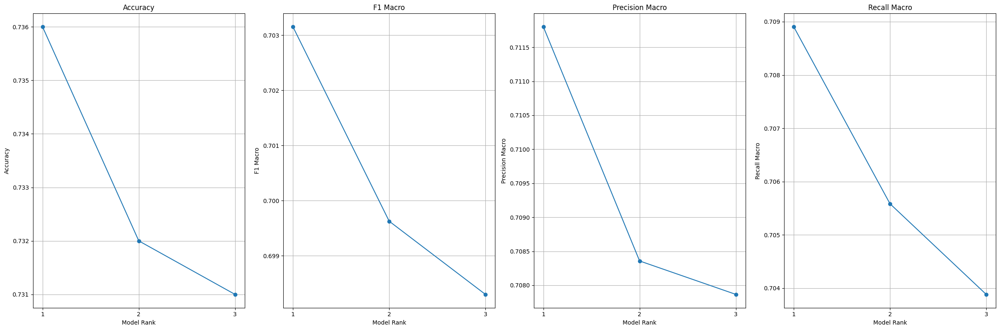

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(glove_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_glove_LinearRegressionClassifier_sagaSolver = glove_lr_bayes_searchCV_sagaSolverCV.best_estimator_

#### LinearSVC Classifier

In [ ]:
glove_LinearSVCClassifier = LinearSVC(class_weight='balanced', dual=False, max_iter=5000, random_state=42)

glove_lsvc_search_space = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

glove_lsvc_bayes_searchCV = BayesSearchCV(
    estimator=glove_LinearSVCClassifier,
    search_spaces=glove_lsvc_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

glove_lsvc_bayes_search = glove_lsvc_bayes_searchCV.fit(reviews_df_glove, y)

In [ ]:
glove_lsvc_cv_results_df = pd.DataFrame(glove_lsvc_bayes_searchCV.cv_results_)
display(glove_lsvc_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
glove_lsvc_ranked25_df = glove_lsvc_cv_results_df.sort_values(by='rank_test_score')
glove_lsvc_top3_df = glove_lsvc_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
glove_lsvc_top3_models = []
glove_lsvc_top3_y_preds = []
glove_lsvc_top3_metrics = []

for i, row in glove_lsvc_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(glove_LinearSVCClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(glove_X_train, glove_y_train)
    y_pred = model.predict(glove_X_test)

    report = classification_report(glove_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(glove_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    glove_lsvc_top3_models.append(model)
    glove_lsvc_top3_y_preds.append(y_pred)
    glove_lsvc_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(glove_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 72.73082081096716})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.83      0.80       390
     neutral       0.44      0.38      0.41       196
    positive       0.86      0.86      0.86       414

    accuracy                           0.75      1000
   macro avg       0.69      0.69      0.69      1000
weighted avg       0.74      0.75      0.75      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 85.81292080425638})
Classification Report:
               precision    recall  f1-score   support

    negative       0.78      0.83      0.80       390
     neutral       0.44      0.38      0.41       196
    positive       0.86      0.86      0.86       414

    accuracy                           0.75      1000
   macro avg       0.69      0.69      0.69      1000
weighted avg       0.74      0.75      0.75      1000


=== Model Rank: 1 ===
Hyperparame

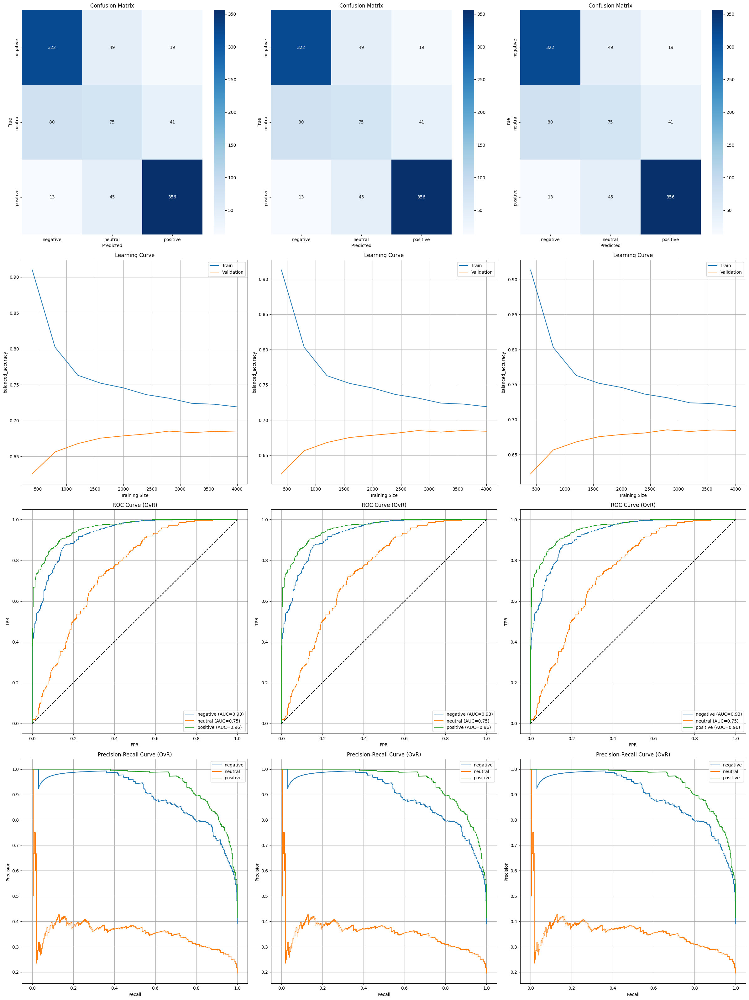

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_glove, glove_X_test, y, glove_y_test, glove_lsvc_top3_models, glove_lsvc_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=glove_rf_cv_results_df,
#     base_model=glove_RandomForestClassifier,
#     X=reviews_df_glove,
#     y=y,
#     scoring='balanced_accuracy'
# )

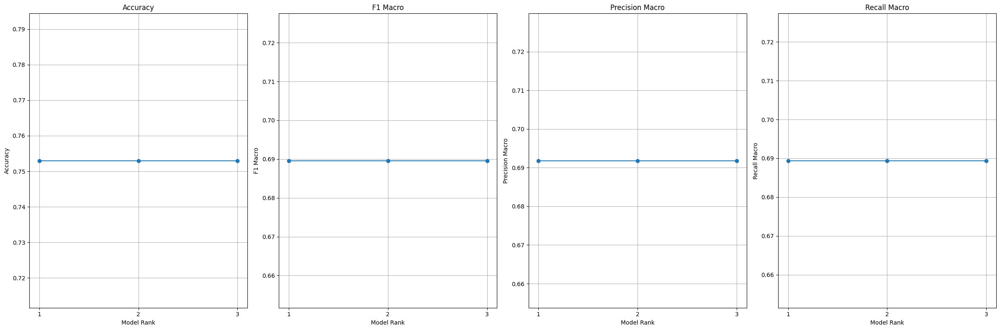

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(glove_lsvc_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_glove_RandomForestClassifier = glove_lsvc_bayes_searchCV.best_estimator_

### Doc2Vec (Dense)

In [ ]:
# Train-test split
doc2vec_X_train, doc2vec_X_test, doc2vec_y_train, doc2vec_y_test = train_test_split(reviews_df_doc2vec, y, test_size=0.2, random_state=42)

#### Random Forest Classifier

In [ ]:
doc2vec_RandomForestClassifier = RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1)

doc2vec_rf_search_space = {
    'n_estimators': Integer(100, 1000),
    'max_depth': [None] + list(np.arange(10, 501, 10)),
    'min_samples_split': Integer(2, 51),
    'min_samples_leaf': Integer(1, 51),
}

doc2vec_rf_bayes_searchCV = BayesSearchCV(
    estimator=doc2vec_RandomForestClassifier,
    search_spaces=doc2vec_rf_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True,
    verbose=2
)

doc2vec_rf_bayes_search = doc2vec_rf_bayes_searchCV.fit(reviews_df_doc2vec, y)

In [ ]:
doc2vec_rf_cv_results_df = pd.DataFrame(doc2vec_rf_bayes_searchCV.cv_results_)
display(doc2vec_rf_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
doc2vec_rf_ranked25_df = doc2vec_rf_cv_results_df.sort_values(by='rank_test_score')
doc2vec_rf_top3_df = doc2vec_rf_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
doc2vec_rf_top3_models = []
doc2vec_rf_top3_y_preds = []
doc2vec_rf_top3_metrics = []

for i, row in doc2vec_rf_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(doc2vec_RandomForestClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(doc2vec_X_train, doc2vec_y_train)
    y_pred = model.predict(doc2vec_X_test)

    report = classification_report(doc2vec_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(doc2vec_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    doc2vec_rf_top3_models.append(model)
    doc2vec_rf_top3_y_preds.append(y_pred)
    doc2vec_rf_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(doc2vec_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'max_depth': 400, 'min_samples_leaf': 23, 'min_samples_split': 28, 'n_estimators': 744})
Classification Report:
               precision    recall  f1-score   support

    negative       0.70      0.82      0.76       390
     neutral       0.36      0.26      0.30       196
    positive       0.86      0.83      0.84       414

    accuracy                           0.72      1000
   macro avg       0.64      0.64      0.63      1000
weighted avg       0.70      0.72      0.70      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'max_depth': 90, 'min_samples_leaf': 32, 'min_samples_split': 49, 'n_estimators': 920})
Classification Report:
               precision    recall  f1-score   support

    negative       0.72      0.80      0.76       390
     neutral       0.40      0.34      0.36       196
    positive       0.85      0.82      0.84       414

    accuracy                           0.72      1000
   macro avg    

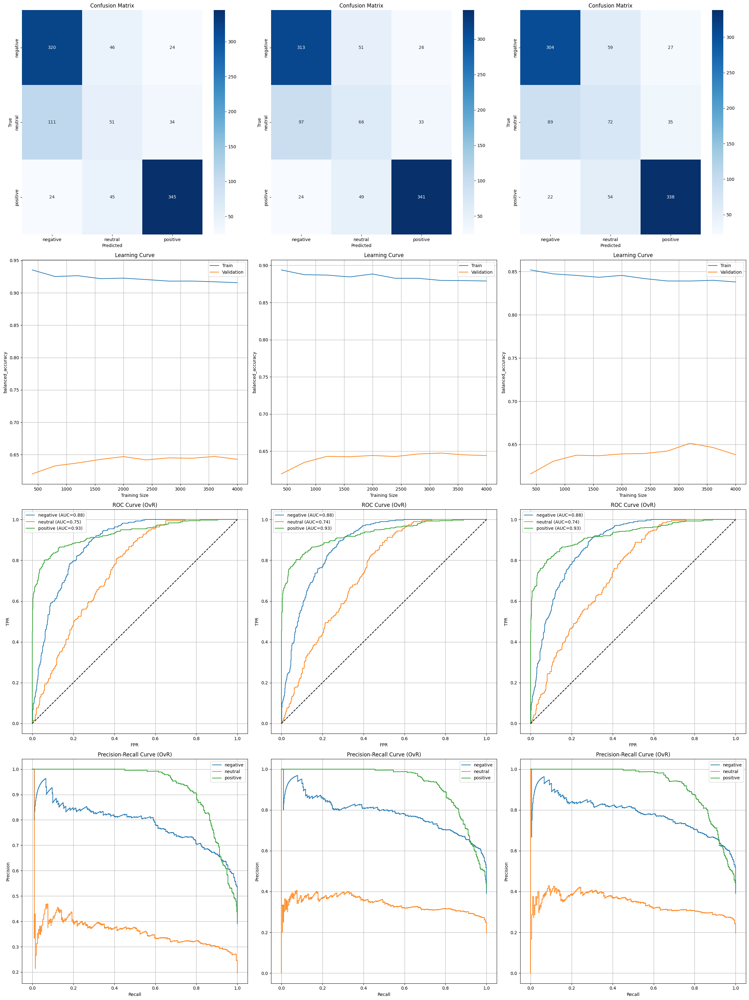

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_doc2vec, doc2vec_X_test, y, doc2vec_y_test, doc2vec_rf_top3_models, doc2vec_rf_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=doc2vec_rf_cv_results_df,
#     base_model=doc2vec_RandomForestClassifier,
#     X=reviews_df_doc2vec,
#     y=y,
#     scoring='balanced_accuracy'
# )

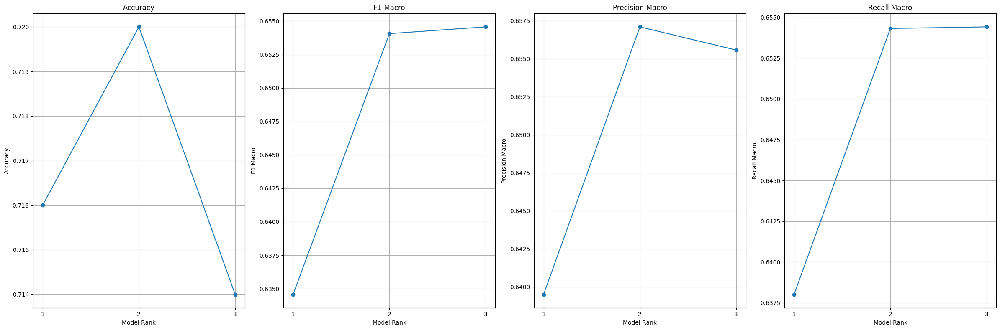

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(doc2vec_rf_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_doc2vec_RandomForestClassifier = doc2vec_rf_bayes_searchCV.best_estimator_

#### Logistic Regression Classifier

##### Search Space - liblinear Solver

In [ ]:
doc2vec_LogisticRegressionClassifier_liblinearSolver = LogisticRegression(solver='liblinear', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

doc2vec_lr_search_space_liblinearSolver = {
    'penalty': Categorical(['l1', 'l2']),
    'C': Real(1e-4, 1000, prior='log-uniform'),
}

doc2vec_lr_bayes_searchCV_liblinearSolverCV = BayesSearchCV(
    estimator=doc2vec_LogisticRegressionClassifier_liblinearSolver,
    search_spaces=doc2vec_lr_search_space_liblinearSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

doc2vec_lr_liblinearSolver_bayes_search = doc2vec_lr_bayes_searchCV_liblinearSolverCV.fit(reviews_df_doc2vec, y)

In [ ]:
doc2vec_lr_liblinearSolver_cv_results_df = pd.DataFrame(doc2vec_lr_bayes_searchCV_liblinearSolverCV.cv_results_)
display(doc2vec_lr_liblinearSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
doc2vec_lr_ranked25_df = doc2vec_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score')
doc2vec_lr_top3_df = doc2vec_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
doc2vec_lr_top3_models = []
doc2vec_lr_top3_y_preds = []
doc2vec_lr_top3_metrics = []

for i, row in doc2vec_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(doc2vec_LogisticRegressionClassifier_liblinearSolver).set_params(**row['params'])

    # Train and predict
    model.fit(doc2vec_X_train, doc2vec_y_train)
    y_pred = model.predict(doc2vec_X_test)

    report = classification_report(doc2vec_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(doc2vec_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    doc2vec_lr_top3_models.append(model)
    doc2vec_lr_top3_y_preds.append(y_pred)
    doc2vec_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(doc2vec_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 193.31718767500647, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.74      0.85      0.79       390
     neutral       0.45      0.38      0.41       196
    positive       0.91      0.86      0.88       414

    accuracy                           0.76      1000
   macro avg       0.70      0.69      0.69      1000
weighted avg       0.75      0.76      0.75      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 1000.0, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.74      0.85      0.79       390
     neutral       0.45      0.38      0.41       196
    positive       0.91      0.86      0.88       414

    accuracy                           0.76      1000
   macro avg       0.70      0.69      0.69      1000
weighted avg       0.75      0.76      0.75      1000


=== Model

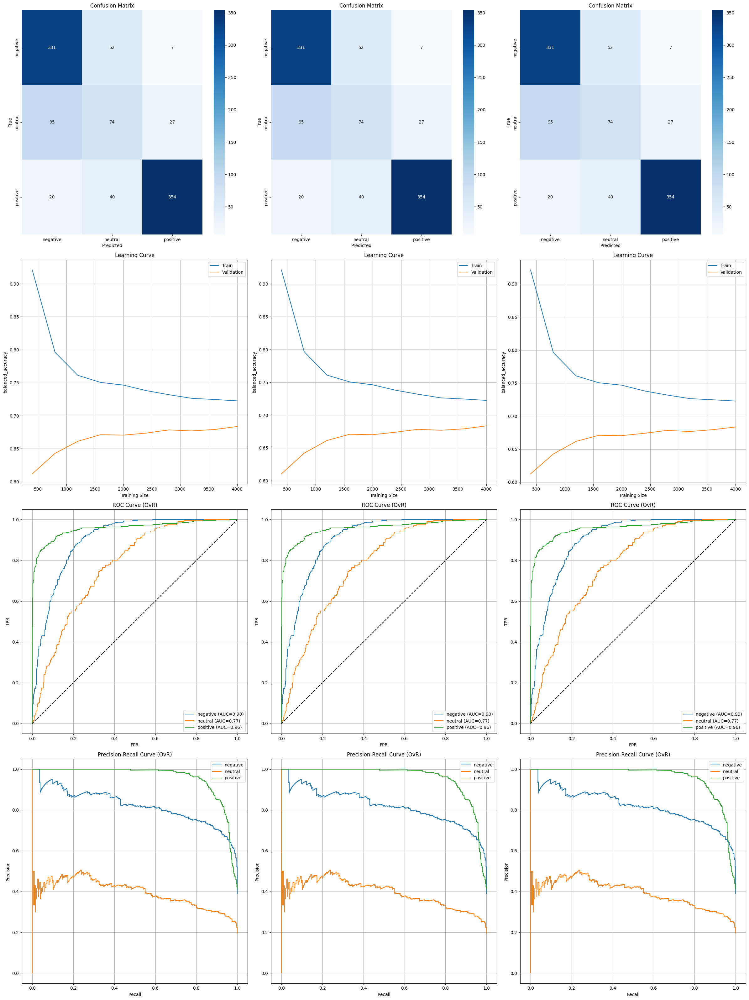

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_doc2vec, doc2vec_X_test, y, doc2vec_y_test, doc2vec_lr_top3_models, doc2vec_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=doc2vec_lr_cv_results_df,
#     base_model=doc2vec_RandomForestClassifier,
#     X=reviews_df_doc2vec,
#     y=y,
#     scoring='balanced_accuracy'
# )

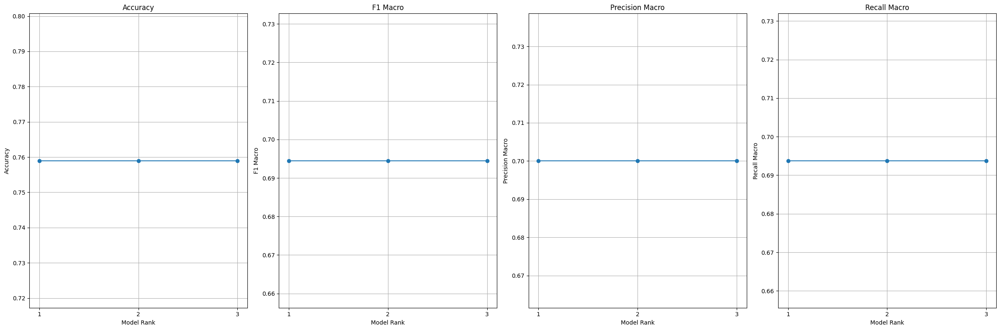

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(doc2vec_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_doc2vec_LinearRegressionClassifier_liblinearSolver = doc2vec_lr_bayes_searchCV_liblinearSolverCV.best_estimator_

##### Search Space - lbfgs Solver

In [ ]:
doc2vec_LogisticRegressionClassifier_lbfgsSolver = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=1000,  class_weight='balanced', random_state=42, n_jobs=-1)

doc2vec_lr_search_space_lbfgsSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

doc2vec_lr_bayes_searchCV_lbfgsSolverCV = BayesSearchCV(
    estimator=doc2vec_LogisticRegressionClassifier_lbfgsSolver,
    search_spaces=doc2vec_lr_search_space_lbfgsSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

doc2vec_lr_lbfgsSolver_bayes_search = doc2vec_lr_bayes_searchCV_lbfgsSolverCV.fit(reviews_df_doc2vec, y)

In [ ]:
doc2vec_lr_lbfgsSolver_cv_results_df = pd.DataFrame(doc2vec_lr_bayes_searchCV_lbfgsSolverCV.cv_results_)
display(doc2vec_lr_lbfgsSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
doc2vec_lr_ranked25_df = doc2vec_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score')
doc2vec_lr_top3_df = doc2vec_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
doc2vec_lr_top3_models = []
doc2vec_lr_top3_y_preds = []
doc2vec_lr_top3_metrics = []

for i, row in doc2vec_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(doc2vec_LogisticRegressionClassifier_lbfgsSolver).set_params(**row['params'])

    # Train and predict
    model.fit(doc2vec_X_train, doc2vec_y_train)
    y_pred = model.predict(doc2vec_X_test)

    report = classification_report(doc2vec_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(doc2vec_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    doc2vec_lr_top3_models.append(model)
    doc2vec_lr_top3_y_preds.append(y_pred)
    doc2vec_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(doc2vec_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.0012499852445652464})
Classification Report:
               precision    recall  f1-score   support

    negative       0.79      0.75      0.77       390
     neutral       0.42      0.58      0.49       196
    positive       0.94      0.81      0.87       414

    accuracy                           0.74      1000
   macro avg       0.72      0.71      0.71      1000
weighted avg       0.78      0.74      0.76      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.00116768623830472})
Classification Report:
               precision    recall  f1-score   support

    negative       0.79      0.75      0.77       390
     neutral       0.42      0.58      0.49       196
    positive       0.94      0.81      0.87       414

    accuracy                           0.74      1000
   macro avg       0.72      0.71      0.71      1000
weighted avg       0.78      0.74      0.76      1000


=== Model Rank: 3 ===
Hyper

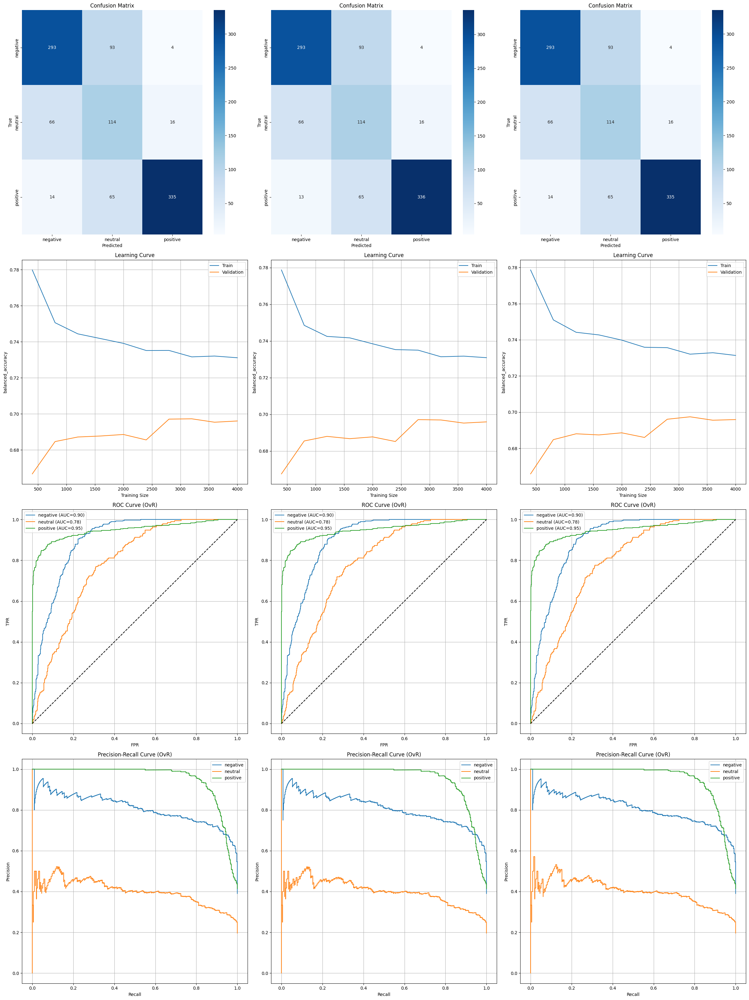

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_doc2vec, doc2vec_X_test, y, doc2vec_y_test, doc2vec_lr_top3_models, doc2vec_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=doc2vec_lr_cv_results_df,
#     base_model=doc2vec_RandomForestClassifier,
#     X=reviews_df_doc2vec,
#     y=y,
#     scoring='balanced_accuracy'
# )

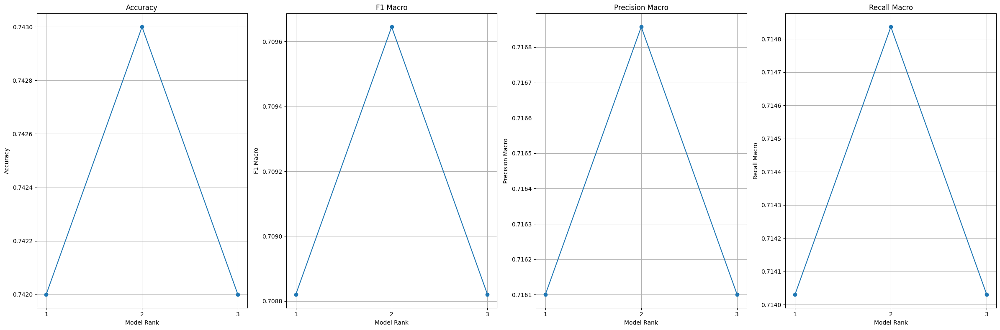

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(doc2vec_lr_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_doc2vec_LinearRegressionClassifier_lbfgsSolver = doc2vec_lr_bayes_searchCV_lbfgsSolverCV.best_estimator_

##### Search Space - saga Solver

In [ ]:
doc2vec_LogisticRegressionClassifier_sagaSolver = LogisticRegression(solver='saga', penalty='elasticnet', max_iter=100,  class_weight='balanced', random_state=42, n_jobs=-1)

doc2vec_lr_search_space_sagaSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform'),
    'l1_ratio': Real(0, 1.0)
}

doc2vec_lr_bayes_searchCV_sagaSolverCV = BayesSearchCV(
    estimator=doc2vec_LogisticRegressionClassifier_sagaSolver,
    search_spaces=doc2vec_lr_search_space_sagaSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True,
    verbose=2  # shows progress
)

doc2vec_lr_sagaSolver_bayes_search = doc2vec_lr_bayes_searchCV_sagaSolverCV.fit(reviews_df_doc2vec, y)

In [ ]:
doc2vec_lr_sagaSolver_cv_results_df = pd.DataFrame(doc2vec_lr_bayes_searchCV_sagaSolverCV.cv_results_)
display(doc2vec_lr_sagaSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
doc2vec_lr_ranked25_df = doc2vec_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score')
doc2vec_lr_top3_df = doc2vec_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
doc2vec_lr_top3_models = []
doc2vec_lr_top3_y_preds = []
doc2vec_lr_top3_metrics = []

for i, row in doc2vec_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(doc2vec_LogisticRegressionClassifier_sagaSolver).set_params(**row['params'])

    # Train and predict
    model.fit(doc2vec_X_train, doc2vec_y_train)
    y_pred = model.predict(doc2vec_X_test)

    report = classification_report(doc2vec_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(doc2vec_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    doc2vec_lr_top3_models.append(model)
    doc2vec_lr_top3_y_preds.append(y_pred)
    doc2vec_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(doc2vec_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.001323284325268669, 'l1_ratio': 0.0008647557723299173})
Classification Report:
               precision    recall  f1-score   support

    negative       0.79      0.75      0.77       390
     neutral       0.42      0.59      0.49       196
    positive       0.95      0.81      0.87       414

    accuracy                           0.74      1000
   macro avg       0.72      0.72      0.71      1000
weighted avg       0.78      0.74      0.76      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.047924711217062856, 'l1_ratio': 1.0})
Classification Report:
               precision    recall  f1-score   support

    negative       0.76      0.74      0.75       390
     neutral       0.40      0.54      0.46       196
    positive       0.94      0.82      0.87       414

    accuracy                           0.73      1000
   macro avg       0.70      0.70      0.70      1000
weighted avg       0.77      0.

/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

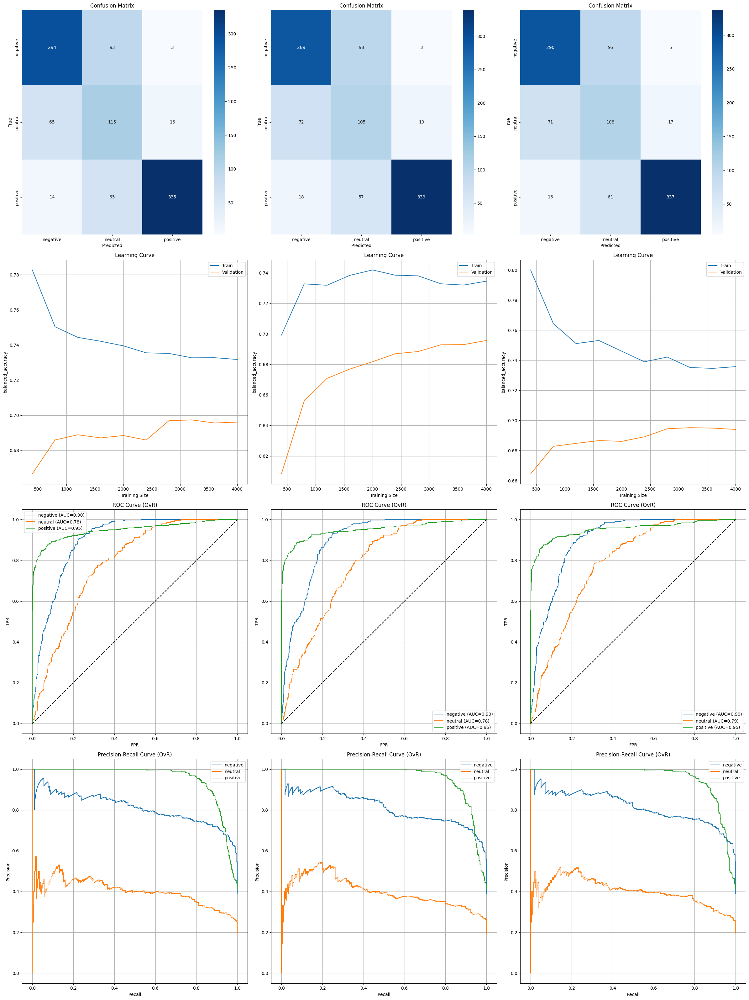

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_doc2vec, doc2vec_X_test, y, doc2vec_y_test, doc2vec_lr_top3_models, doc2vec_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=doc2vec_lr_cv_results_df,
#     base_model=doc2vec_RandomForestClassifier,
#     X=reviews_df_doc2vec,
#     y=y,
#     scoring='balanced_accuracy'
# )

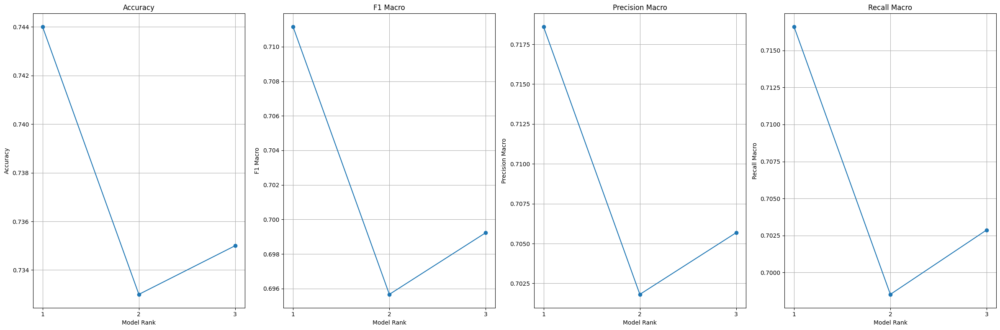

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(doc2vec_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_doc2vec_LinearRegressionClassifier_sagaSolver = doc2vec_lr_bayes_searchCV_sagaSolverCV.best_estimator_

#### LinearSVC Classifier

In [ ]:
doc2vec_LinearSVCClassifier = LinearSVC(class_weight='balanced', dual=False, max_iter=5000, random_state=42)

doc2vec_lsvc_search_space = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

doc2vec_lsvc_bayes_searchCV = BayesSearchCV(
    estimator=doc2vec_LinearSVCClassifier,
    search_spaces=doc2vec_lsvc_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

doc2vec_lsvc_bayes_search = doc2vec_lsvc_bayes_searchCV.fit(reviews_df_doc2vec, y)

In [ ]:
doc2vec_lsvc_cv_results_df = pd.DataFrame(doc2vec_lsvc_bayes_searchCV.cv_results_)
display(doc2vec_lsvc_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
doc2vec_lsvc_ranked25_df = doc2vec_lsvc_cv_results_df.sort_values(by='rank_test_score')
doc2vec_lsvc_top3_df = doc2vec_lsvc_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
doc2vec_lsvc_top3_models = []
doc2vec_lsvc_top3_y_preds = []
doc2vec_lsvc_top3_metrics = []

for i, row in doc2vec_lsvc_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(doc2vec_LinearSVCClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(doc2vec_X_train, doc2vec_y_train)
    y_pred = model.predict(doc2vec_X_test)

    report = classification_report(doc2vec_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(doc2vec_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    doc2vec_lsvc_top3_models.append(model)
    doc2vec_lsvc_top3_y_preds.append(y_pred)
    doc2vec_lsvc_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(doc2vec_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 1.1568753429185403})
Classification Report:
               precision    recall  f1-score   support

    negative       0.75      0.87      0.80       390
     neutral       0.46      0.37      0.41       196
    positive       0.90      0.85      0.88       414

    accuracy                           0.76      1000
   macro avg       0.70      0.70      0.70      1000
weighted avg       0.76      0.76      0.76      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 30.764184800079192})
Classification Report:
               precision    recall  f1-score   support

    negative       0.75      0.87      0.80       390
     neutral       0.46      0.37      0.41       196
    positive       0.90      0.85      0.88       414

    accuracy                           0.76      1000
   macro avg       0.70      0.70      0.70      1000
weighted avg       0.76      0.76      0.76      1000


=== Model Rank: 2 ===
Hyperpara

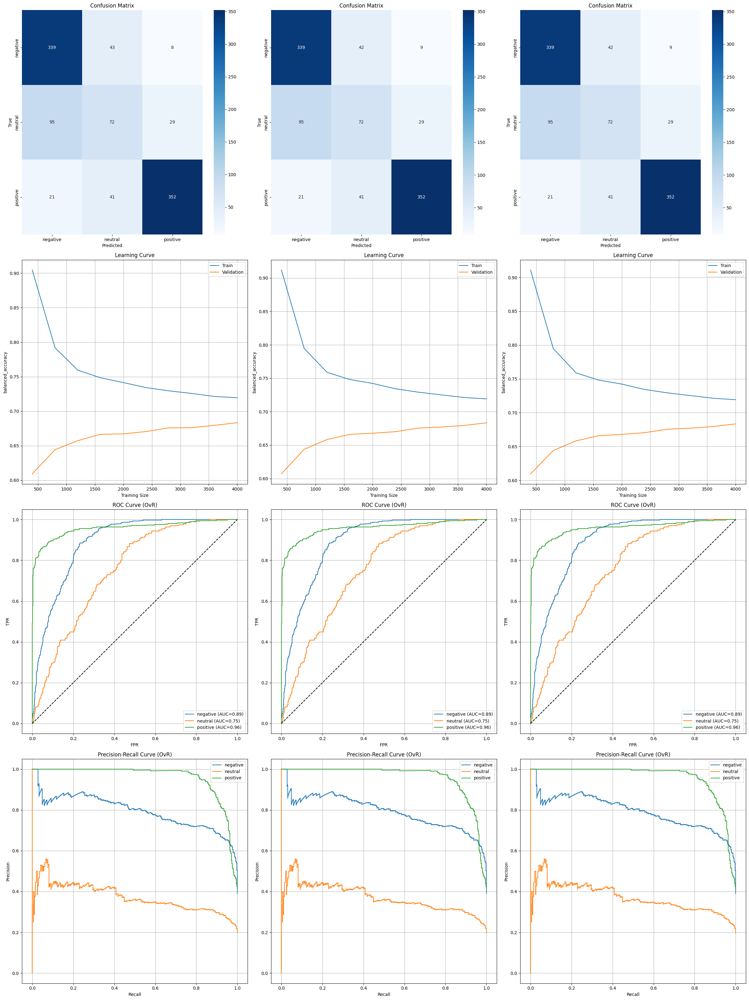

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_doc2vec, doc2vec_X_test, y, doc2vec_y_test, doc2vec_lsvc_top3_models, doc2vec_lsvc_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=doc2vec_rf_cv_results_df,
#     base_model=doc2vec_RandomForestClassifier,
#     X=reviews_df_doc2vec,
#     y=y,
#     scoring='balanced_accuracy'
# )

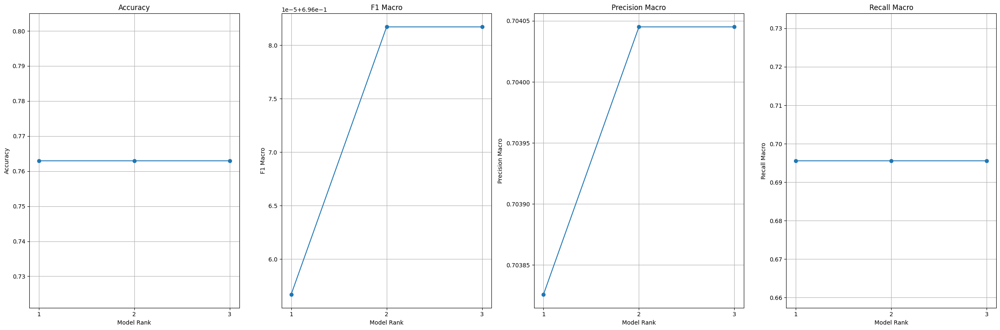

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(doc2vec_lsvc_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_doc2vec_RandomForestClassifier = doc2vec_lsvc_bayes_searchCV.best_estimator_

# Task 5 - Using pre-trained vectors

## Import Reviews Dataframe

In [ ]:
reviews_df_labeled_data = pd.read_csv(r'labeled-data/labeled-dataset-downsampled.csv')

## Prepare Labels

In [ ]:
# Load labels
labels = reviews_df_labeled_data['labeled_sentiment'].values

In [ ]:
display(labels, set(labels))

array(['negative', 'negative', 'negative', ..., 'positive', 'positive',
       'positive'], shape=(5000,), dtype=object)

{'negative', 'neutral', 'positive'}

In [ ]:
# Convert labels to binary or categorical if needed
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(labels)
class_names = label_encoder.classes_  # This holds the original string labels


In [ ]:
display(y, set(y), class_names)

array([0, 0, 0, ..., 2, 2, 2], shape=(5000,))

{np.int64(0), np.int64(1), np.int64(2)}

array(['negative', 'neutral', 'positive'], dtype=object)

## Train & Evaluate Each Classifier

In [ ]:
def plot_confusion_matrix(y_test, y_pred, class_names, ax):
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_title("Confusion Matrix")
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")


def plot_learning_curve(model, X, y, ax, scoring='balanced_accuracy'):
    model = clone(model)
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=5, scoring=scoring,
        train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1, shuffle=True, random_state=42
    )
    train_mean = np.mean(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    ax.plot(train_sizes, train_mean, label="Train")
    ax.plot(train_sizes, test_mean, label="Validation")
    ax.set_title("Learning Curve")
    ax.set_xlabel("Training Size")
    ax.set_ylabel(scoring)
    ax.legend()
    ax.grid(True)


def plot_roc_and_pr_curves(model, X_test, y_test, class_names, axs):
    y_test_bin = label_binarize(y_test, classes=np.arange(len(class_names)))
    n_classes = y_test_bin.shape[1]

    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X_test)
    elif hasattr(model, "decision_function"):
        y_score = model.decision_function(X_test)
    else:
        axs[0].text(0.5, 0.5, 'No prob/decision function available', ha='center', va='center')
        axs[1].axis('off')
        return

    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        axs[0].plot(fpr, tpr, label=f"{class_names[i]} (AUC={roc_auc:.2f})")
        axs[1].step(recall, precision, where='post', label=f"{class_names[i]}")

    axs[0].plot([0, 1], [0, 1], 'k--')
    axs[0].set_title("ROC Curve (OvR)")
    axs[0].set_xlabel("FPR")
    axs[0].set_ylabel("TPR")
    axs[0].legend()
    axs[0].grid(True)

    axs[1].set_title("Precision-Recall Curve (OvR)")
    axs[1].set_xlabel("Recall")
    axs[1].set_ylabel("Precision")
    axs[1].legend()
    axs[1].grid(True)


def evaluate_model(X, X_test, y, y_test, top_models, top_y_preds, class_names):
    fig, axs = plt.subplots(4, 3, figsize=(24, 32))

    for i in range(3):
        # 1. Confusion Matrix
        plot_confusion_matrix(y_test, top_y_preds[i], class_names, axs[0,i])

        # 2. Learning Curve
        plot_learning_curve(top_models[i], X, y, axs[1,i])

        # 3 & 4. ROC and PR Curve
        plot_roc_and_pr_curves(top_models[i], X_test, y_test, class_names, axs[2:4,i])

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_validation_curve(model, X, y, param_name, param_range, ax, scoring='balanced_accuracy'):
    model = clone(model)
    train_scores, test_scores = validation_curve(
        model, X, y, param_name=param_name, param_range=param_range,
        scoring=scoring, cv=5, n_jobs=-1
    )
    train_mean = np.mean(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    ax.plot(param_range, train_mean, label="Train")
    ax.plot(param_range, test_mean, label="Validation")
    ax.set_title(f"Validation Curve for {param_name}")
    ax.set_xlabel(param_name)
    ax.set_ylabel(scoring)
    ax.legend()
    ax.grid(True)

In [ ]:
def plot_top_models_metrics(metrics_list, axs, metric_names=None):
    if metric_names is None:
        metric_names = ['accuracy', 'f1_macro', 'precision_macro', 'recall_macro']

    model_indices = list(range(1, len(metrics_list) + 1))  # 1-based model ranks

    for i, metric in enumerate(metric_names):
        values = [m[metric] for m in metrics_list]

        ax = axs[i]
        ax.plot(model_indices, values, marker='o')
        ax.set_title(metric.replace('_', ' ').title())
        ax.set_xlabel("Model Rank")
        ax.set_ylabel(metric.replace('_', ' ').title())
        ax.set_xticks(model_indices)
        ax.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
# Use MPS (Apple Silicon GPU) if available
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Using device:", device)

MODEL_NAME = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME).to(device)
model.eval()

def get_roberta_embeddings(texts, batch_size=32):
    embeddings = []

    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size)):
            batch = texts[i:i+batch_size]
            encoded = tokenizer(batch, padding=True, truncation=True, return_tensors='pt', max_length=128).to(device)
            output = model(**encoded)
            cls_embeddings = output.last_hidden_state[:, 0, :]  # [CLS] token
            embeddings.append(cls_embeddings.cpu())

    return torch.cat(embeddings, dim=0)

# Assuming your preprocessed reviews are in `reviews_df["clean_text"]`
roberta_embeddings = get_roberta_embeddings(reviews_df_labeled_data["review_text"].tolist())

Using device: mps


100%|██████████| 157/157 [00:28<00:00,  5.42it/s]


In [ ]:
reviews_df_cnxtemb = pd.DataFrame(roberta_embeddings.numpy())

In [ ]:
reviews_df_cnxtemb

## Apply to Contextual Embedding Feature Set

In [ ]:
# Train-test split
cnxtemb_X_train, cnxtemb_X_test, cnxtemb_y_train, cnxtemb_y_test = train_test_split(reviews_df_cnxtemb, y, test_size=0.2, random_state=42)

### Random Forest Classifier

In [ ]:
cnxtemb_RandomForestClassifier = RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1)

cnxtemb_rf_search_space = {
    'n_estimators': Integer(100, 1000),
    'max_depth': [None] + list(np.arange(10, 501, 10)),
    'min_samples_split': Integer(2, 51),
    'min_samples_leaf': Integer(1, 51),
}

cnxtemb_rf_bayes_searchCV = BayesSearchCV(
    estimator=cnxtemb_RandomForestClassifier,
    search_spaces=cnxtemb_rf_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True,
    verbose=2
)

cnxtemb_rf_bayes_search = cnxtemb_rf_bayes_searchCV.fit(reviews_df_cnxtemb, y)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

[CV] END max_depth=200, min_samples_leaf=37, min_samples_split=48, n_estimators=384; total time=   5.4s
[CV] END max_depth=200, min_samples_leaf=37, min_samples_split=48, n_estimators=384; total time=   5.4s
[CV] END max_depth=200, min_samples_leaf=37, min_samples_split=48, n_estimators=384; total time=   5.4s
[CV] END max_depth=200, min_samples_leaf=37, min_samples_split=48, n_estimators=384; total time=   5.4s
[CV] END max_depth=200, min_samples_leaf=37, min_samples_split=48, n_estimators=384; total time=   5.4s
Fitting 5 folds for each of 1 candidates, totalling 5 fits


/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025

[CV] END max_depth=420, min_samples_leaf=45, min_samples_split=17, n_estimators=956; total time=   8.0s
[CV] END max_depth=420, min_samples_leaf=45, min_samples_split=17, n_estimators=956; total time=   8.0s
[CV] END max_depth=420, min_samples_leaf=45, min_samples_split=17, n_estimators=956; total time=   9.3s
[CV] END max_depth=420, min_samples_leaf=45, min_samples_split=17, n_estimators=956; total time=   9.3s
[CV] END max_depth=420, min_samples_leaf=45, min_samples_split=17, n_estimators=956; total time=   9.2s
Fitting 5 folds for each of 1 candidates, totalling 5 fits


/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)


[CV] END max_depth=220, min_samples_leaf=47, min_samples_split=7, n_estimators=490; total time=   4.1s
[CV] END max_depth=220, min_samples_leaf=47, min_samples_split=7, n_estimators=490; total time=   4.1s
[CV] END max_depth=220, min_samples_leaf=47, min_samples_split=7, n_estimators=490; total time=   4.1s


/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)


[CV] END max_depth=220, min_samples_leaf=47, min_samples_split=7, n_estimators=490; total time=   2.6s
[CV] END max_depth=220, min_samples_leaf=47, min_samples_split=7, n_estimators=490; total time=   2.4s
Fitting 5 folds for each of 1 candidates, totalling 5 fits


/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)


[CV] END max_depth=410, min_samples_leaf=10, min_samples_split=31, n_estimators=822; total time=  13.8s
[CV] END max_depth=410, min_samples_leaf=10, min_samples_split=31, n_estimators=822; total time=  13.8s
[CV] END max_depth=410, min_samples_leaf=10, min_samples_split=31, n_estimators=822; total time=  13.8s
[CV] END max_depth=410, min_samples_leaf=10, min_samples_split=31, n_estimators=822; total time=  13.8s
[CV] END max_depth=410, min_samples_leaf=10, min_samples_split=31, n_estimators=822; total time=   9.1s
Fitting 5 folds for each of 1 candidates, totalling 5 fits


/Users/dinithheshan/.pyenv/versions/3.12.4/lib/python3.12/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)


[CV] END max_depth=400, min_samples_leaf=23, min_samples_split=28, n_estimators=744; total time=  10.8s
[CV] END max_depth=400, min_samples_leaf=23, min_samples_split=28, n_estimators=744; total time=  10.8s
[CV] END max_depth=400, min_samples_leaf=23, min_samples_split=28, n_estimators=744; total time=  10.9s
[CV] END max_depth=400, min_samples_leaf=23, min_samples_split=28, n_estimators=744; total time=  11.0s
[CV] END max_depth=400, min_samples_leaf=23, min_samples_split=28, n_estimators=744; total time=   6.9s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END max_depth=370, min_samples_leaf=48, min_samples_split=10, n_estimators=270; total time=   3.6s
[CV] END max_depth=370, min_samples_leaf=48, min_samples_split=10, n_estimators=270; total time=   3.6s
[CV] END max_depth=370, min_samples_leaf=48, min_samples_split=10, n_estimators=270; total time=   3.6s
[CV] END max_depth=370, min_samples_leaf=48, min_samples_split=10, n_estimators=270; total time=   3.6s
[CV] 

In [ ]:
cnxtemb_rf_cv_results_df = pd.DataFrame(cnxtemb_rf_bayes_searchCV.cv_results_)
display(cnxtemb_rf_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
cnxtemb_rf_ranked25_df = cnxtemb_rf_cv_results_df.sort_values(by='rank_test_score')
cnxtemb_rf_top3_df = cnxtemb_rf_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
cnxtemb_rf_top3_models = []
cnxtemb_rf_top3_y_preds = []
cnxtemb_rf_top3_metrics = []

for i, row in cnxtemb_rf_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(cnxtemb_RandomForestClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(cnxtemb_X_train, cnxtemb_y_train)
    y_pred = model.predict(cnxtemb_X_test)

    report = classification_report(cnxtemb_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(cnxtemb_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    cnxtemb_rf_top3_models.append(model)
    cnxtemb_rf_top3_y_preds.append(y_pred)
    cnxtemb_rf_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(cnxtemb_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'max_depth': 400, 'min_samples_leaf': 23, 'min_samples_split': 28, 'n_estimators': 744})
Classification Report:
               precision    recall  f1-score   support

    negative       0.86      0.76      0.81       390
     neutral       0.48      0.66      0.55       196
    positive       0.92      0.85      0.88       414

    accuracy                           0.78      1000
   macro avg       0.75      0.76      0.75      1000
weighted avg       0.81      0.78      0.79      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'max_depth': 120, 'min_samples_leaf': 6, 'min_samples_split': 50, 'n_estimators': 1000})
Classification Report:
               precision    recall  f1-score   support

    negative       0.85      0.78      0.81       390
     neutral       0.49      0.65      0.56       196
    positive       0.92      0.85      0.88       414

    accuracy                           0.78      1000
   macro avg   

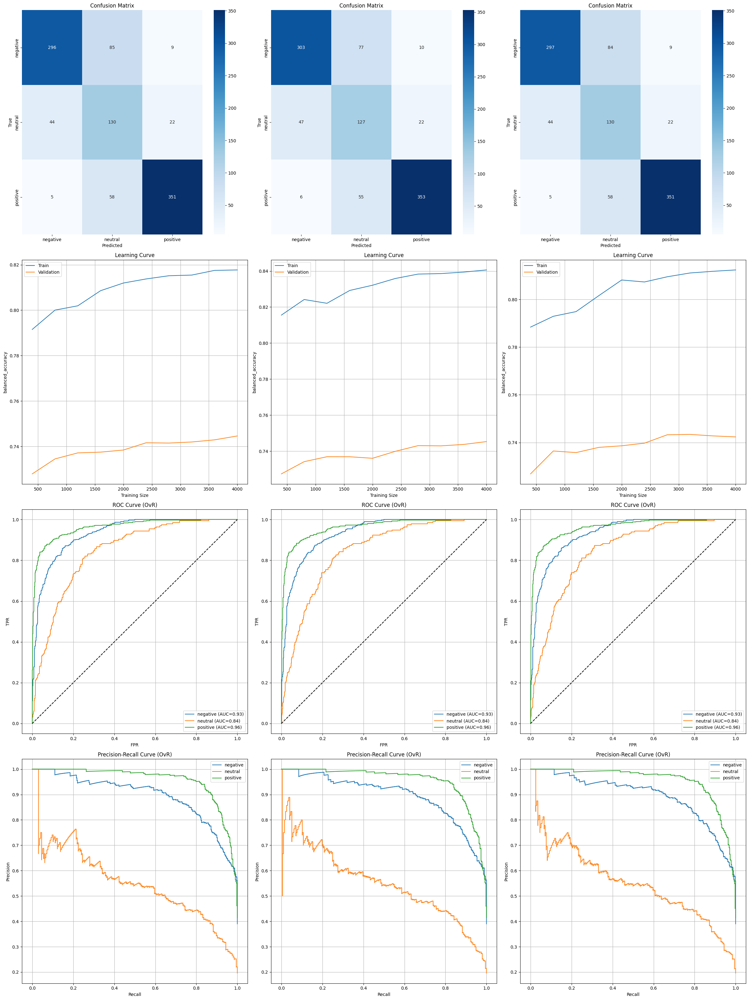

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_cnxtemb, cnxtemb_X_test, y, cnxtemb_y_test, cnxtemb_rf_top3_models, cnxtemb_rf_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=cnxtemb_rf_cv_results_df,
#     base_model=cnxtemb_RandomForestClassifier,
#     X=reviews_df_cnxtemb,
#     y=y,
#     scoring='balanced_accuracy'
# )

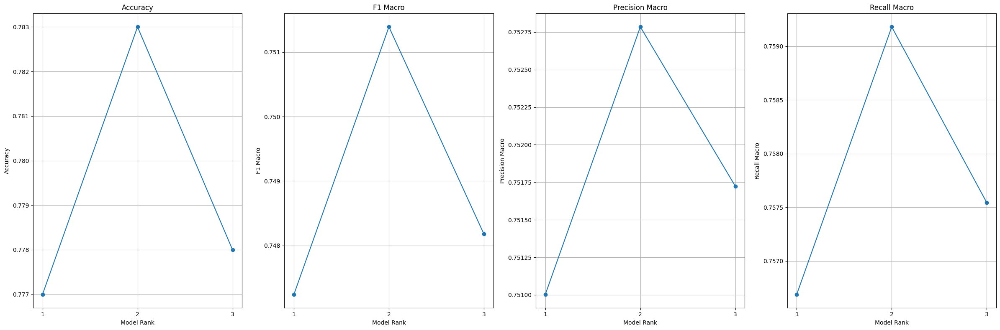

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(cnxtemb_rf_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_cnxtemb_RandomForestClassifier = cnxtemb_rf_bayes_searchCV.best_estimator_

### Logistic Regression Classifier

#### Search Space - liblinear Solver

In [ ]:
cnxtemb_LogisticRegressionClassifier_liblinearSolver = LogisticRegression(solver='liblinear', max_iter=10,  class_weight='balanced', random_state=42, n_jobs=-1)

cnxtemb_lr_search_space_liblinearSolver = {
    'penalty': Categorical(['l1', 'l2']),
    'C': Real(1e-4, 1000, prior='log-uniform'),
}

cnxtemb_lr_bayes_searchCV_liblinearSolverCV = BayesSearchCV(
    estimator=cnxtemb_LogisticRegressionClassifier_liblinearSolver,
    search_spaces=cnxtemb_lr_search_space_liblinearSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

cnxtemb_lr_liblinearSolver_bayes_search = cnxtemb_lr_bayes_searchCV_liblinearSolverCV.fit(reviews_df_cnxtemb, y)

In [ ]:
cnxtemb_lr_liblinearSolver_cv_results_df = pd.DataFrame(cnxtemb_lr_bayes_searchCV_liblinearSolverCV.cv_results_)
display(cnxtemb_lr_liblinearSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
cnxtemb_lr_ranked25_df = cnxtemb_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score')
cnxtemb_lr_top3_df = cnxtemb_lr_liblinearSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
cnxtemb_lr_top3_models = []
cnxtemb_lr_top3_y_preds = []
cnxtemb_lr_top3_metrics = []

for i, row in cnxtemb_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(cnxtemb_LogisticRegressionClassifier_liblinearSolver).set_params(**row['params'])

    # Train and predict
    model.fit(cnxtemb_X_train, cnxtemb_y_train)
    y_pred = model.predict(cnxtemb_X_test)

    report = classification_report(cnxtemb_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(cnxtemb_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    cnxtemb_lr_top3_models.append(model)
    cnxtemb_lr_top3_y_preds.append(y_pred)
    cnxtemb_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(cnxtemb_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.02177423222595416, 'penalty': 'l2'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.85      0.83      0.84       390
     neutral       0.56      0.64      0.60       196
    positive       0.92      0.88      0.90       414

    accuracy                           0.81      1000
   macro avg       0.78      0.78      0.78      1000
weighted avg       0.82      0.81      0.82      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.23122399519831685, 'penalty': 'l1'})
Classification Report:
               precision    recall  f1-score   support

    negative       0.85      0.83      0.84       390
     neutral       0.55      0.65      0.60       196
    positive       0.93      0.87      0.90       414

    accuracy                           0.81      1000
   macro avg       0.78      0.78      0.78      1000
weighted avg       0.82      0.81      0.82      10

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

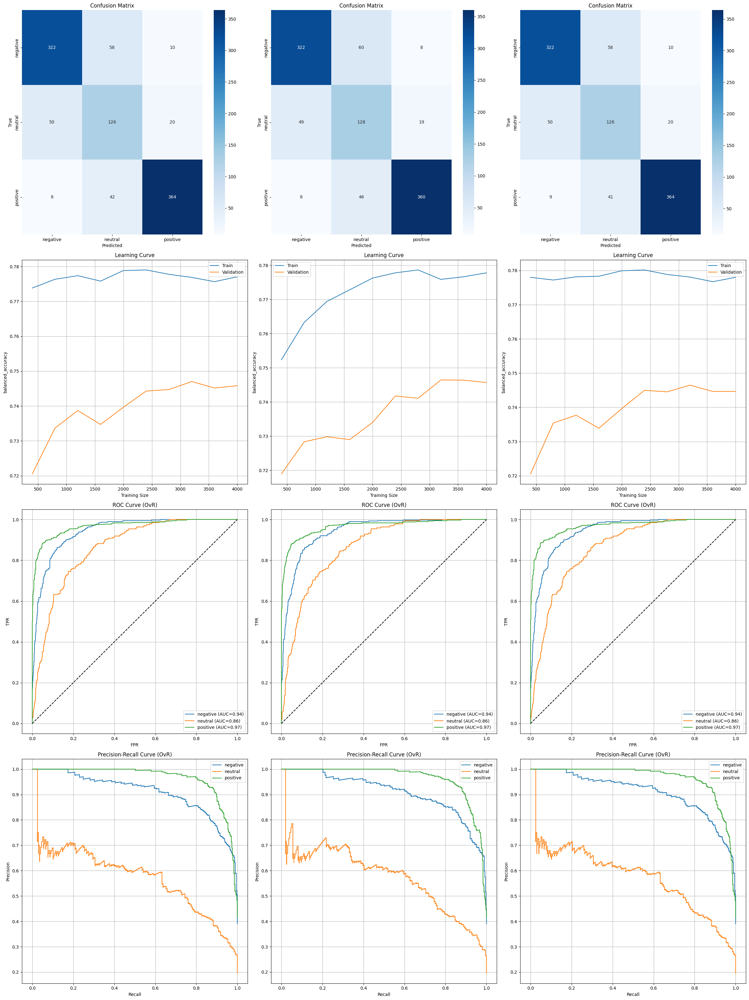

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_cnxtemb, cnxtemb_X_test, y, cnxtemb_y_test, cnxtemb_lr_top3_models, cnxtemb_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=cnxtemb_lr_cv_results_df,
#     base_model=cnxtemb_RandomForestClassifier,
#     X=reviews_df_cnxtemb,
#     y=y,
#     scoring='balanced_accuracy'
# )

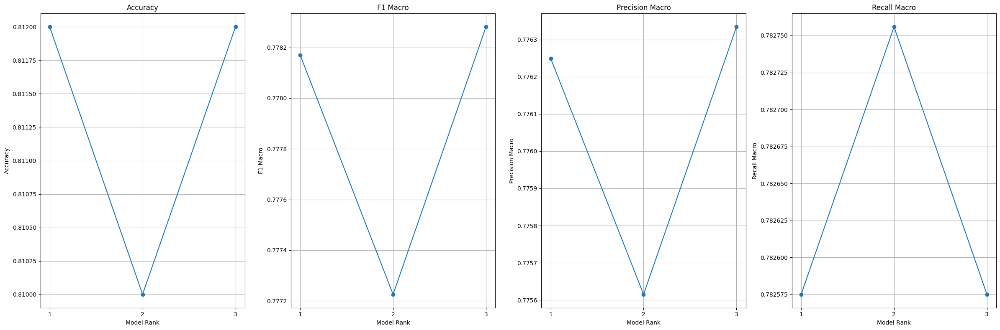

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(cnxtemb_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_cnxtemb_LinearRegressionClassifier_liblinearSolver = cnxtemb_lr_bayes_searchCV_liblinearSolverCV.best_estimator_

#### Search Space - lbfgs Solver

In [ ]:
cnxtemb_LogisticRegressionClassifier_lbfgsSolver = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=100,  class_weight='balanced', random_state=42, n_jobs=-1)

cnxtemb_lr_search_space_lbfgsSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

cnxtemb_lr_bayes_searchCV_lbfgsSolverCV = BayesSearchCV(
    estimator=cnxtemb_LogisticRegressionClassifier_lbfgsSolver,
    search_spaces=cnxtemb_lr_search_space_lbfgsSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True
)

cnxtemb_lr_lbfgsSolver_bayes_search = cnxtemb_lr_bayes_searchCV_lbfgsSolverCV.fit(reviews_df_cnxtemb, y)

In [ ]:
cnxtemb_lr_lbfgsSolver_cv_results_df = pd.DataFrame(cnxtemb_lr_bayes_searchCV_lbfgsSolverCV.cv_results_)
display(cnxtemb_lr_lbfgsSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
cnxtemb_lr_ranked25_df = cnxtemb_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score')
cnxtemb_lr_top3_df = cnxtemb_lr_lbfgsSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
cnxtemb_lr_top3_models = []
cnxtemb_lr_top3_y_preds = []
cnxtemb_lr_top3_metrics = []

for i, row in cnxtemb_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(cnxtemb_LogisticRegressionClassifier_lbfgsSolver).set_params(**row['params'])

    # Train and predict
    model.fit(cnxtemb_X_train, cnxtemb_y_train)
    y_pred = model.predict(cnxtemb_X_test)

    report = classification_report(cnxtemb_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(cnxtemb_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    cnxtemb_lr_top3_models.append(model)
    cnxtemb_lr_top3_y_preds.append(y_pred)
    cnxtemb_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(cnxtemb_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.003987394969678411})
Classification Report:
               precision    recall  f1-score   support

    negative       0.86      0.75      0.80       390
     neutral       0.49      0.70      0.57       196
    positive       0.93      0.85      0.89       414

    accuracy                           0.78      1000
   macro avg       0.76      0.77      0.75      1000
weighted avg       0.82      0.78      0.79      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.004963053238377882})
Classification Report:
               precision    recall  f1-score   support

    negative       0.86      0.75      0.80       390
     neutral       0.49      0.70      0.58       196
    positive       0.93      0.86      0.89       414

    accuracy                           0.79      1000
   macro avg       0.76      0.77      0.76      1000
weighted avg       0.82      0.79      0.80      1000


=== Model Rank: 3 ===
Hyper

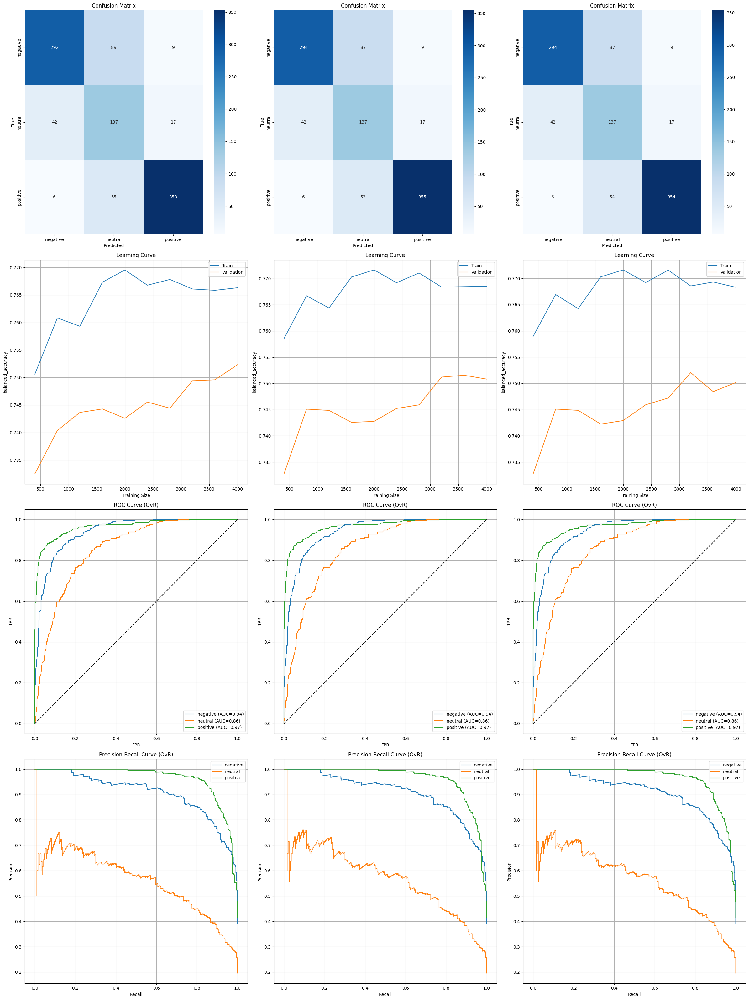

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_cnxtemb, cnxtemb_X_test, y, cnxtemb_y_test, cnxtemb_lr_top3_models, cnxtemb_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=cnxtemb_lr_cv_results_df,
#     base_model=cnxtemb_RandomForestClassifier,
#     X=reviews_df_cnxtemb,
#     y=y,
#     scoring='balanced_accuracy'
# )

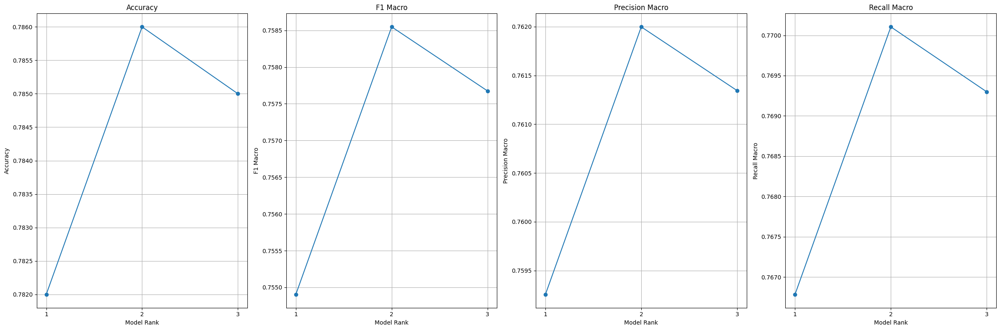

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(cnxtemb_lr_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_cnxtemb_LinearRegressionClassifier_lbfgsSolver = cnxtemb_lr_bayes_searchCV_lbfgsSolverCV.best_estimator_

#### Search Space - saga Solver

In [ ]:
cnxtemb_LogisticRegressionClassifier_sagaSolver = LogisticRegression(solver='saga', penalty='elasticnet', max_iter=100,  class_weight='balanced', random_state=42, n_jobs=-1)

cnxtemb_lr_search_space_sagaSolver = {
    'C': Real(1e-4, 1000, prior='log-uniform'),
    'l1_ratio': Real(0, 1.0)
}

cnxtemb_lr_bayes_searchCV_sagaSolverCV = BayesSearchCV(
    estimator=cnxtemb_LogisticRegressionClassifier_sagaSolver,
    search_spaces=cnxtemb_lr_search_space_sagaSolver,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    random_state=42,
    return_train_score=True,
    verbose=2  # shows progress
)

cnxtemb_lr_sagaSolver_bayes_search = cnxtemb_lr_bayes_searchCV_sagaSolverCV.fit(reviews_df_cnxtemb, y)

In [ ]:
cnxtemb_lr_sagaSolver_cv_results_df = pd.DataFrame(cnxtemb_lr_bayes_searchCV_sagaSolverCV.cv_results_)
display(cnxtemb_lr_sagaSolver_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
cnxtemb_lr_ranked25_df = cnxtemb_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score')
cnxtemb_lr_top3_df = cnxtemb_lr_sagaSolver_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
cnxtemb_lr_top3_models = []
cnxtemb_lr_top3_y_preds = []
cnxtemb_lr_top3_metrics = []

for i, row in cnxtemb_lr_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(cnxtemb_LogisticRegressionClassifier_sagaSolver).set_params(**row['params'])

    # Train and predict
    model.fit(cnxtemb_X_train, cnxtemb_y_train)
    y_pred = model.predict(cnxtemb_X_test)

    report = classification_report(cnxtemb_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(cnxtemb_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    cnxtemb_lr_top3_models.append(model)
    cnxtemb_lr_top3_y_preds.append(y_pred)
    cnxtemb_lr_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(cnxtemb_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.003966815121855774, 'l1_ratio': 0.0})
Classification Report:
               precision    recall  f1-score   support

    negative       0.86      0.75      0.80       390
     neutral       0.49      0.70      0.58       196
    positive       0.93      0.86      0.89       414

    accuracy                           0.78      1000
   macro avg       0.76      0.77      0.76      1000
weighted avg       0.82      0.78      0.79      1000


=== Model Rank: 2 ===
Hyperparameters: OrderedDict({'C': 0.008594623383752206, 'l1_ratio': 0.01951471557719831})
Classification Report:
               precision    recall  f1-score   support

    negative       0.86      0.75      0.80       390
     neutral       0.50      0.70      0.58       196
    positive       0.93      0.86      0.89       414

    accuracy                           0.79      1000
   macro avg       0.76      0.77      0.76      1000
weighted avg       0.82      0.79

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

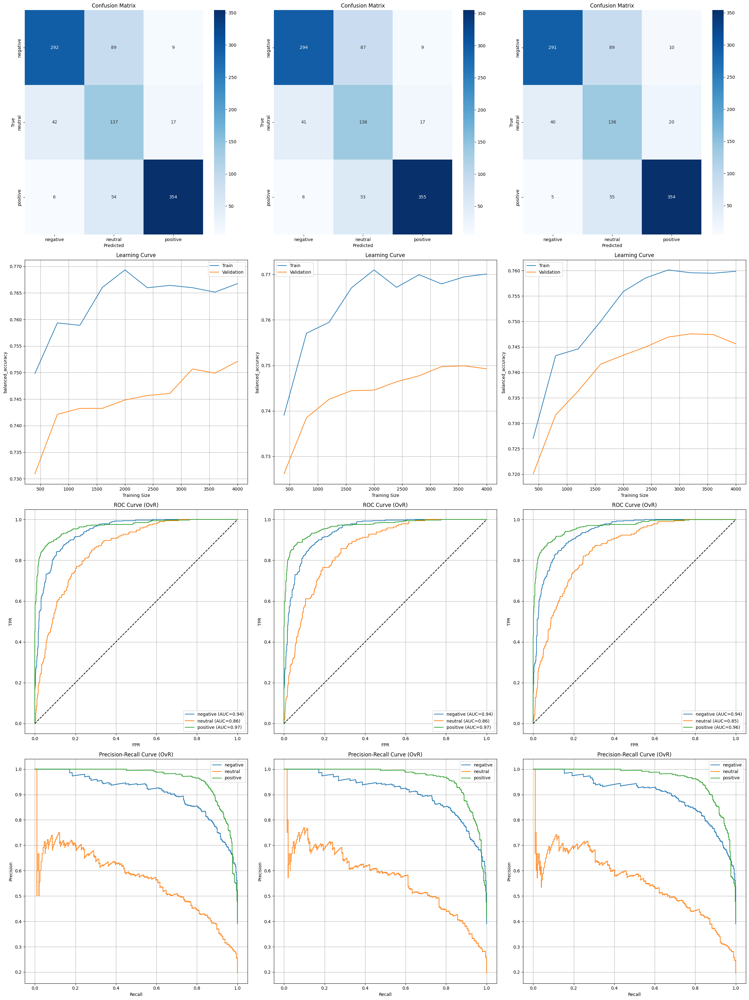

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_cnxtemb, cnxtemb_X_test, y, cnxtemb_y_test, cnxtemb_lr_top3_models, cnxtemb_lr_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=cnxtemb_lr_cv_results_df,
#     base_model=cnxtemb_RandomForestClassifier,
#     X=reviews_df_cnxtemb,
#     y=y,
#     scoring='balanced_accuracy'
# )

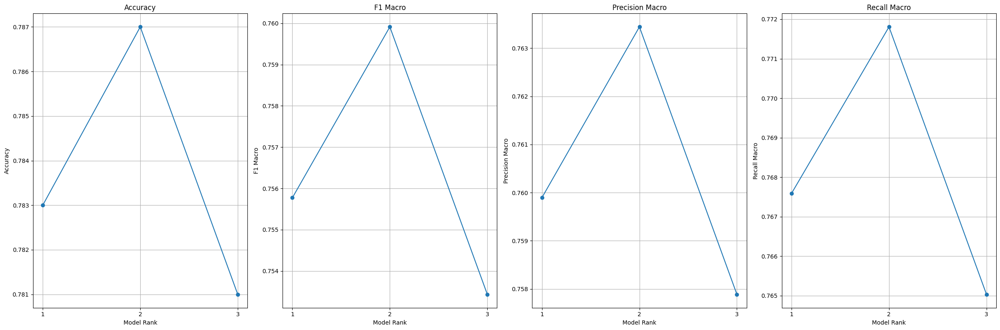

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(cnxtemb_lr_top3_metrics, flat_axs[0:4])

In [ ]:
# Get the best tuned model from BayesSearchCV
best_cnxtemb_LinearRegressionClassifier_sagaSolver = cnxtemb_lr_bayes_searchCV_sagaSolverCV.best_estimator_

### LinearSVC Classifier

In [ ]:
cnxtemb_LinearSVCClassifier = LinearSVC(class_weight='balanced', dual=False, max_iter=5000, random_state=42)

cnxtemb_lsvc_search_space = {
    'C': Real(1e-4, 1000, prior='log-uniform')
}

cnxtemb_lsvc_bayes_searchCV = BayesSearchCV(
    estimator=cnxtemb_LinearSVCClassifier,
    search_spaces=cnxtemb_lsvc_search_space,
    n_iter=25,  # number of total models to evaluate
    cv=5,
    scoring='balanced_accuracy',
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

cnxtemb_lsvc_bayes_search = cnxtemb_lsvc_bayes_searchCV.fit(reviews_df_cnxtemb, y)

In [ ]:
cnxtemb_lsvc_cv_results_df = pd.DataFrame(cnxtemb_lsvc_bayes_searchCV.cv_results_)
display(cnxtemb_lsvc_cv_results_df[['params', 'mean_test_score', 'std_test_score', 'mean_train_score', 'std_train_score', 'rank_test_score']])

In [ ]:
# Sort by best mean_test_score
cnxtemb_lsvc_ranked25_df = cnxtemb_lsvc_cv_results_df.sort_values(by='rank_test_score')
cnxtemb_lsvc_top3_df = cnxtemb_lsvc_cv_results_df.sort_values(by='rank_test_score').head(3)

# Store metrics and models
cnxtemb_lsvc_top3_models = []
cnxtemb_lsvc_top3_y_preds = []
cnxtemb_lsvc_top3_metrics = []

for i, row in cnxtemb_lsvc_top3_df.iterrows():
    # Clone base model and set best params
    model = clone(cnxtemb_LinearSVCClassifier).set_params(**row['params'])

    # Train and predict
    model.fit(cnxtemb_X_train, cnxtemb_y_train)
    y_pred = model.predict(cnxtemb_X_test)

    report = classification_report(cnxtemb_y_test, y_pred, output_dict=True)
    
    metrics =  {
        'accuracy': accuracy_score(cnxtemb_y_test, y_pred),
        'f1_macro': report['macro avg']['f1-score'],
        'precision_macro': report['macro avg']['precision'],
        'recall_macro': report['macro avg']['recall']
    }

    # Summary metrics
    cnxtemb_lsvc_top3_models.append(model)
    cnxtemb_lsvc_top3_y_preds.append(y_pred)
    cnxtemb_lsvc_top3_metrics.append(metrics)

    print(f"\n=== Model Rank: {row['rank_test_score']} ===")
    print(f"Hyperparameters: {row['params']}")
    print("Classification Report:\n", classification_report(cnxtemb_y_test, y_pred, target_names=class_names))


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.0011148455936788942})
Classification Report:
               precision    recall  f1-score   support

    negative       0.84      0.81      0.83       390
     neutral       0.53      0.63      0.58       196
    positive       0.92      0.87      0.90       414

    accuracy                           0.80      1000
   macro avg       0.77      0.77      0.77      1000
weighted avg       0.81      0.80      0.81      1000


=== Model Rank: 1 ===
Hyperparameters: OrderedDict({'C': 0.0011184934337321582})
Classification Report:
               precision    recall  f1-score   support

    negative       0.84      0.81      0.83       390
     neutral       0.53      0.63      0.58       196
    positive       0.92      0.87      0.90       414

    accuracy                           0.80      1000
   macro avg       0.77      0.77      0.77      1000
weighted avg       0.81      0.80      0.81      1000


=== Model Rank: 1 ===
Hyp

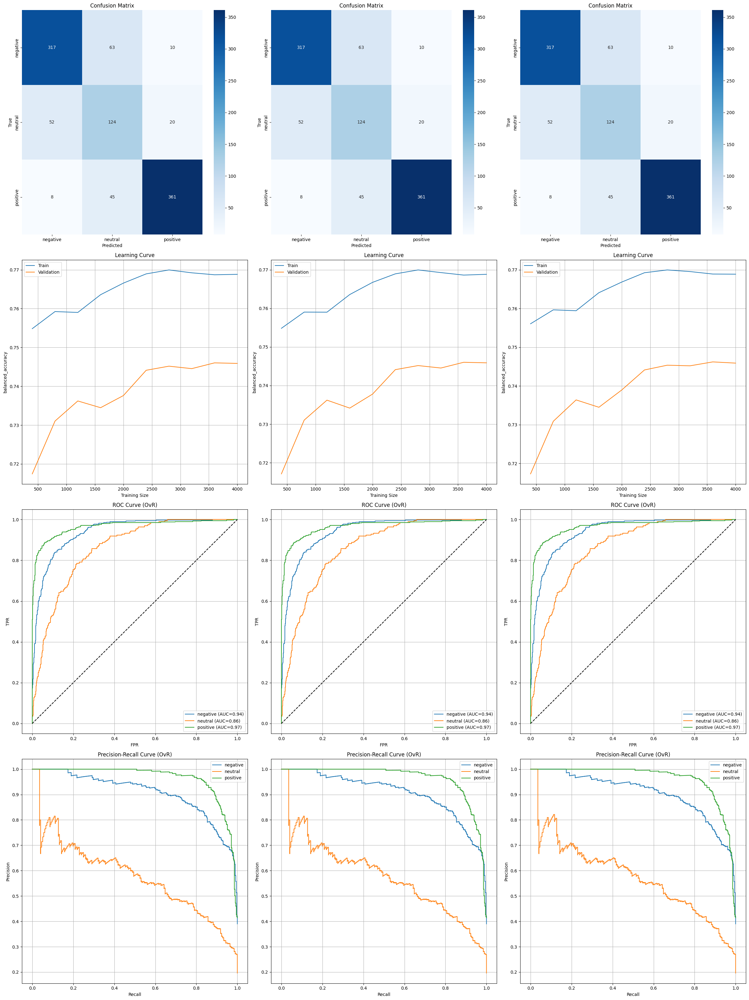

In [ ]:
# Top 3 Models Comparission (1,2,3)
evaluate_model(reviews_df_cnxtemb, cnxtemb_X_test, y, cnxtemb_y_test, cnxtemb_lsvc_top3_models, cnxtemb_lsvc_top3_y_preds, class_names)

In [ ]:
# def plot_validation_curves_from_search_df(results_df, base_model, X, y, scoring='balanced_accuracy'):
#     # Get the best hyperparameter set
#     best_params = results_df.sort_values(by='rank_test_score').iloc[0]['params']

#     # Extract all parameter names
#     param_names = list(best_params.keys())

#     n_params = len(param_names)
#     fig, axs = plt.subplots(n_params, 1, figsize=(8, 8 * n_params))

#     for i, param_name in enumerate(param_names):
#         # Get unique tried values for this param
#         raw_values = {row[param_name] for row in results_df['params']}
#         param_range = sorted(raw_values, key=lambda x: float('inf') if x is None else x)

#         # Use best params for all others
#         fixed_params = {k: v for k, v in best_params.items() if k != param_name}
#         model = clone(base_model).set_params(**fixed_params)

#         # Plot
#         plot_validation_curve(model, X, y, param_name, param_range, axs[i], scoring=scoring)

#     plt.tight_layout()
#     plt.show()

In [ ]:
# plot_validation_curves_from_search_df(
#     results_df=cnxtemb_rf_cv_results_df,
#     base_model=cnxtemb_RandomForestClassifier,
#     X=reviews_df_cnxtemb,
#     y=y,
#     scoring='balanced_accuracy'
# )

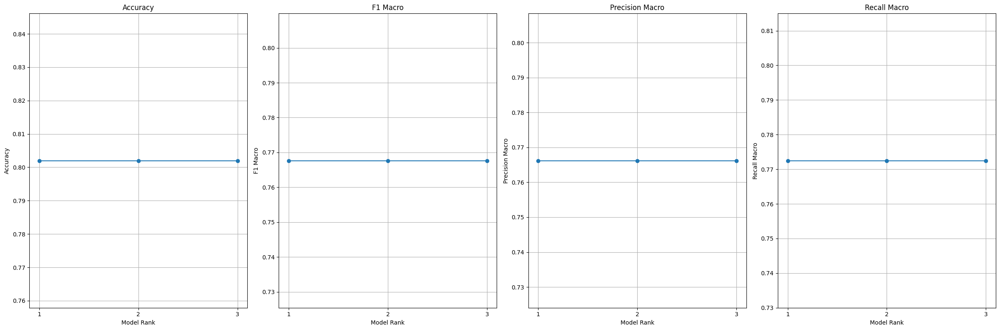

In [ ]:
# Top 3 Models Comparission (1,2,3)
fig, axs = plt.subplots(1, 4, figsize=(24, 8))
flat_axs = axs.flatten()
plot_top_models_metrics(cnxtemb_lsvc_top3_metrics, flat_axs)

In [ ]:
# Get the best tuned model from BayesSearchCV
best_cnxtemb_RandomForestClassifier = cnxtemb_lsvc_bayes_searchCV.best_estimator_

## Deep-Learning Model

In [ ]:
class FFNClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim=256, dropout=0.3, num_classes=3):
        super(FFNClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        return self.fc2(x)


In [ ]:
X = roberta_embeddings.numpy()  # already extracted
y = LabelEncoder().fit_transform(reviews_df_cnxtemb["label"])  # encode string labels

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)


In [ ]:
BATCH_SIZE = 64

train_dataset = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.long))
test_dataset = TensorDataset(torch.tensor(X_test, dtype=torch.float32), torch.tensor(y_test, dtype=torch.long))

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)


In [ ]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

model = FFNClassifier(input_dim=X.shape[1]).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

EPOCHS = 10

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {total_loss:.4f}")


In [ ]:
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for xb, yb in test_loader:
        xb = xb.to(device)
        preds = model(xb)
        all_preds.extend(torch.argmax(preds, dim=1).cpu().numpy())
        all_labels.extend(yb.numpy())

print(classification_report(all_labels, all_preds, target_names=class_names))
